In [1]:
from collections import Counter, defaultdict
import time
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import itertools
import random as r
import statistics as stats
from docx import Document
from tabulate import tabulate
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import (auc, average_precision_score, 
                              roc_auc_score, roc_curve, precision_recall_curve)
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.linear_model import LinearRegression
import seaborn as sns
from sklearn.base import BaseEstimator

import warnings
warnings.filterwarnings('ignore')


plt.rcParams.update({'font.size': 12})

In [2]:
sns.set(style="darkgrid")

# Detección de outliers: aproximación con Grafos

### Objetivo

El objetivo de este archivo es detectar login fraudulentos a partir de redes armadas para cada user id de la muestra. 

Se toman las variables seleccionadas a partir del análisis hecho en **py_graphos_variables.ipyn**  y se arman las redes para detectar outliers. 


### Metodología

Se armarán redes para cada id_usuario, con las variables preseleccionadas. Luego a través de métricas, se decide un umbral óptimo a partir del cual un nodo particular se puede considerar outlier. 

Las métricas analizadas serán Grado del Nodo, grado medio del nodo, grado ponderado por los pesos. 

---------------------------------
Métricas:
Tomar el grado de los nodos (numero de enlaces que lo conectan), para cada nodo de la red. 
Distribucion del grado del nodo: calcular para todos los nodos, cual es la probabilidad de que un nodo elegido al azar tenga grado k.
Luego armar la distribucion del grado del nodo, y ver donde convienen. Aramar para diferentes k (grado) y ver cual es el optimo, segun la tasa de deteccion 
de outliers y falso positivo. 

-----------------------------------


Las redes serán no dirigidas y con pesos. 
* Ejes: Los ejes tienen atributo "peso" (Weight) que va de 1 a N (N cantidad de variables)
* Nodos: los nodos tienen atributo "fraude" (1 en caso de que sea fraude, 0 en caso de que no)

Entre dos nodos, mayor será el peso del eje que los une, segun cuantos valores compartan en las variables consideradas.



Deteccion de outliers con grafos


Armo redes para cada id_usuario, con las variables preseleccionadas en el esquema de red anterior. Con lo armado, decido un umbral optimo a partir del cual es outlier. Si las conexiones con los demas nodos pesan menos de x, o la suma total, o el promedio, o la mediana (ver qué metrica me sirve), es considerado outlier. 



### Output del Archivo

- Un grapho para cada User id, con la correspondiente Red que se desprende para ese user. La idea es tomar algunos ejemplos y poner las imagenes en la tesis


#### 1. Cargo la data
    1.1. Cargo Data de fraude y no fraudes: data y data_nf. Guardo todas las variables como str 
    
    1.2. Relleno los null con '9999' ya que me interesa que relacione null
    
    1.3. Hago las transformaciones de variables que considero apropiadas
    
    1.4. Tomo las variables para las que quiero hacer el análisis
    

In [3]:
# genero el DataFrame "data" con la data principal, que son los usuarios que presentan casos de fraude

data = pd.read_excel(open('raw_data_estafas.xlsx', 'rb'),
                     converters = {
                         'hora_evento':str, 'user_tuvo_estafa':str, 'Label':str, 'id_evento':str, 'id_usuario':str, 'id_sesion':str,
                         'fecha':str, 'hash_usuario':str, 'tipo_evento':str, 'score':str, 'regla_1_riesgo':str,
                         'score_1_riesgo':str, 'regla_2_riesgo':str, 'score_2_riesgo':str, 'regla_3_riesgo':str,
                         'score_3_riesgo':str, 'regla_4_riesgo':str, 'score_4_riesgo':str, 'decision':str, 'cookie':str,
                         'agente_busqueda_hash':str, 'huella_software_hash':str, 'plugin_navegador_hash':str,
                         'pantalla_hash':str, 'lenguaje_sistema_operativo':str, 'lenguaje_usuario':str, 'lenguaje_navegador_detalles':str,
                         'lenguaje_navegador':str, 'zona_horaria':str, 'ip_address':str, 'ip_pais':str, 'ip_region':str,
                         'ip_ciudad':str, 'ip_isp':str, 'canal':str, 'cookie_persistent':str, 'data_1':str,
                         'data_2':str, 'data_4':str, 'data_5':str, 'data_7':str, 'data_8':str, 'data_9':str, 
                         'data_13':str, 'data_29':str, 'data_30':str, 'data_31':str, 'data_37':str, 'data_40':str,
                         'data_41':str, 'data_42':str, 'data_43':str, 'data_44':str, 'data_45':str, 'data_56':str,
                         'data_60':str, 'data_77':str, 'data_78':str, 'data_80':str, 'data_82':str, 'data_83':str,
                         'data_3':str, 'antiguedad_cookies':str, 'data_100':str, 'data_107':str, 'antiguedad_device':str, 'data_115':str, 
                         'velocity_isp_web_10d':str, 'velocity_isp_web_30d':str, 'velocity_isp_mobile_10d':str,
                         'velocity_isp_mobile_30d':str, 'antiguedad_geodata':str, 'sistema_operativo':str, 'navegador_nombre':str,
                         'navegador_version':str, 'rdp_trojan_collection_status':str, 'ip_isp_nombre':str
                     }
                    )


# relleno los null con un valor, para que no de error, ademas me interesa que los null compartan eje
data.fillna('9999', inplace = True) 


# genero la variable 'navegador_caract que concatena  'navegador_nombre' con 'navegador_version'
data['navegador_caract'] = data['navegador_nombre'] + data['navegador_version']

# tambien genero una nueva variable user_caract a partir de las 4 variables HASH: 
data['user_caract'] = data['agente_busqueda_hash'] + '_'+ data['huella_software_hash'] + '_' + data['plugin_navegador_hash'] + '_'+ data['pantalla_hash']

In [4]:
# cantidad de usuarios con episodio de fraude que disponemos para el analisis
len(list(data['id_usuario'].unique()))

61

In [5]:
# genero el DataFrame "data_nf", que son los usuarios que NO presentan casos de fraude

data_nf = pd.read_excel(open('raw_data_no_estafas.xlsx', 'rb'),
                     converters = {
                         'hora_evento':str, 'user_tuvo_estafa':str, 'Label':str, 'id_evento':str, 'id_usuario':str, 'id_sesion':str,
                         'fecha':str, 'hash_usuario':str, 'tipo_evento':str, 'score':str, 'regla_1_riesgo':str,
                         'score_1_riesgo':str, 'regla_2_riesgo':str, 'score_2_riesgo':str, 'regla_3_riesgo':str,
                         'score_3_riesgo':str, 'regla_4_riesgo':str, 'score_4_riesgo':str, 'decision':str, 'cookie':str,
                         'agente_busqueda_hash':str, 'huella_software_hash':str, 'plugin_navegador_hash':str,
                         'pantalla_hash':str, 'lenguaje_sistema_operativo':str, 'lenguaje_usuario':str, 'lenguaje_navegador_detalles':str,
                         'lenguaje_navegador':str, 'zona_horaria':str, 'ip_address':str, 'ip_pais':str, 'ip_region':str,
                         'ip_ciudad':str, 'ip_isp':str, 'canal':str, 'cookie_persistent':str, 'data_1':str,
                         'data_2':str, 'data_4':str, 'data_5':str, 'data_7':str, 'data_8':str, 'data_9':str, 
                         'data_13':str, 'data_29':str, 'data_30':str, 'data_31':str, 'data_37':str, 'data_40':str,
                         'data_41':str, 'data_42':str, 'data_43':str, 'data_44':str, 'data_45':str, 'data_56':str,
                         'data_60':str, 'data_77':str, 'data_78':str, 'data_80':str, 'data_82':str, 'data_83':str,
                         'data_3':str, 'antiguedad_cookies':str, 'data_100':str, 'data_107':str, 'antiguedad_device':str, 'data_115':str, 
                         'velocity_isp_web_10d':str, 'velocity_isp_web_30d':str, 'velocity_isp_mobile_10d':str,
                         'velocity_isp_mobile_30d':str, 'antiguedad_geodata':str, 'sistema_operativo':str, 'navegador_nombre':str,
                         'navegador_version':str, 'rdp_trojan_collection_status':str, 'ip_isp_nombre':str
                     }
                    )

# relleno los null con un valor, para que no de error, ademas me interesa que los null compartan eje
data_nf.fillna('9999', inplace = True) 


# genero la variable 'navegador_caract que concatena  'navegador_nombre' con 'navegador_version'
data_nf['navegador_caract'] = data_nf['navegador_nombre'] + data_nf['navegador_version']

# tambien genero una nueva variable user_caract a partir de las 4 variables HASH: 
data_nf['user_caract'] = data_nf['agente_busqueda_hash'] + '_'+ data_nf['huella_software_hash'] + '_' + data_nf['plugin_navegador_hash'] + '_'+ data_nf['pantalla_hash']


In [6]:
# cantidad de usuarios sin episodio de fraude que disponemos para el analisis
len(list(data_nf['id_usuario'].unique()))

279

In [7]:
# vars_for_grafo todas las SI
vars_for_grafo = ['id_usuario','Label','ip_address','regla_1_riesgo','pantalla_hash','lenguaje_navegador_detalles','lenguaje_navegador',
                 'ip_region','ip_ciudad','ip_isp','data_30','data_31','data_80','data_83','antiguedad_geodata']

vars_for_grafo_1 = ['id_usuario','Label','ip_address','regla_1_riesgo','regla_2_riesgo',
                  'user_caract','lenguaje_navegador_detalles','lenguaje_navegador','ip_region','ip_ciudad','ip_isp',
                  'sistema_operativo','navegador_caract']



# # vars_for_grafo_2 todas las SI + todas duda
vars_for_grafo_2 = ['id_usuario','Label','ip_address','regla_1_riesgo','pantalla_hash','lenguaje_navegador_detalles','lenguaje_navegador',
                    'ip_region','ip_ciudad','ip_isp','data_30','data_31','data_80','data_83','antiguedad_geodata',
                    'huella_software_hash','canal','data_5','sistema_operativo','navegador_version',
                    'navegador_caract']    



# mi criterio 
vars_for_grafo_3 = ['id_usuario','Label','ip_address','pantalla_hash','lenguaje_navegador','ip_region','ip_isp','data_80','data_83',
                    'huella_software_hash','canal','navegador_caract','data_77','user_caract']




vars_for_grafo_4 =  ['id_usuario','Label','data_30','pantalla_hash','lenguaje_navegador','ip_region','ip_isp','data_80','data_83',
                    'huella_software_hash','canal','navegador_caract','data_77','user_caract']


vars_for_grafo_5 =  ['id_usuario','Label','data_31','pantalla_hash','lenguaje_navegador','ip_region','ip_isp','data_80','data_83',
                    'huella_software_hash','canal','navegador_caract','data_77','user_caract']



vars_for_grafo_6 = ['id_usuario','Label','ip_address','regla_1_riesgo','agente_busqueda_hash','huella_software_hash',
                    'plugin_navegador_hash','pantalla_hash','lenguaje_navegador_detalles','lenguaje_navegador','ip_region','ip_ciudad','ip_isp',
                    'data_30','data_31','data_80','data_83']


# variantes de la 1:

# sin ip address
vars_for_grafo_7 = ['id_usuario','Label','regla_1_riesgo','regla_2_riesgo',
                  'user_caract','lenguaje_navegador_detalles','lenguaje_navegador','ip_region','ip_ciudad','ip_isp',
                  'sistema_operativo','navegador_caract']

# data_31 en lugar de ip address
vars_for_grafo_8 = ['id_usuario','Label','data_31','regla_1_riesgo','regla_2_riesgo',
                  'user_caract','lenguaje_navegador_detalles','lenguaje_navegador','ip_region','ip_ciudad','ip_isp',
                  'sistema_operativo','navegador_caract']

# le agrego data_77
vars_for_grafo_9 = ['id_usuario','Label','ip_address','regla_1_riesgo','regla_2_riesgo',
                  'user_caract','lenguaje_navegador_detalles','lenguaje_navegador','ip_region','ip_ciudad','ip_isp',
                  'sistema_operativo','navegador_caract',"data_77"]


# sin regla_2_riesgo
vars_for_grafo_10 = ['id_usuario','Label','ip_address','regla_1_riesgo',
                  'user_caract','lenguaje_navegador_detalles','lenguaje_navegador','ip_region','ip_ciudad','ip_isp',
                  'sistema_operativo','navegador_caract']

In [8]:
data.head()

,hora_evento,user_tuvo_estafa,Label,id_evento,id_usuario,id_sesion,fecha,hash_usuario,tipo_evento,score,...,velocity_isp_mobile_10d,velocity_isp_mobile_30d,antiguedad_geodata,sistema_operativo,navegador_nombre,navegador_version,rdp_trojan_collection_status,ip_isp_nombre,navegador_caract,user_caract
0,2021-01-29 23:40:21.070,1,0,6b62:b1282bf4771:b4efd5f_TRX,150073,5b62:b1282bf4771:b4efd5f,20210129,717,SESSION_SIGNIN,29,...,0,0,9999,Windows,Chrome,87,1,Telecom Argentina S.A.,Chrome87,5b3c11bff4_6b9f81ec42_337e07ddb4_b9236421dc
1,2021-01-29 19:16:28.447,1,0,2f32:6c9bcee4771:2b8d87c1-_TRX,150073,1f32:6c9bcee4771:2b8d87c1-,20210129,717,SESSION_SIGNIN,29,...,0,0,9999,Windows,Chrome,87,1,Telecom Argentina S.A.,Chrome87,5b3c11bff4_6b9f81ec42_337e07ddb4_b9236421dc
2,2021-01-29 18:05:08.533,1,0,c753:c9bd3ce4771:de07ff07_TRX,150073,b753:c9bd3ce4771:de07ff07,20210129,717,SESSION_SIGNIN,29,...,0,0,9999,Windows,Chrome,87,1,Telecom Argentina S.A.,Chrome87,5b3c11bff4_6b9f81ec42_337e07ddb4_b9236421dc
3,2021-01-28 17:55:59.533,1,0,5715-:31025f94771:b4efd5f_TRX,150073,6715-:31025f94771:b4efd5f,20210128,717,SESSION_SIGNIN,29,...,0,0,9999,Windows,Chrome,87,1,Telecom Argentina S.A.,Chrome87,5b3c11bff4_6b9f81ec42_337e07ddb4_b9236421dc
4,2021-01-27 22:33:17.617,1,0,a586:ce533e44771:b4efd5f_TRX,150073,9586:ce533e44771:b4efd5f,20210127,717,SESSION_SIGNIN,30,...,0,0,9999,Windows,Chrome,87,1,Telecom Argentina S.A.,Chrome87,5b3c11bff4_6b9f81ec42_337e07ddb4_b9236421dc


#### 2. Funciones armado y guardado de Redes

    2.1 Función data_for_grapho(): Transforma la estructura del df para prepararla para armar una red
    
    2.2 Función carga_nodos(): Toma un dataset preparado por 2.2 y carga los nodos con atributo correspondientes  a una red
    
    2.3 Función carga_ejes_con_peso(): Toma un dataset preparado por 2.3 y carga ejes con peso a la red
    
    2.4 Funcion metricas_grapho(): Metricas Grado promedio red, grado promedio nodos fraude, grado promedio nodos no fraude
    
    2.5 Función listas_grados_nodos(): Auxiliar. Arma listas con los valores de los grados de los nodos
    
    2.6 Función norm_dict(): Auxiliar. Normaliza entre 0 y 1 los vaores de un diccionario
    
    2.7 Función boxplot_weighted_degree(): Con las listas de los grados de los nodos, printea el grafico de caja
    
    2.8 Función get_conf_matrix(): Toma el grapho armado, detecta los outliers y arma la matriz de confusion
    
    2.9 Función carga_grapho(): Utiliza todas las funciones anteriores para el armado de un grafo y lo guarda en un archivo
    
    2.10 Funcion run_model(): Arma los grafos y su data para una lista de variables y una lista de usuarios
    


In [9]:
def data_for_grapho(vars_for_grafo,user_id,raw_data):
    # Esta funcion toma el dataset crudo y devuelve los datos preparados de manera que sirvan para armar un grapho, 
    # para un user_id y un grupo de variables seleccionados
    
    # El input es el dataframe y devuelve un nuevo df: nodos_dataset que sirve para armar el grapho:
    # nodos_dataset['index'] es el id del nodo, lo que voy a cargar como nodos en el Grapho
    # nodos_dataset['Label'] es el atributo del nodo (si corresponde a un fraude o no)
    
    user_id   = str(user_id)
    user_dataset = raw_data[raw_data['id_usuario'] == user_id]
    print("\n\n----------------------------------\nANALISIS PARA USUARIO '{}' :\n----------------------------------\n".format(user_id))
    print("Data")
    print(" - Cantidad de observaciones        : {}\n - Cantidad de observaciones fraude : {}".format(len(user_dataset),
                                                                         len(user_dataset[user_dataset['Label'] == '1'])))                                                                      
            
    
    nodos_dataset = user_dataset[vars_for_grafo] 
    nodos_dataset = nodos_dataset.reset_index()
    nodos_dataset.rename({'Label': 'Fraude','index': 'Label'}, axis=1, inplace=True)
    
    return nodos_dataset       

In [10]:
def carga_nodos(nodos_dataset, red):
    # toma el dataset armado para el grapho, y carga los nodos correspondientes, con su atributo

    for i in nodos_dataset['Label']:
        # cargo el nodo 
        red.add_node(i)
        # le agrego el atributo
        red.nodes[i]['Fraude'] = int(nodos_dataset[nodos_dataset['Label'] == i]['Fraude'])



In [11]:
def carga_ejes_con_peso(nodos_dataset,red):
    # Esta función toma el data set preparado (nodos_dataset), prepara la info de los ejes correspondientes y los carga a la red
    
    # El método que uso para crear los ejes con peso es el siguiente:    
    # Creo un diccionario donde las "Key" serán las tuplas de nodos que comparten valor, que será un eje
    # los "values" serán la cantidad de variables para las que ambos nodos comparten valor, que será el peso del eje
    
    dict_tuplas = dict() # este es el diccionario auxiliar para cargar los ejes con pesos
    
    variables = list(nodos_dataset.columns[3:]) 
    # se recorren todas las variables
    for variable in variables:
        #    saca los valores unicos para la variable en cuestion, genero una lista
        values = list(np.unique(nodos_dataset[variable].values))
        
        for value in values:
            # genera la lista de nodos que comparten un mismo valor para la variable en cuestion
            list_nodos = list(nodos_dataset[nodos_dataset[variable] == value]['Label'].values)
            # genera todas las combinaciones de valores en un la lista list_nodos, para luego cargar los ejes 
            if len(list_nodos) > 1:
                combinations = set(itertools.combinations(list_nodos, 2))
                list_edges = list(combinations) # es una lista de tuplas que comparten nodo
                # verifica si las tuplas guardadas en list_edges ya existen en el diccionario dict_tuplas
                for tupla in list_edges:
                    if tupla in dict_tuplas:
                        dict_tuplas[tupla] += 1
                    else:
                        dict_tuplas[tupla] = 1
    
    # carga de los ejes
    red.add_edges_from(list(dict_tuplas.keys()))

    # carga de los respectivos pesos
    for tupla in red.edges():
        red.edges[(tupla)]["weight"]=dict_tuplas[tupla]            
    

In [12]:
def metricas_grapho(grapho):
    # Funcion que calcula las metricas de una red: Grado promedio red, grado promedio nodos fraude, grado promedio nodos no fraude
    # Devuelve una tupla de len 3, con estos tres valores
    
    # Grado promedio:

    mean_degree = str(round(stats.mean(dict(grapho.degree()).values()))).rjust(14)
    # grado promedio nodos fraude
    if len([grapho.degree(node[0]) for node in grapho.nodes(data=True) if node[1]['Fraude']==1]) != 0:
        mean_degree_f = str(round(stats.mean([grapho.degree(node[0]) for node in grapho.nodes(data=True) if node[1]['Fraude']==1]))).rjust(14)
    else:
        mean_degree_f= []
    # grado promedio nodos no fraude
    mean_degree_nf = str(round(stats.mean([grapho.degree(node[0]) for node in grapho.nodes(data=True) if node[1]['Fraude']==0]))).rjust(14)
    
    
    # Grado promedio con peso: (weighted degree)
    
    mean_degree_w = str(round(stats.mean(dict(grapho.degree(weight="weight")).values()))).rjust(14)
    # grado promedio nodos fraude
    if len([grapho.degree(node[0]) for node in grapho.nodes(data=True) if node[1]['Fraude']==1]) != 0:
        mean_degree_f_w = str(round(stats.mean([grapho.degree(node[0], weight="weight") for node in grapho.nodes(data=True) if node[1]['Fraude']==1]))).rjust(14)
    else:
        mean_degree_f_w = []
    # grado promedio nodos no fraude
    mean_degree_nf_w = str(round(stats.mean([grapho.degree(node[0], weight="weight") for node in grapho.nodes(data=True) if node[1]['Fraude']==0]))).rjust(14)
    
    
    return (mean_degree,mean_degree_f,mean_degree_nf)



In [13]:
def norm_dict(diccionario): 
    # funcion que dado un diccionario cuyos values son de tipo int o float, devuelve los valores estandarizados entre 
    dict_nuevo = dict()
    coeficiente = 1/sum(diccionario.values())
    for k in diccionario:
        dict_nuevo[k] = round(diccionario[k]*coeficiente,4)
    
    return dict_nuevo

In [14]:
def listas_grados_nodos(grapho):
    # Toma el grafo y arma listas con los grados por nodo:
        # degree_node_f :         grados de los nodos fraude
        # degree_node_Nf :        grados de los nodos No fraude
        # degree_w_node_f :       grados ponderados de los nodos fraude
        # degree_w_node_Nf :      grados ponderados de los nodos No fraude
        # degree_w_node_f_norm :  grados ponderados de los nodos fraude, con pesos normalizados
        # degree_w_node_Nf_norm : grados ponderados de los nodos No fraude, con pesos normalizados
    # output: 4 listas
        
# LISTAS CON GRADOS POR NODO
    
    # grados (sin peso) de nodos fraude 
    if len([node for node in grapho.nodes(data=True) if node[1]['Fraude']==1])!=0:
        degree_node_f = [grapho.degree(node[0]) for node in grapho.nodes(data=True) if node[1]['Fraude']==1]
    else:
        degree_node_f = []
        
    # grados (sin peso) de nodos No fraude 
    degree_node_Nf = [grapho.degree(node[0]) for node in grapho.nodes(data=True) if node[1]['Fraude']==0]
    
# LISTAS CON GRADOS POR NODO, PONDERADOS (weighted degree)
    
    # grados con peso de nodos fraude 
    
    if len([node for node in grapho.nodes(data=True) if node[1]['Fraude']==1])!=0:
        degree_w_node_f = [grapho.degree(node[0], weight="weight") for node in grapho.nodes(data=True) if node[1]['Fraude']==1]
    else:
        degree_w_node_f = []
        
    # grados con peso de nodos No fraude 
    
    degree_w_node_Nf = [grapho.degree(node[0], weight="weight") for node in grapho.nodes(data=True) if node[1]['Fraude']==0]
    
# LISTAS CON GRADOS POR NODO, PONDERADOS y NORMALIZADOS usa funcion auxiliar norm_dict() para normalizar entre 0y1 

    # grados con peso, normalizados
    
    w_degrees = grapho.degree(weight='weight')
    w_degrees_dict = dict(w_degrees)
    w_degrees_dict_norm = norm_dict(w_degrees_dict)

    if len([node for node in grapho.nodes(data=True) if node[1]['Fraude']==1])!=0:
        degree_w_node_f_norm = [w_degrees_dict_norm[node[0]] for node in grapho.nodes(data=True) if node[1]['Fraude']==1]
    else:
        degree_w_node_f_norm = []
    degree_w_node_Nf_norm = [w_degrees_dict_norm[node[0]] for node in grapho.nodes(data=True) if node[1]['Fraude']==0]
    
    
    
    return degree_w_node_f,degree_w_node_Nf,degree_w_node_f_norm,degree_w_node_Nf_norm
    

In [15]:
def boxplot_weighted_degree(grapho, user_id, norm=None):
    # Toma las listas de los grados de los nodos y hace print del grafico de boxplot, para visualizar los outliers
    # se puede elegir si usar los nodos normalizados o no
        
    degree_w_node_f,degree_w_node_Nf,degree_w_node_f_norm,degree_w_node_Nf_norm = listas_grados_nodos(grapho)
    
    if norm=='Y':
        degree_w_node_Nf_plot = degree_w_node_Nf_norm
        degree_w_node_f_plot  = degree_w_node_f_norm
        data_for_plot = degree_w_node_Nf_norm
        data_for_plot.extend(degree_w_node_f_norm)
    else:
        degree_w_node_Nf_plot = degree_w_node_Nf
        degree_w_node_f_plot  = degree_w_node_f
        data_for_plot = degree_w_node_Nf
        data_for_plot.extend(degree_w_node_f)
        
    sns.set(style="darkgrid")
    sns.boxplot(data_for_plot) 
    
    # para plotear los nodos fraude con otro color (agregarle el circulo rosa)
    for i in degree_w_node_f_plot:
        plt.scatter(i, 0, marker='o', s=50, color = 'tomato', label='Fraude')

    if len(degree_w_node_f) > 0:
        plt.legend(loc="upper left")
    plt.title('Distribución del grado de los nodos, ponderados por pesos para User {}'.format(user_id))
    plt.show()

            

In [16]:
def get_conf_matrix(grapho):
    # esta funcion toma una red que es usada como input para el diagrama de caja y obtiene la cantidad de outliers, que serán
    # las predicciones de los casos de fraude. 
    # En funcion de eso se calcula la matriz de confusion y métricas como Accuracy
    
    
    
# 1. PREPARO LA DATA: junto la lista de los grados ponderados por nodo, de los fraude y los no fraude. Para esto se utiliza
    #                 la funcion auxiliar listas_grados_nodos() que tiene la informacion de los grados ponderados de los nodos
    
    degree_w_node_f,degree_w_node_Nf,degree_w_node_f_norm,degree_w_node_Nf_norm = listas_grados_nodos(grapho)
    data_for_plot = []    
    data_for_plot.extend(degree_w_node_Nf)
    data_for_plot.extend(degree_w_node_f)
    
    
# 2. ARMO DE LA MATRIZ DE CONFUSION:
    
    # calculo el rango intercuartilico
    Q1  = np.percentile(data_for_plot,25)
    Q3  = np.percentile(data_for_plot,75)
    IQR = (Q3 - Q1)
    
    # calculo los valores de los extremos a partir de los cuales el nodo se considera outlier
    inf = (Q1-1.5*IQR)
    sup = (Q3+1.5*IQR)

    
    # calculo la cantidad de outliers y el porcentaje que representa
    cant_outliers = len([i for i in data_for_plot if i < inf])
    perc_outliers = round((cant_outliers/len(data_for_plot))*100,2)
    
    print("\nModelo")
    print(' - Cantidad de nodos outlier : {}'.format(cant_outliers))
    
    # matriz de confusion 
    FP = len([i for i in degree_w_node_Nf if i < inf or  i > sup]) # no son fraude y quedan fuera de los extremos
    TP = len([i for i in degree_w_node_f  if i < inf or  i > sup]) # si son fraude y quedan fuera de los extremos 
    TN = len([i for i in degree_w_node_Nf if i < sup and i > inf]) # no son fraude y quedan dentro de los extremos
    FN = len([i for i in degree_w_node_f  if i < sup and i > inf]) # si son fraude y quedan dentro de los extremos 
    
# Calculo de las métricas: FP,TP,TN,FN,F1,TPR,precision

    if (FP + TN) > 0:
        FPR = round((FP / (FP + TN)) *100,2)
    else:
        FPR = "X"
        
    
    if (TP + FN) > 0:
        TPR = round((TP / (TP + FN))*100,2)
    else:
        TPR = "X"
    
    if (TP + FP) > 0:
        precision = round((TP / (TP + FP))*100,2)
    else:
        precision = "X"
        
    
     
    if (precision == "X" or TPR == "X"):
        F1 = "X"
    elif (precision == 0 and TPR == 0):
        F1 = 0.0
    else:
        F1 = round(((2*precision*TPR)/(precision+TPR)),2)         
        

    
    accuracy = round(((TP + TN)/(FP+TP+TN+FN))*100,2)

    
    print(" - TFP: {}% | Accuracy: {}% | Recall: {}%  | Precision: {}% | F1: {}%"
         .format(FPR,accuracy,TPR,precision,F1))

    return (FP,TP,TN,FN,F1,TPR,precision)

In [17]:
def carga_grapho(user_id,vars_for_grafo,raw_dataset):
    # Esta función toma el dataset original, llama a las funciones anteriores para el armado de los datos y calculos aux. 
    # Guarda el grapho para el user correspondiente.
    # Devuelve la red

    # 1. creo el grapho 
    red = nx.Graph()

    # 2. preparo la data
    nodos_dataset = data_for_grapho(vars_for_grafo,user_id,raw_dataset)

    # 3. realizo la carga de nodos con su respectivo atributo 'Label'
    carga_nodos(nodos_dataset,red)

    # 4. realizo la carga los ejes con peso (atributo "weight")
    carga_ejes_con_peso(nodos_dataset,red)

    # 5. guardo el grapho con el user en el nombre, en una carpeta llamada Graphos_outliers
    name = "red_{}".format(user_id)
    if not os.path.exists('Output_Outliers'):
        os.makedirs('Output_Outliers')
    Path = os.getcwd()+'\\Output_Outliers\\'
    nx.write_gml(red, str(Path)+str(name)+'.gml')
    
    # 6. metricas del grapho: Grado promedio red, grado promedio nodos fraude, grado promedio nodos no fraude
    #    Es una lista de len 3 con las tres métricas
    metrics = metricas_grapho(red)
    
    
    # 7. obtengo la matriz de confusion: Usando el grado ponderado para detectar outliers, predigo fraudes y en función de eso 
    #    armo la matriz de confusion
    conf_matr = get_conf_matrix(red)
    
    # Ademas, creo un diccionario donde la key es el id_usuario y el value es una tupla con las métricas. Luego lo usaré para aprox
    # la performance global.
    user_conf_matr = dict()
    user_conf_matr[user_id] = conf_matr
    
    # 8. print de la visualización de los Outliers: Diagrama de caja.
    boxplot_weighted_degree(red,user_id) 
    
    
    return user_conf_matr, red

In [18]:
def run_model(list_users,vars_for_model,data):
    # Toma una lista de usuarios y una lista de variables y corre el modelo para cada usuario, para la lista de variables seleccionadas
    
    global_metrics = dict()
    FP_global = 0
    TP_global = 0
    TN_global = 0
    FN_global = 0
    Recall_prom = dict()
    Precision_prom = dict()
    F1 = dict()

    for user in list_users:
        conf_matrix, red = carga_grapho(user,vars_for_model,data)
        global_metrics.update(conf_matrix)
        FP_global += conf_matrix[user][0]
        TP_global += conf_matrix[user][1]
        TN_global += conf_matrix[user][2]
        FN_global += conf_matrix[user][3]
        if conf_matrix[user][4] != 'X':
            F1[user]   = conf_matrix[user][4]
        if conf_matrix[user][5] != 'X':
            Recall_prom[user]   = conf_matrix[user][5]
        if conf_matrix[user][6] != 'X':
            Precision_prom[user]   = conf_matrix[user][6]


    FPR_global      = round((FP_global / (FP_global + TN_global))*100,2)
    

    Accuracy_global = round(((TP_global + TN_global)/(FP_global+TP_global+TN_global+FN_global))*100,2)

    
    Recall_avg = round(np.mean(list(Recall_prom.values())),2)
    Precision_avg = round(np.mean(list(Precision_prom.values())),2)
    
    
    if (TP_global + FN_global) > 0:
        TPG   = round((TP_global / (TP_global + FN_global))*100,2)
    else:
        TPG = 'X'

    print("\n\n*******************************\n METRICAS GLOBALES DEL MODELO :\n*******************************")
    print("FP Global: {}% | Accuracy: {}% | Fraudes atrapados: {}% | Recall Avg: {}% | Precision Avg: {}%\n"
          .format(FPR_global,Accuracy_global,TPG,Recall_avg,Precision_avg))
    
    
    # El gráfico:

    my_range=range(0,len(list(F1.values())))
    plt.xticks([])
    plt.yticks([0,10,20,30,40,50,60,70,80,90,100])
    mediana = np.median(list(F1.values()))
    media = np.mean(list(F1.values()))
    plt.axhline(y=mediana, color='r', linestyle='dashed', label="mediana={}".format(round(mediana,2)))
    plt.axhline(y=media, color='b', linestyle='dashed', label="media={}".format(round(media,2)))
    leg = plt.legend()
    (markers, stemlines, baseline) = plt.stem(list(F1.values()),linefmt=' ')
    plt.setp(markers, markersize=5)
    plt.setp(baseline, linestyle=" ")
    plt.xlabel('Users')
    plt.ylabel('F1score')
    plt.show()

    return F1

#### 3. Pruebo el modelo para diferentes combinaciones de Vars:

    1. Modelo Base: "mod_base"
       Lo genero con diferentes combinaciones de variables:
           mod_base (vars_for_grapho)
           mod_base_2 (vars_for_grapho_2)
           mod_base_3 (vars_for_grapho_3)
           ...
       
    2. Análisis de cosas diferentes
    
        A) Modelos con peso en variable user_caract
               mod_i_ponder_j : "i" es el vars_for_grafo_i y "j" es la ponderacion que use
        B) Modelos con eliminación de ejes con bajo peso
               mod_i_peso_j : "i" es el vars_for_grafo_i y "j" es el umbral de peso de ejes que decido para eliminar
        C) Modelos con un sólo evento de fraude (No considero a los demas)
               mod_i_unfraude_ponder_j : "i" es el vars_for_grafo_i y "j" indica si se uso ponderación (punto A)
               
               

#### 3.1. Modelos Base:

##### vars_for_grafo



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 100.0% | Accuracy: 20.0% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


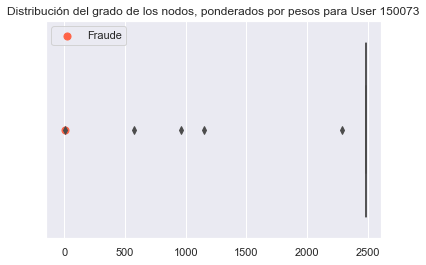



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


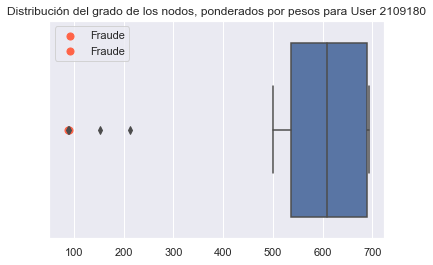



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


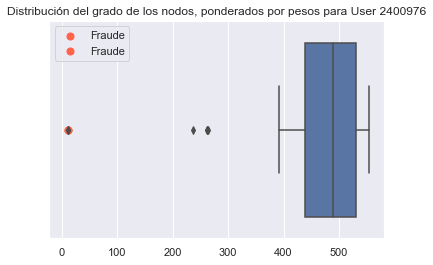



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 30
 - TFP: 17.47% | Accuracy: 82.63% | Recall: 100.0%  | Precision: 3.33% | F1: 6.45%


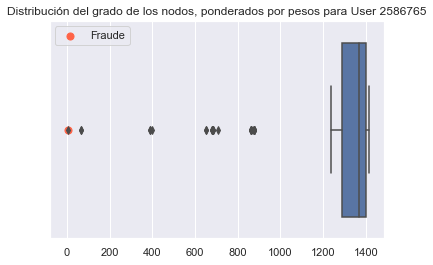



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.82% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


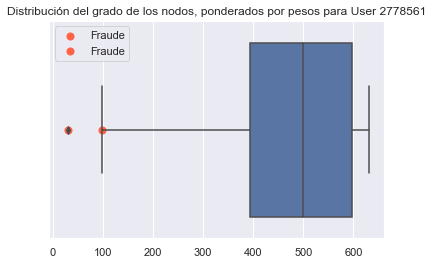



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 3.9% | Accuracy: 96.2% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


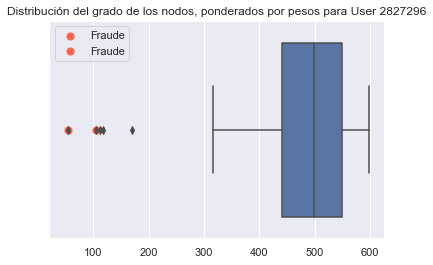



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


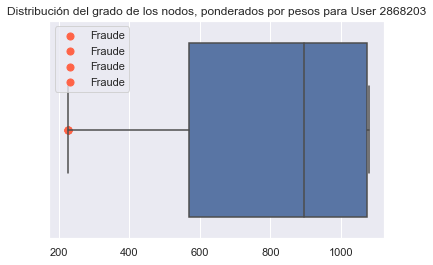



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


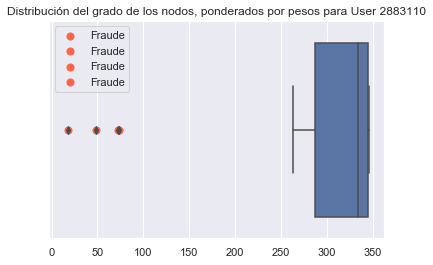



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 14.84% | Accuracy: 85.44% | Recall: 100.0%  | Precision: 11.54% | F1: 20.69%


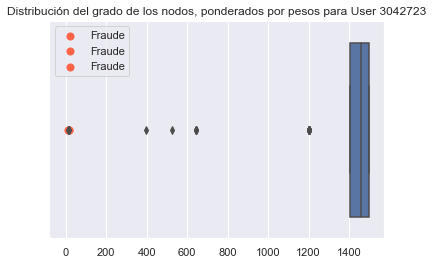



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.57% | Accuracy: 96.45% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


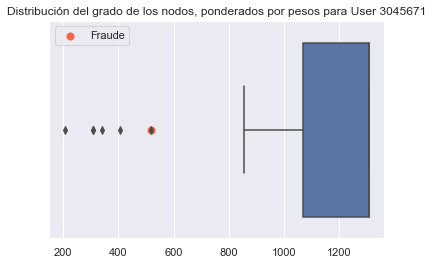



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


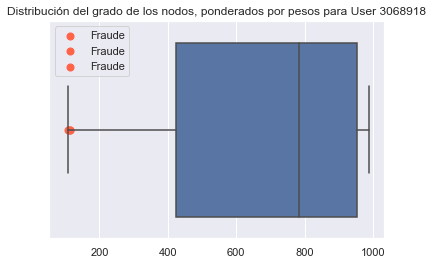



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


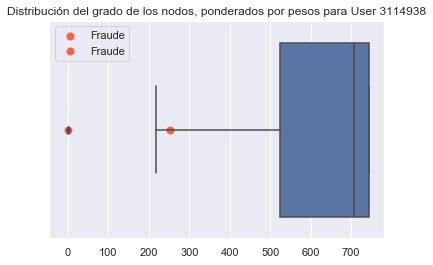



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.7% | Accuracy: 97.37% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


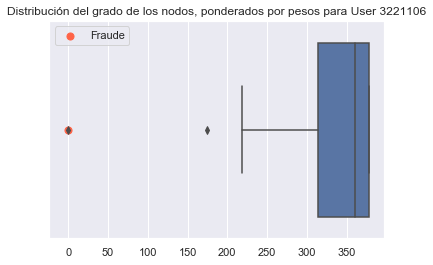



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


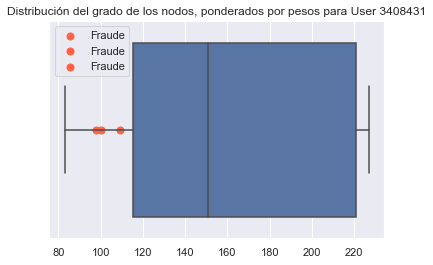



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 25
 - TFP: 15.22% | Accuracy: 85.21% | Recall: 100.0%  | Precision: 16.0% | F1: 27.59%


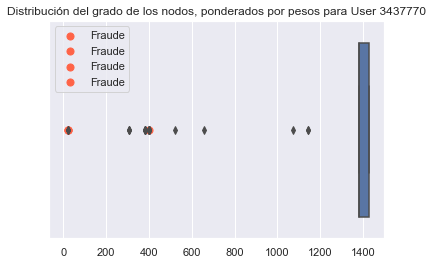



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 25
 - TFP: 15.97% | Accuracy: 84.25% | Recall: 100.0%  | Precision: 8.0% | F1: 14.81%


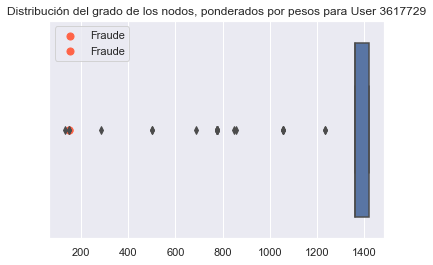



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.5% | Accuracy: 97.62% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


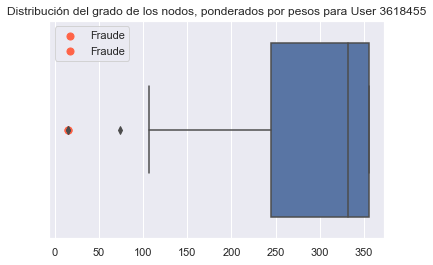



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 12.18% | Accuracy: 87.97% | Recall: 100.0%  | Precision: 9.52% | F1: 17.38%


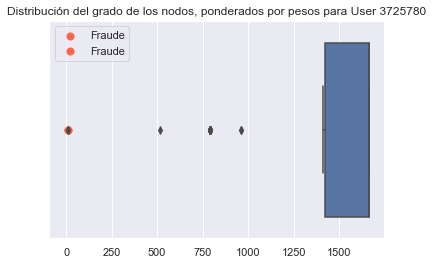



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 4.92% | Accuracy: 95.24% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


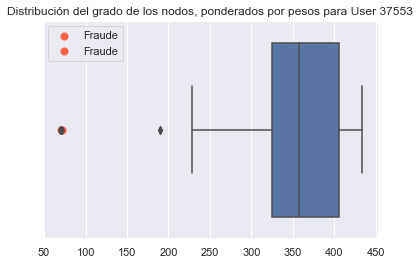



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


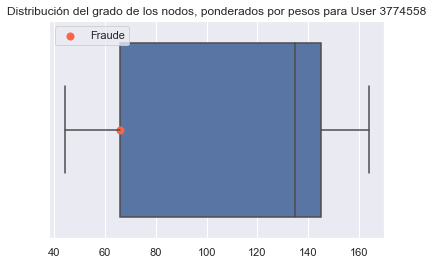



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.3% | Recall: 0.0%  | Precision: X% | F1: X%


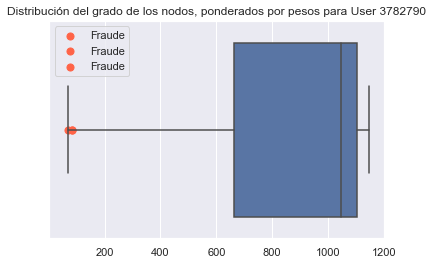



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 5.48% | Accuracy: 94.59% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


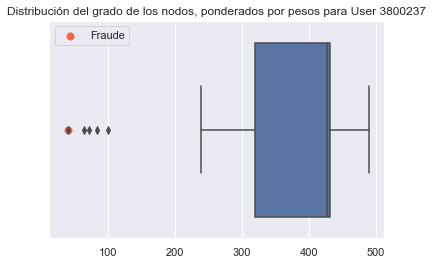



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.65% | Recall: 0.0%  | Precision: X% | F1: X%


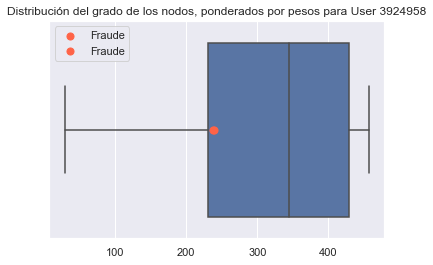



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


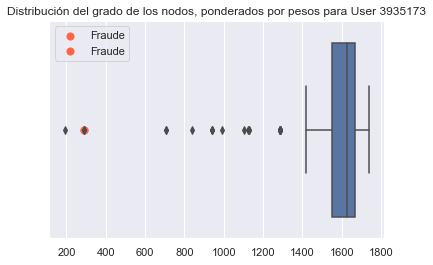



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


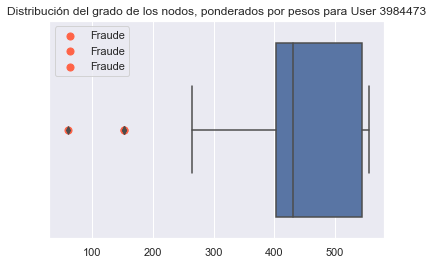



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


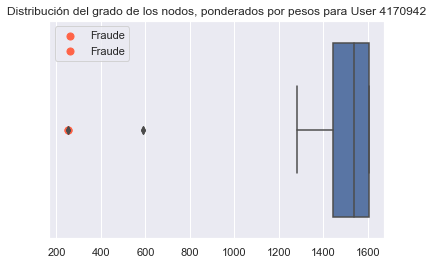



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


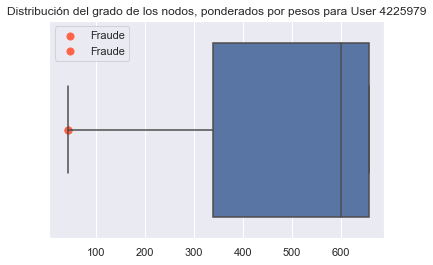



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 100.0% | Accuracy: 6.25% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


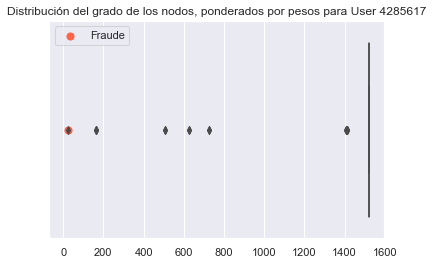



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 4.55% | Accuracy: 80.77% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


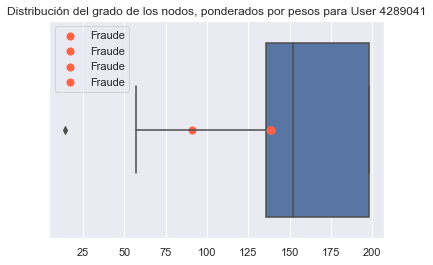



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 18
 - TFP: 4.44% | Accuracy: 95.58% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


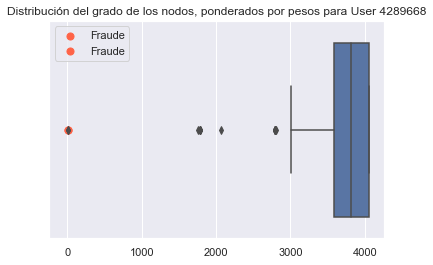



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 5.78% | Accuracy: 94.29% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


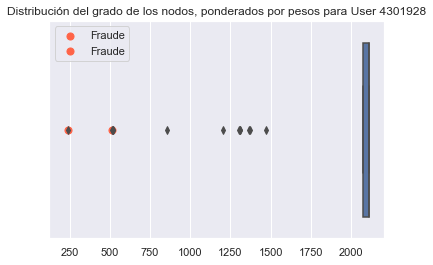



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 82.35% | Recall: 0.0%  | Precision: X% | F1: X%


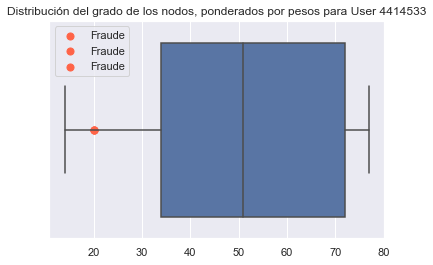



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 4.37% | Accuracy: 95.65% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


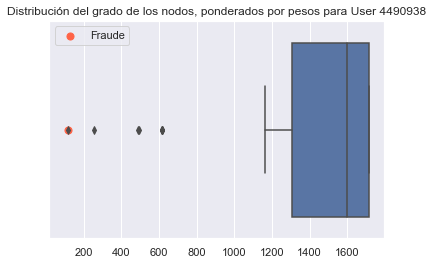



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


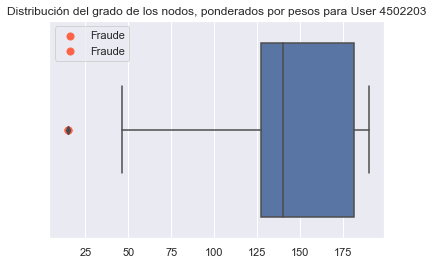



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 11.11% | Accuracy: 89.04% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


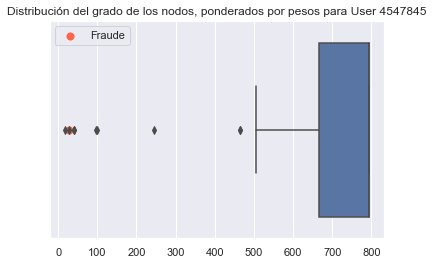



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


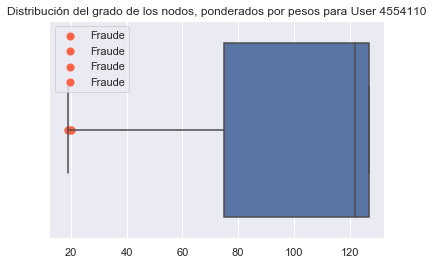



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


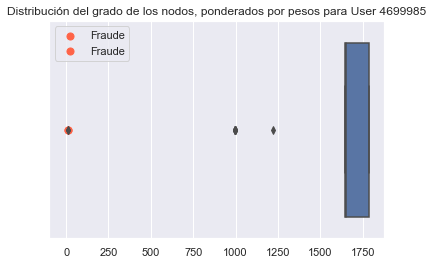



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.7% | Recall: 0.0%  | Precision: X% | F1: X%


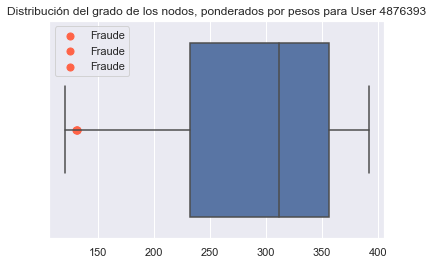



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 4.03% | Accuracy: 96.0% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


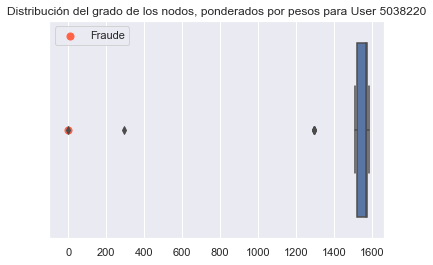



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 15.38% | Accuracy: 85.19% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


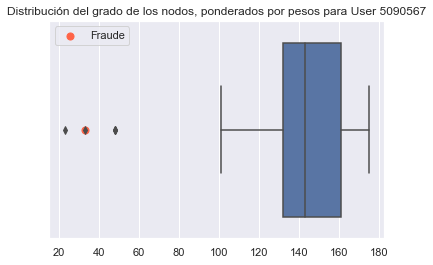



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 13.33% | Accuracy: 88.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


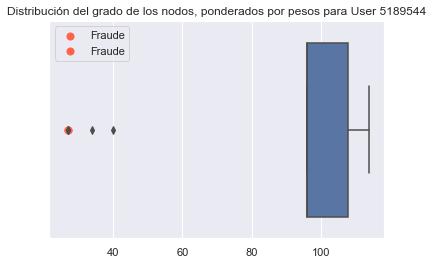



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 5.77% | Accuracy: 94.29% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


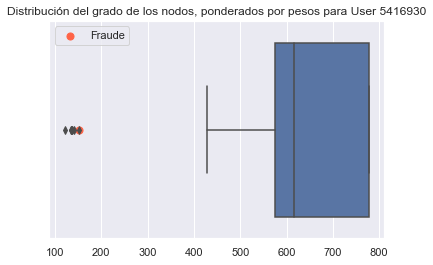



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 6.25% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


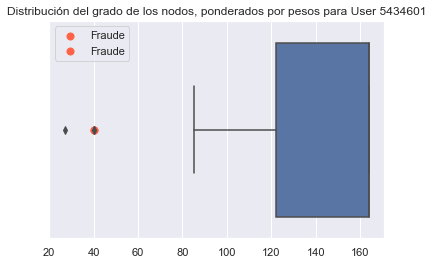



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.22% | Accuracy: 85.0% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


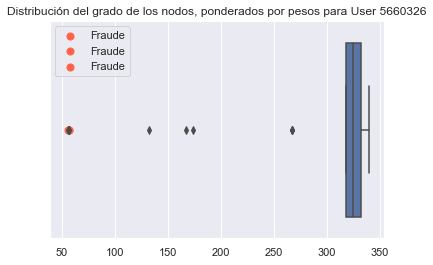



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 6.82% | Accuracy: 93.48% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


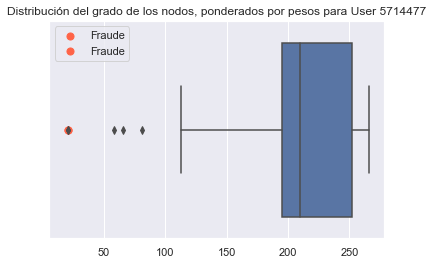



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.79% | Recall: 0.0%  | Precision: X% | F1: X%


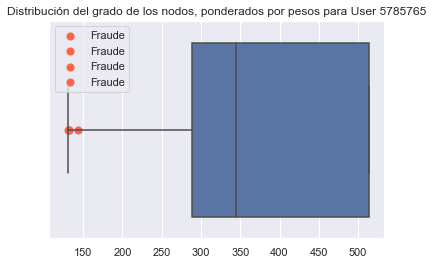



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 7.79% | Accuracy: 92.41% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


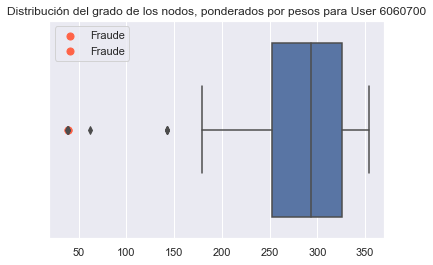



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.27% | Recall: 0.0%  | Precision: X% | F1: X%


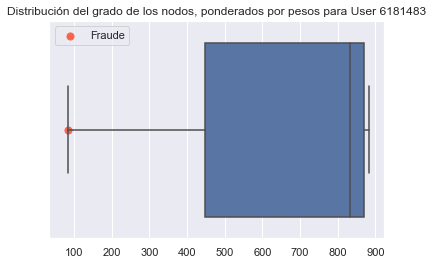



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


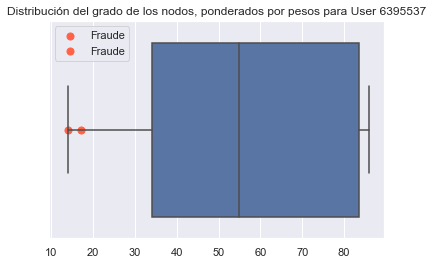



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


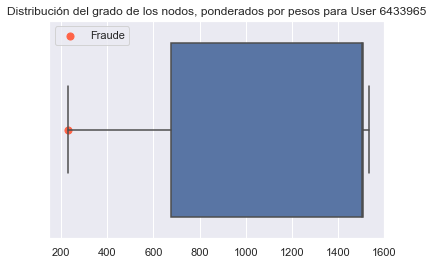



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


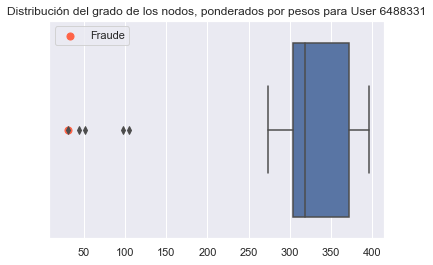



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


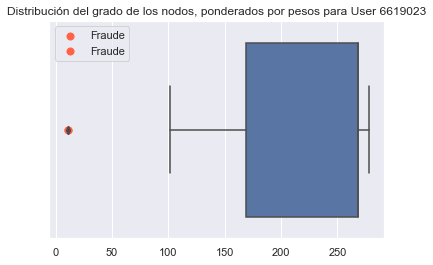



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.28% | Accuracy: 84.44% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


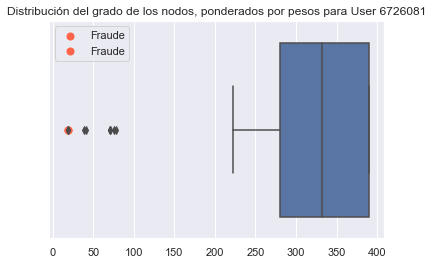



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


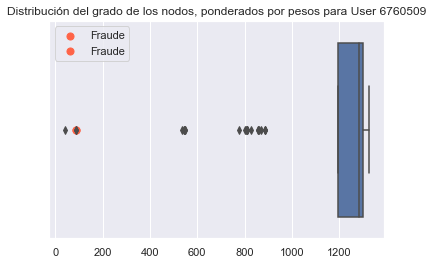



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


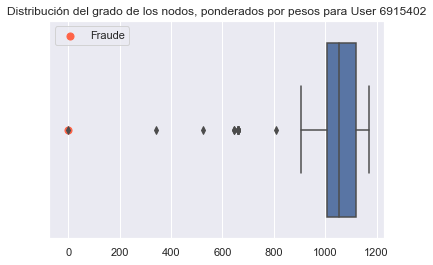



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


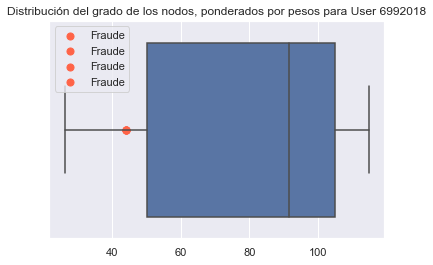



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


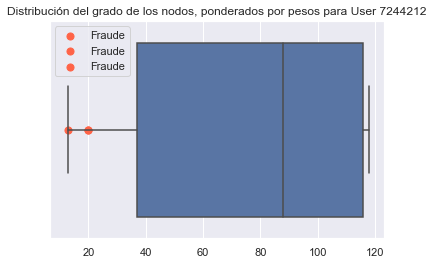



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


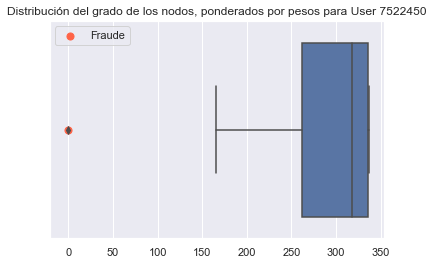



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 10.0% | Accuracy: 90.48% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


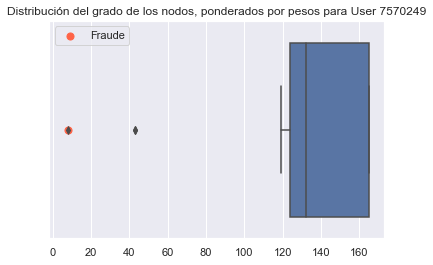



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 4.35% | Accuracy: 95.83% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


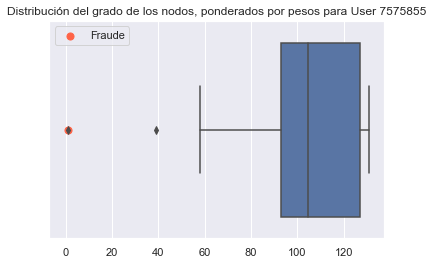



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 93.33% | Recall: 0.0%  | Precision: X% | F1: X%


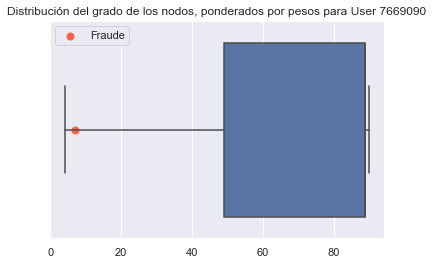



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 6.2% | Accuracy: 93.01% | Fraudes atrapados: 60.0% | Recall Avg: 68.85% | Precision Avg: 36.77%



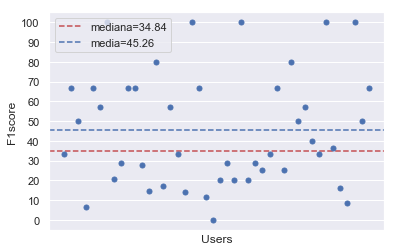

In [19]:
users = list(data['id_usuario'].unique())
mod_base = run_model(users,vars_for_grafo,data)

##### vars_for_grafo_1



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


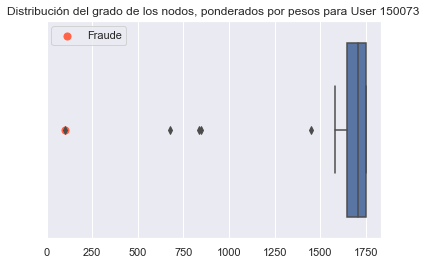



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


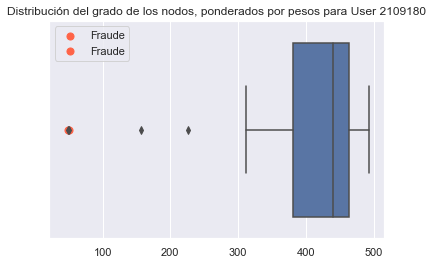



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


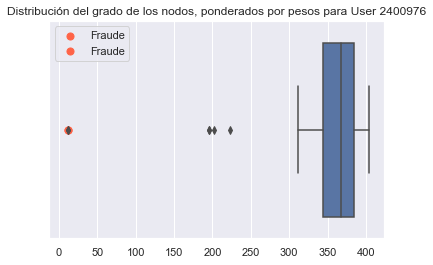



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 14
 - TFP: 7.83% | Accuracy: 92.22% | Recall: 100.0%  | Precision: 7.14% | F1: 13.33%


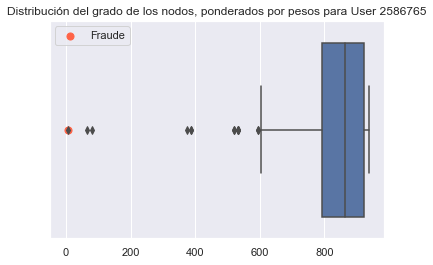



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


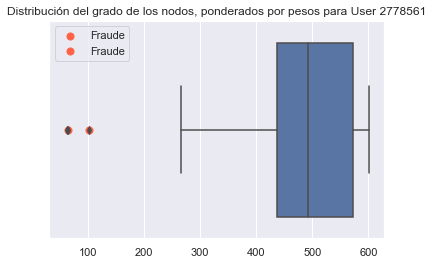



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 3.9% | Accuracy: 96.2% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


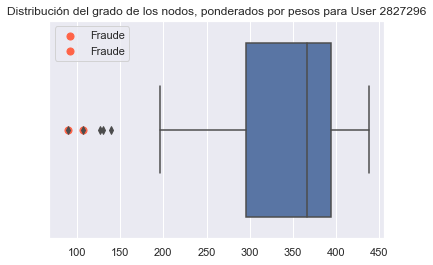



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


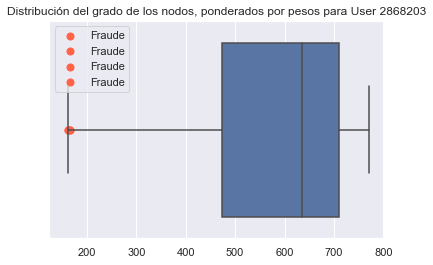



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


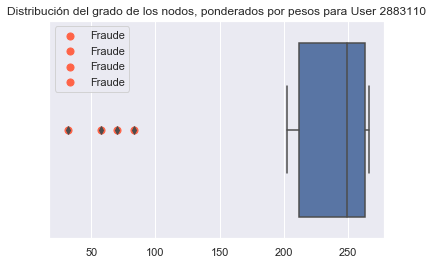



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.52% | Accuracy: 95.57% | Recall: 100.0%  | Precision: 30.0% | F1: 46.15%


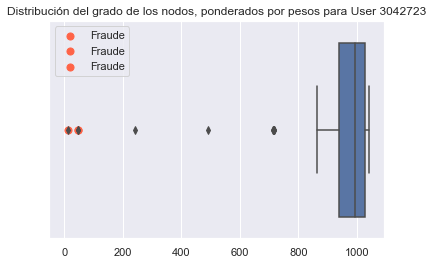



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 7.14% | Accuracy: 92.91% | Recall: 100.0%  | Precision: 9.09% | F1: 16.67%


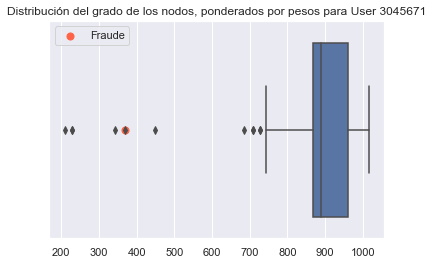



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


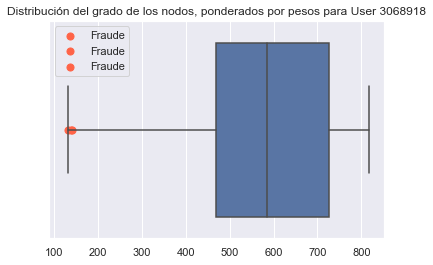



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


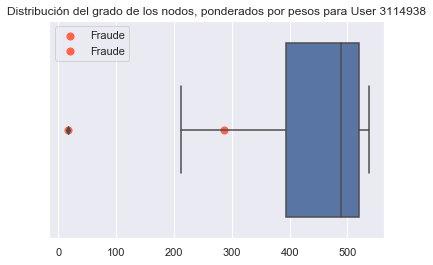



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


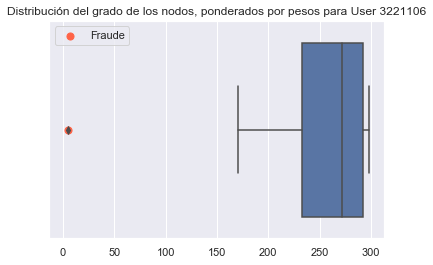



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


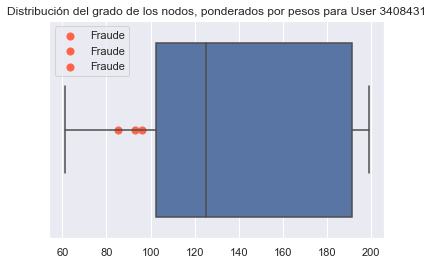



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 24
 - TFP: 14.49% | Accuracy: 85.92% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


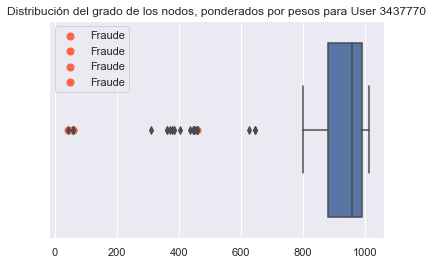



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.19% | Accuracy: 86.99% | Recall: 100.0%  | Precision: 9.52% | F1: 17.38%


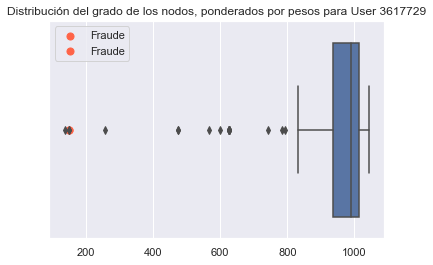



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.5% | Accuracy: 97.62% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


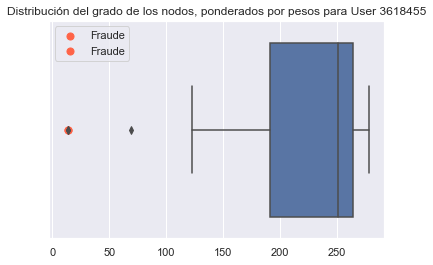



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 14
 - TFP: 7.69% | Accuracy: 92.41% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


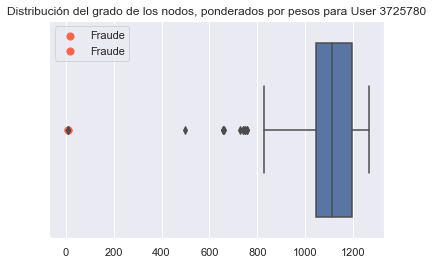



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


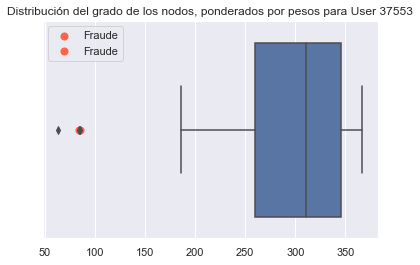



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


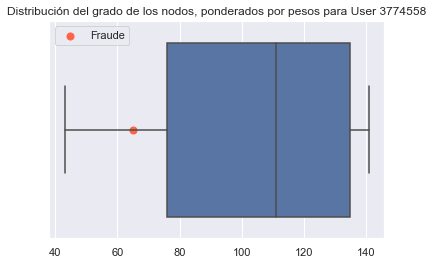



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


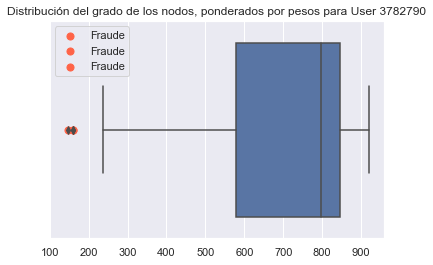



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.65% | Recall: 0.0%  | Precision: X% | F1: X%


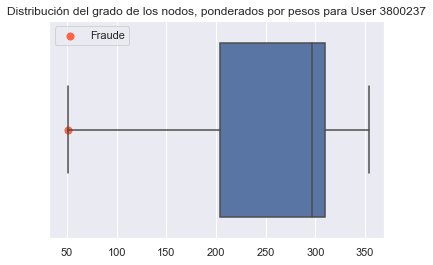



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.65% | Recall: 0.0%  | Precision: X% | F1: X%


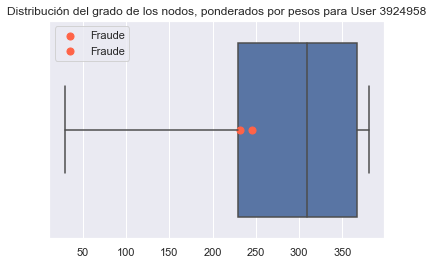



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


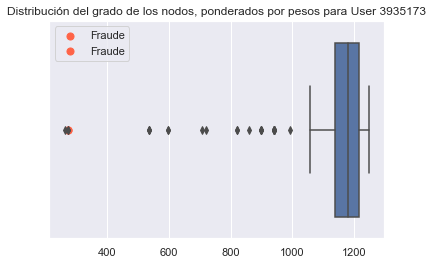



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.11% | Accuracy: 98.92% | Recall: 100.0%  | Precision: 75.0% | F1: 85.71%


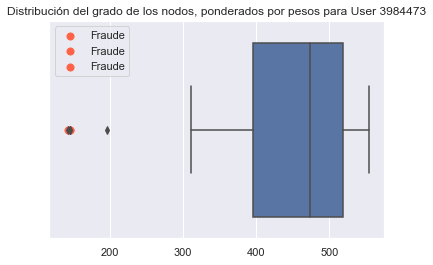



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


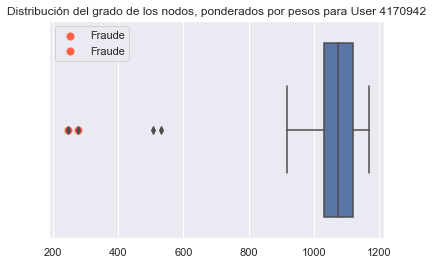



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


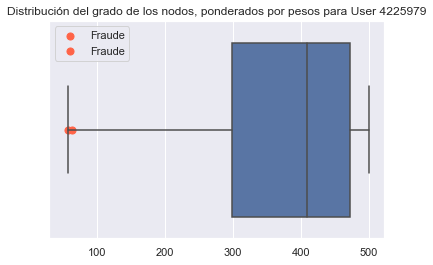



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


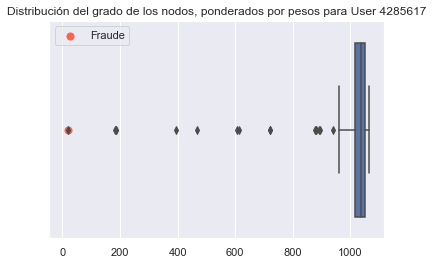



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 4.55% | Accuracy: 80.77% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


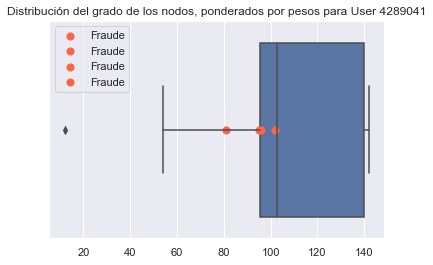



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 1.94% | Accuracy: 98.07% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


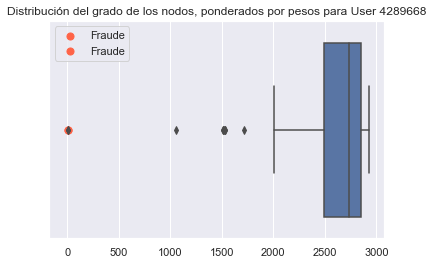



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 15
 - TFP: 7.51% | Accuracy: 92.57% | Recall: 100.0%  | Precision: 13.33% | F1: 23.52%


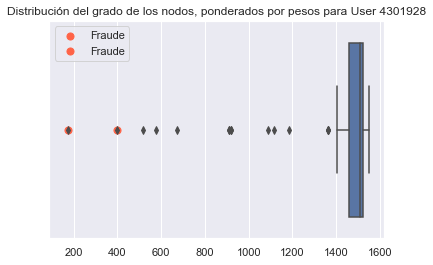



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.25% | Recall: 0.0%  | Precision: X% | F1: X%


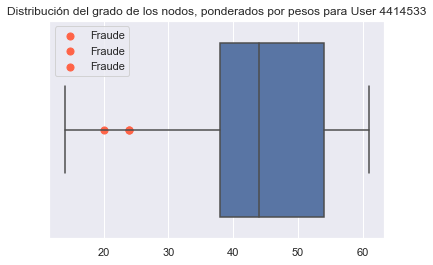



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.92% | Accuracy: 95.11% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


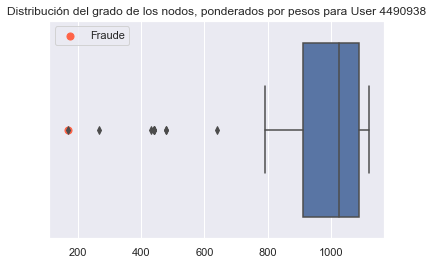



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


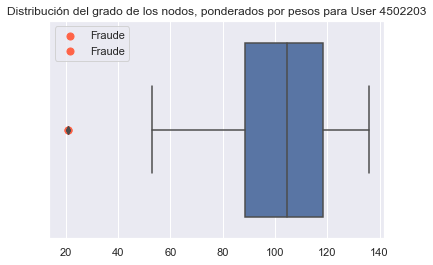



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 15.28% | Accuracy: 84.93% | Recall: 100.0%  | Precision: 8.33% | F1: 15.38%


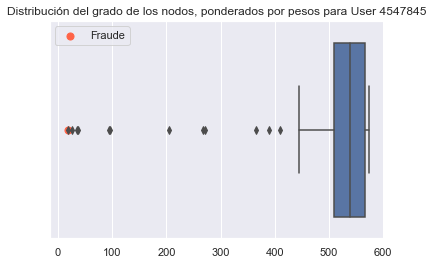



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


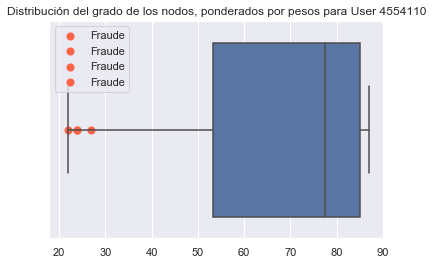



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 13
 - TFP: 6.79% | Accuracy: 93.29% | Recall: 100.0%  | Precision: 15.38% | F1: 26.66%


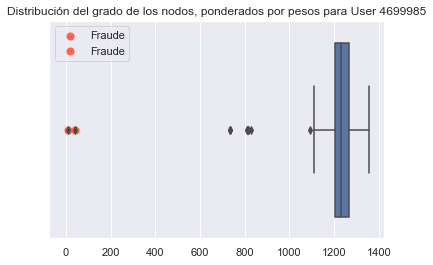



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


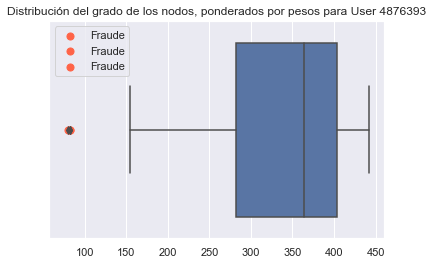



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.01% | Accuracy: 98.0% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


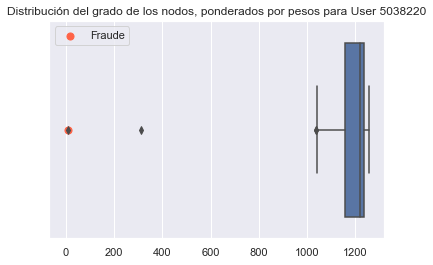



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 8.33% | Accuracy: 92.0% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


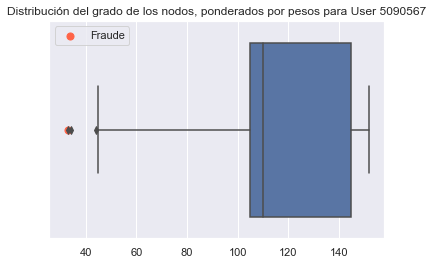



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 13.33% | Accuracy: 88.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


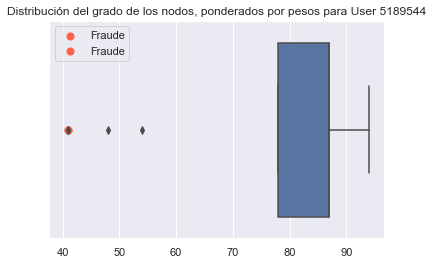



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 5.77% | Accuracy: 94.29% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


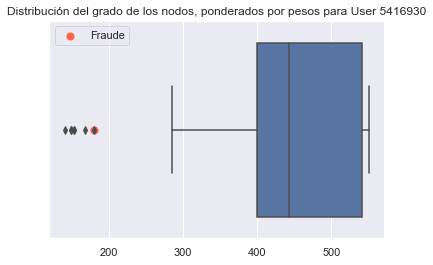



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 6.25% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


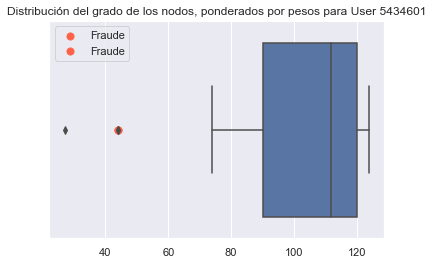



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 13.51% | Accuracy: 87.5% | Recall: 100.0%  | Precision: 37.5% | F1: 54.55%


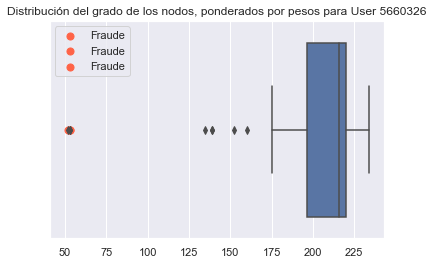



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 6.82% | Accuracy: 93.48% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


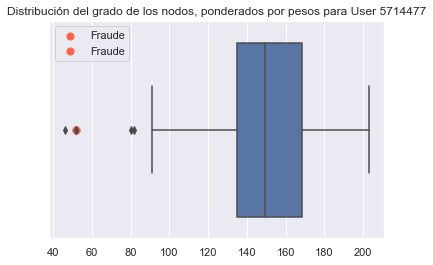



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


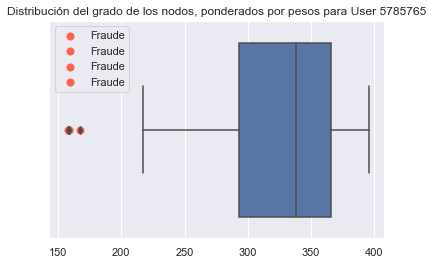



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.47% | Recall: 0.0%  | Precision: X% | F1: X%


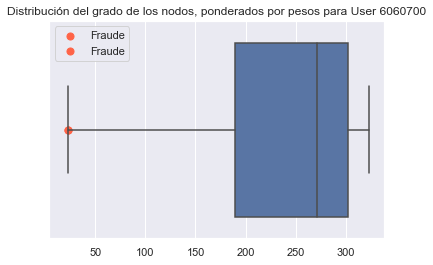



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 14.71% | Accuracy: 85.4% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


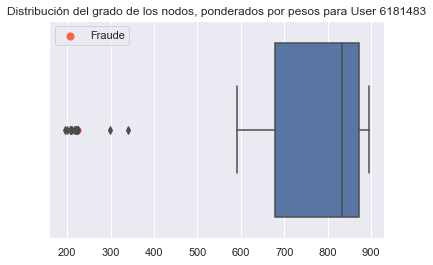



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


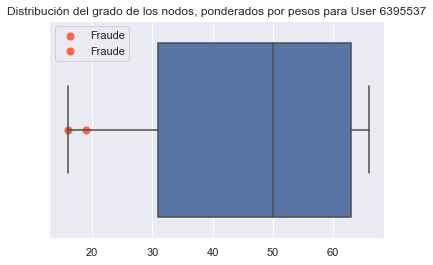



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


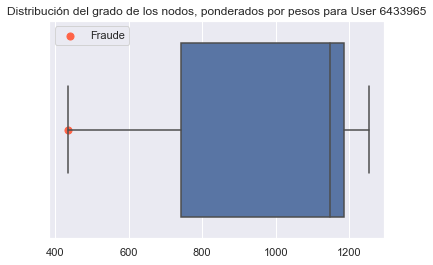



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 6.52% | Accuracy: 93.62% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


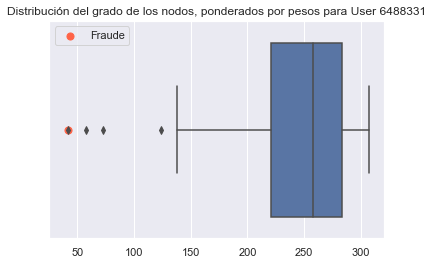



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


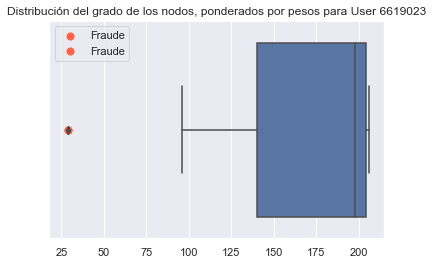



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


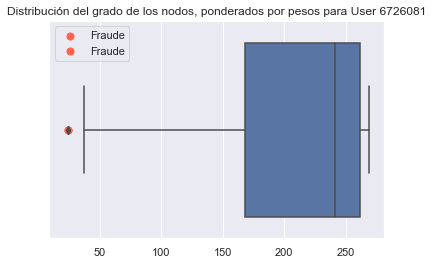



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


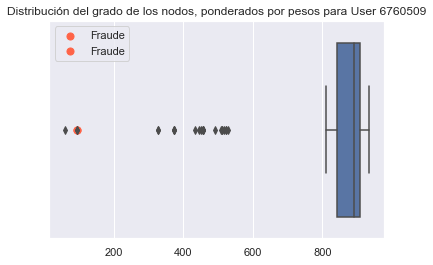



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


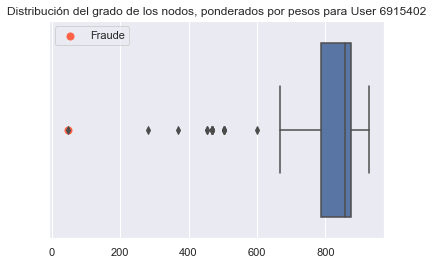



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


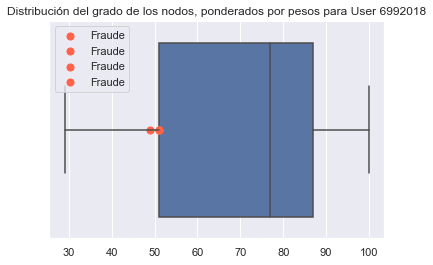



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


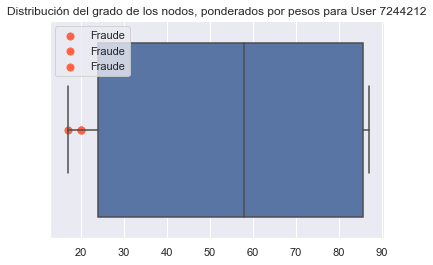



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


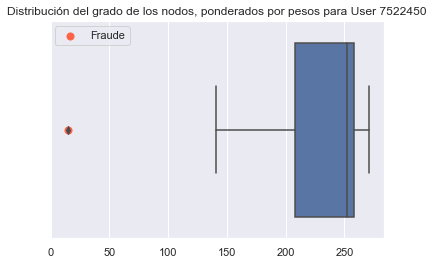



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


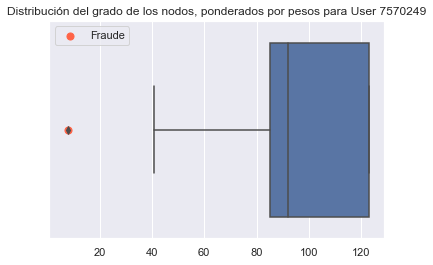



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


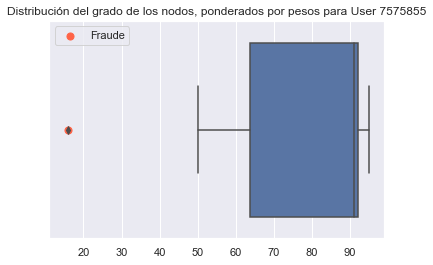



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


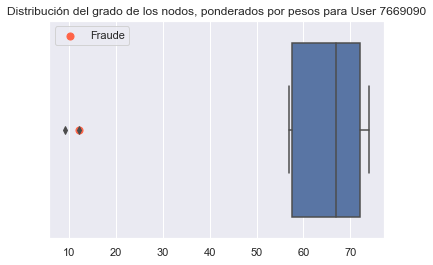



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 5.02% | Accuracy: 94.39% | Fraudes atrapados: 68.0% | Recall Avg: 74.59% | Precision Avg: 46.77%



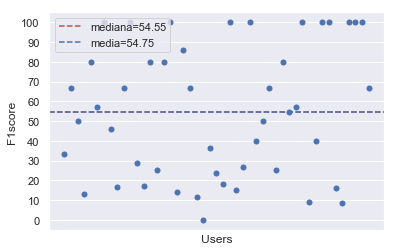

In [20]:
mod_base_1 = run_model(users,vars_for_grafo_1,data)

##### vars_for_grapho_2



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 10.31% | Accuracy: 89.74% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


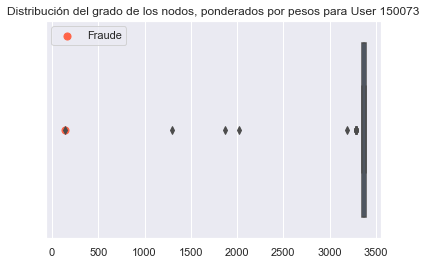



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


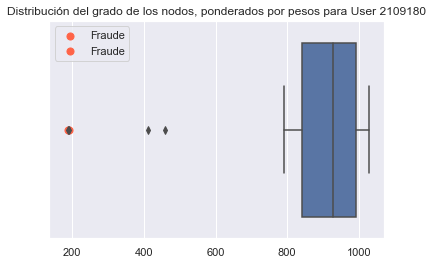



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 13.79% | Accuracy: 86.67% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


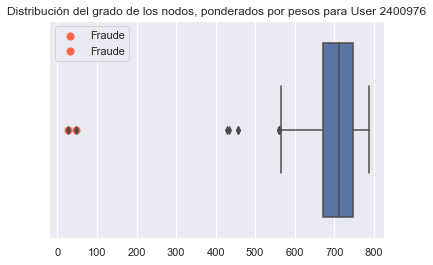



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 36
 - TFP: 21.08% | Accuracy: 79.04% | Recall: 100.0%  | Precision: 2.78% | F1: 5.41%


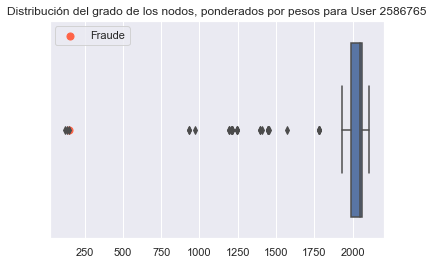



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


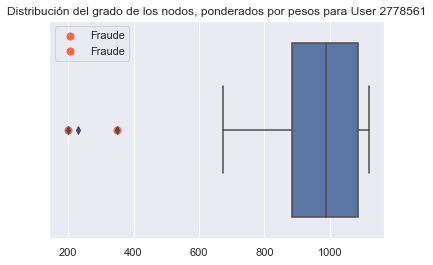



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.73% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


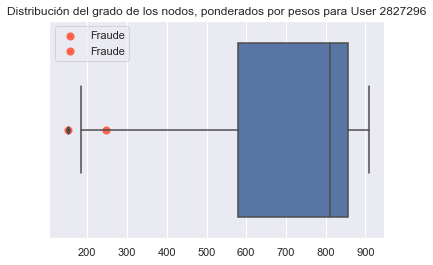



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


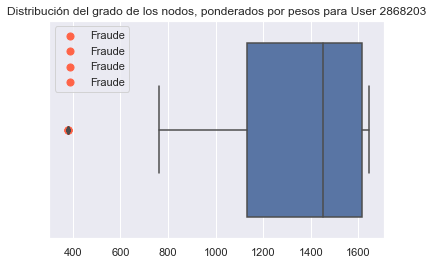



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


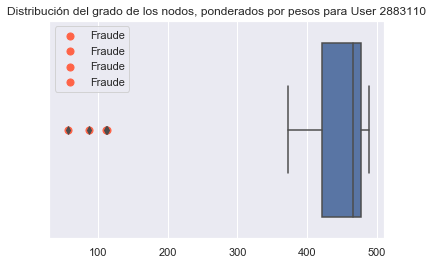



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.52% | Accuracy: 95.57% | Recall: 100.0%  | Precision: 30.0% | F1: 46.15%


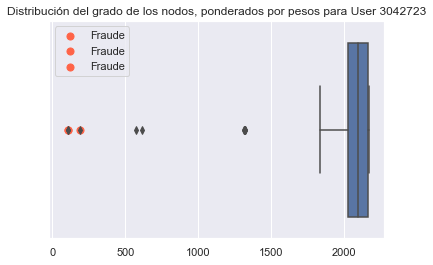



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.57% | Accuracy: 96.45% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


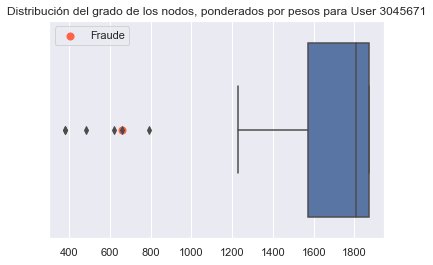



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


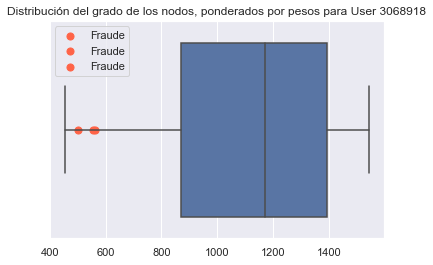



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.47% | Accuracy: 97.59% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


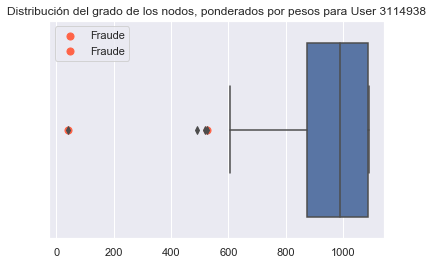



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 10.0% | Accuracy: 90.24% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


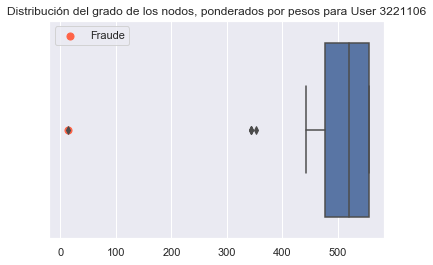



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


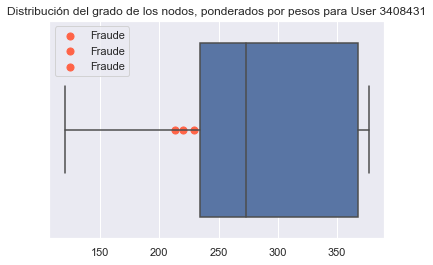



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 25
 - TFP: 15.22% | Accuracy: 85.21% | Recall: 100.0%  | Precision: 16.0% | F1: 27.59%


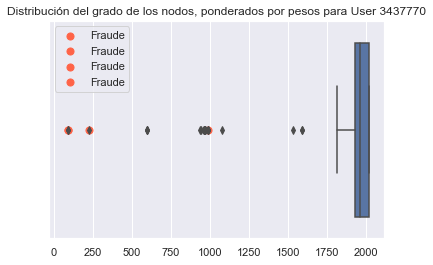



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 25
 - TFP: 15.97% | Accuracy: 84.25% | Recall: 100.0%  | Precision: 8.0% | F1: 14.81%


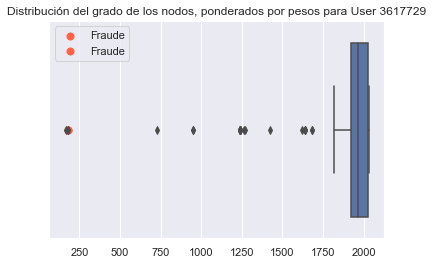



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


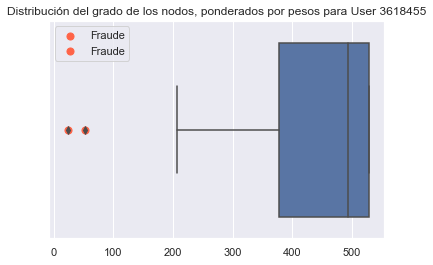



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 19
 - TFP: 10.9% | Accuracy: 89.24% | Recall: 100.0%  | Precision: 10.53% | F1: 19.05%


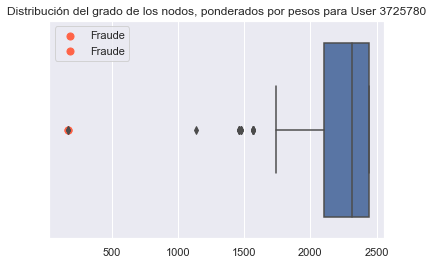



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 4.92% | Accuracy: 95.24% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


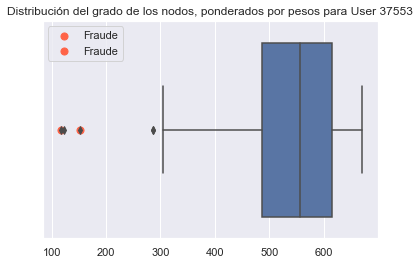



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


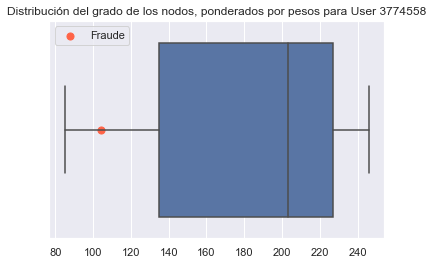



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.3% | Recall: 0.0%  | Precision: X% | F1: X%


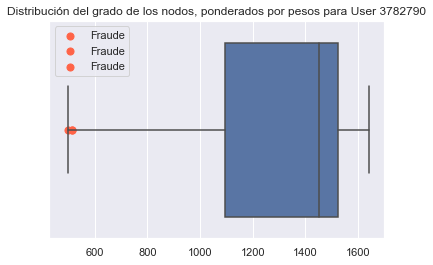



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.65% | Recall: 0.0%  | Precision: X% | F1: X%


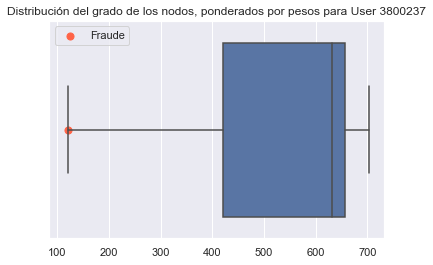



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.41% | Accuracy: 95.29% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


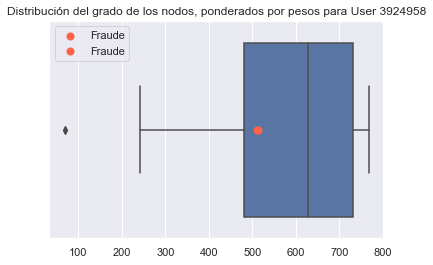



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 28
 - TFP: 13.83% | Accuracy: 86.32% | Recall: 100.0%  | Precision: 7.14% | F1: 13.33%


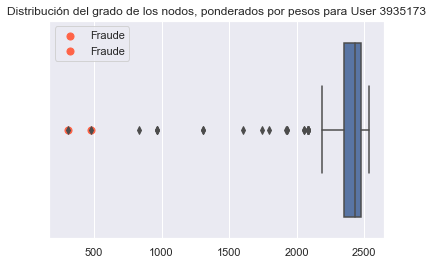



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 97.85% | Recall: 33.33%  | Precision: 100.0% | F1: 50.0%


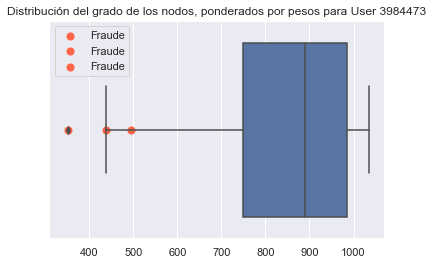



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


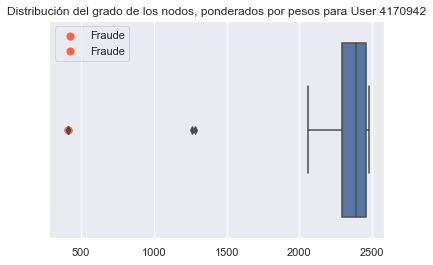



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


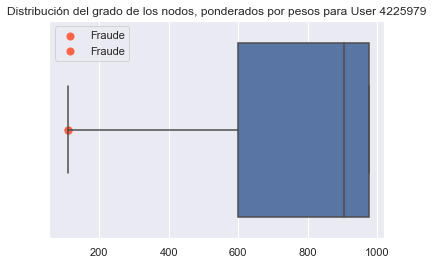



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


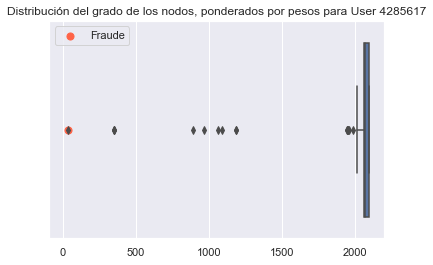



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 84.62% | Recall: 0.0%  | Precision: X% | F1: X%


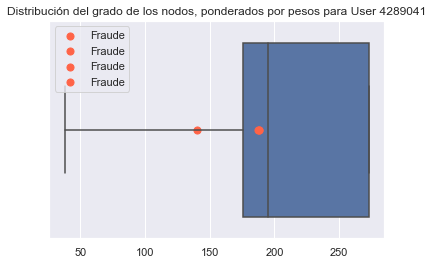



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 15
 - TFP: 3.61% | Accuracy: 96.41% | Recall: 100.0%  | Precision: 13.33% | F1: 23.52%


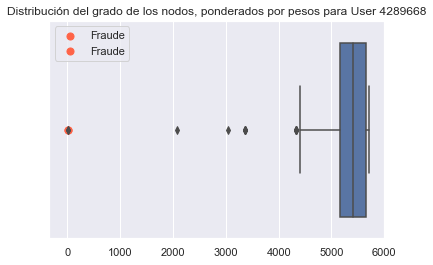



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 24
 - TFP: 12.72% | Accuracy: 87.43% | Recall: 100.0%  | Precision: 8.33% | F1: 15.38%


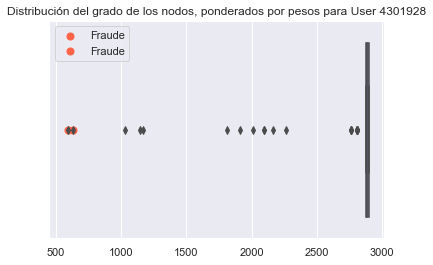



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 82.35% | Recall: 0.0%  | Precision: X% | F1: X%


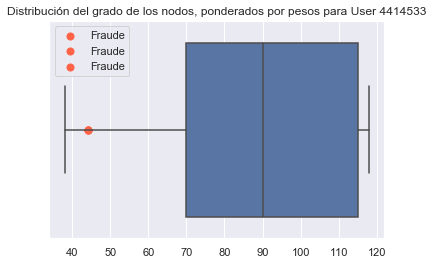



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.09% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


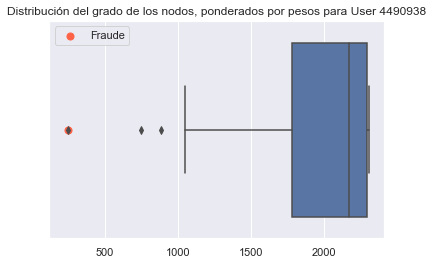



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 7.69% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


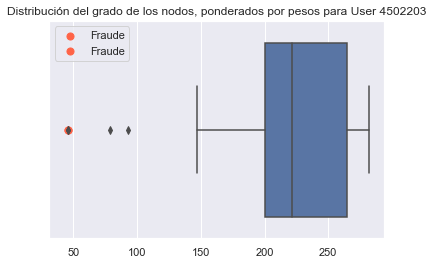



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 11.11% | Accuracy: 89.04% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


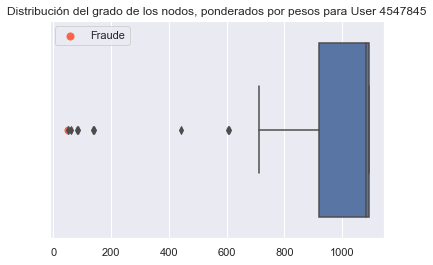



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


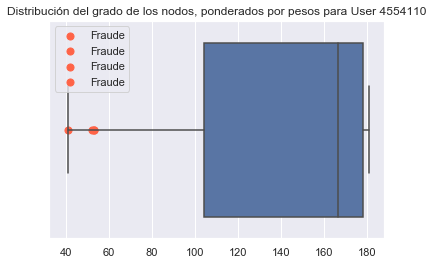



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


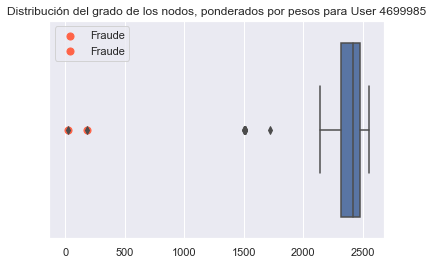



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


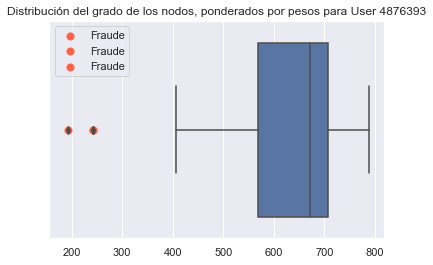



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 6.71% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 9.09% | F1: 16.67%


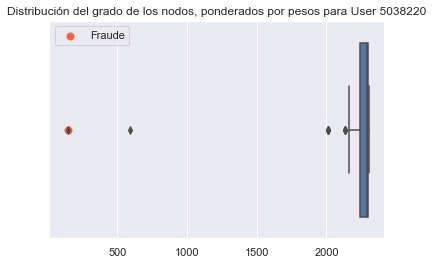



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 15.38% | Accuracy: 85.19% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


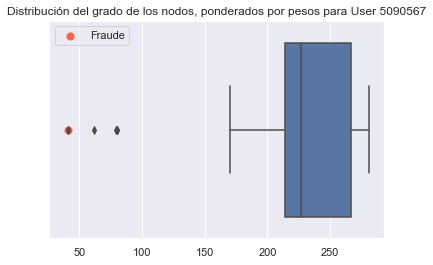



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 13.33% | Accuracy: 88.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


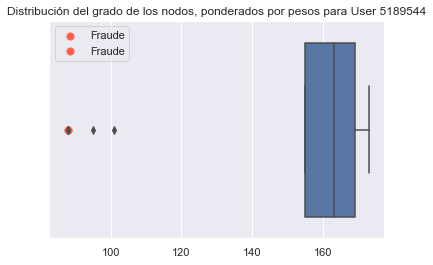



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 1.92% | Accuracy: 97.14% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


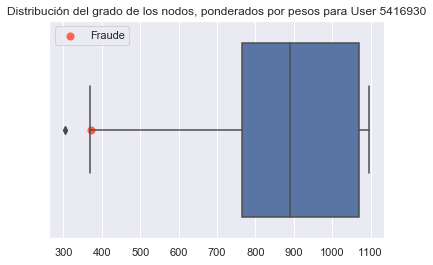



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 6.25% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


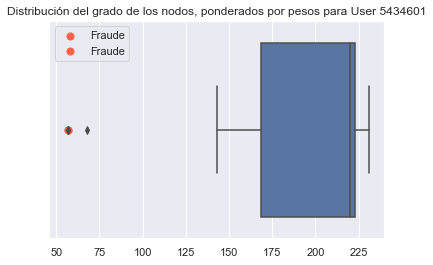



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 8.11% | Accuracy: 92.5% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


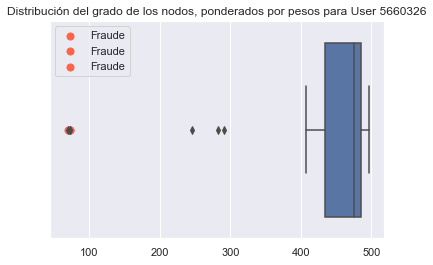



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 6.82% | Accuracy: 93.48% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


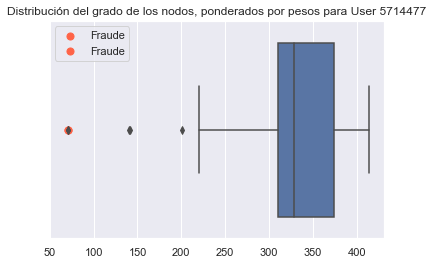



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.79% | Recall: 0.0%  | Precision: X% | F1: X%


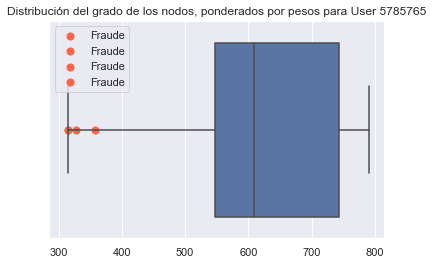



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.47% | Recall: 0.0%  | Precision: X% | F1: X%


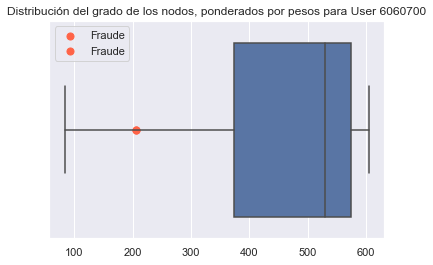



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 18
 - TFP: 12.5% | Accuracy: 87.59% | Recall: 100.0%  | Precision: 5.56% | F1: 10.53%


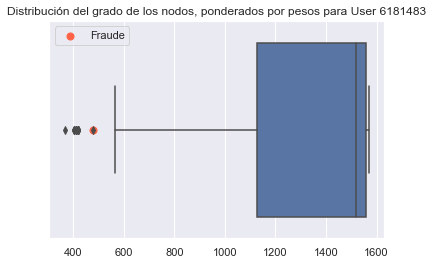



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


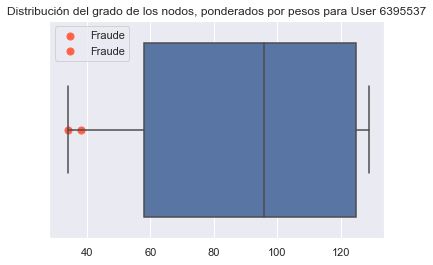



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


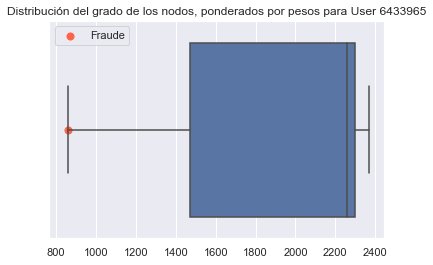



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


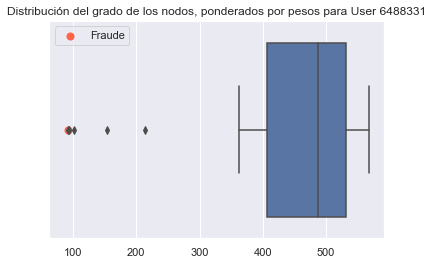



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 97.87% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


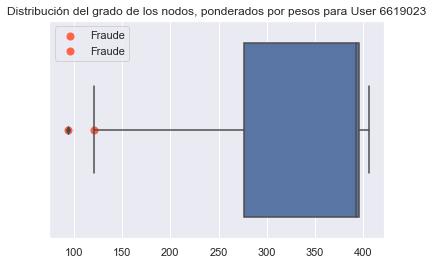



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.28% | Accuracy: 84.44% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


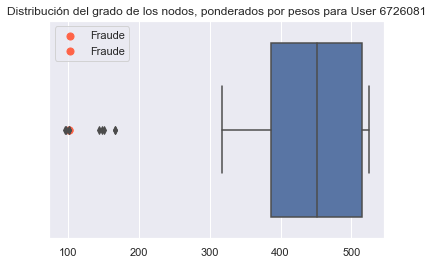



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


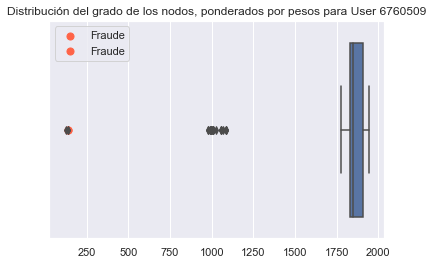



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


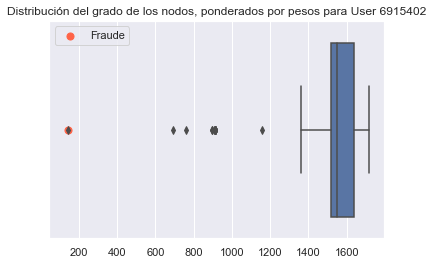



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


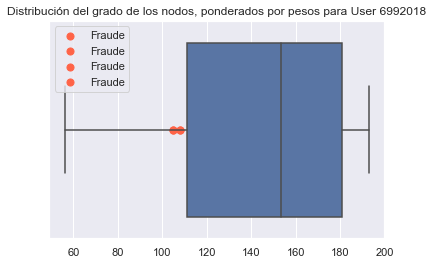



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


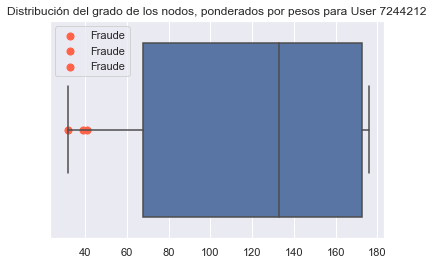



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


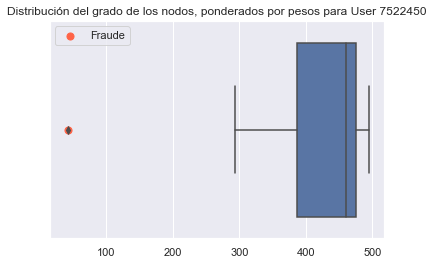



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 10.0% | Accuracy: 90.48% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


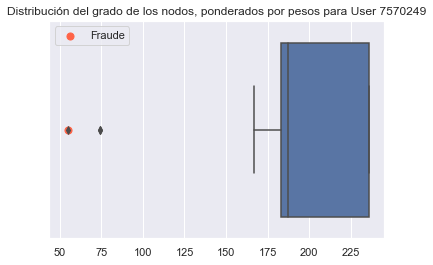



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


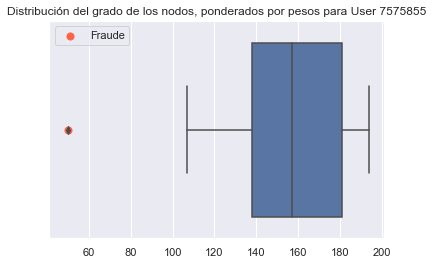



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


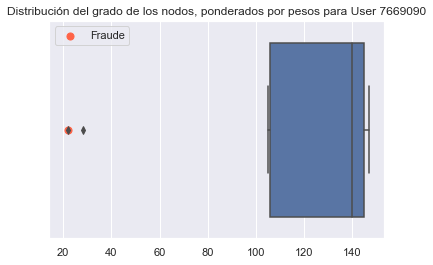



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 6.26% | Accuracy: 93.05% | Fraudes atrapados: 62.4% | Recall Avg: 69.4% | Precision Avg: 39.38%



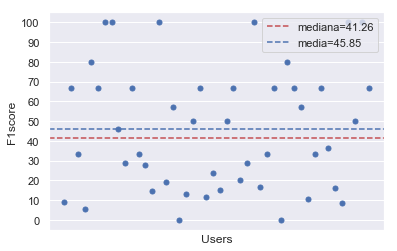

In [21]:
mod_base_2 = run_model(users,vars_for_grafo_2,data)

##### vars_for_grafo_3



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


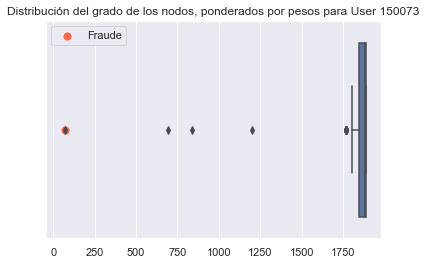



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


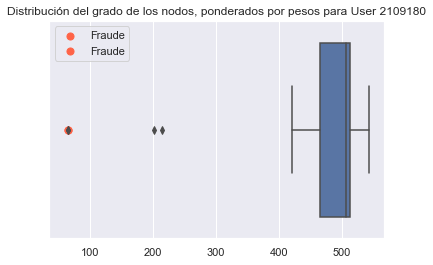



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 17.24% | Accuracy: 83.33% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


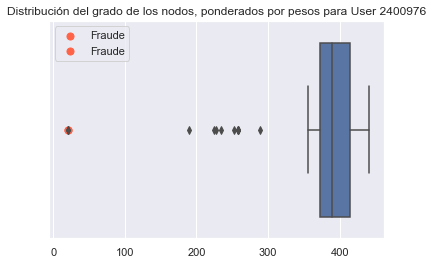



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 30
 - TFP: 17.47% | Accuracy: 82.63% | Recall: 100.0%  | Precision: 3.33% | F1: 6.45%


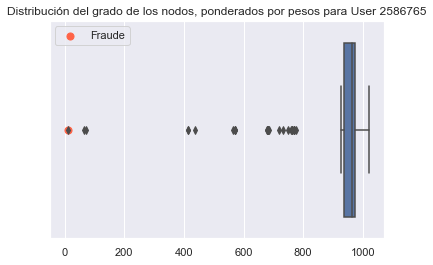



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


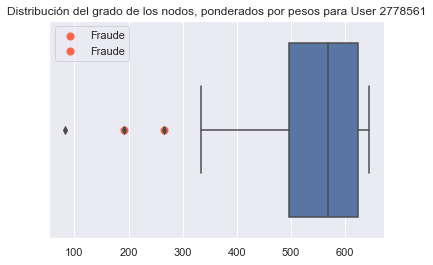



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.6% | Accuracy: 97.47% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


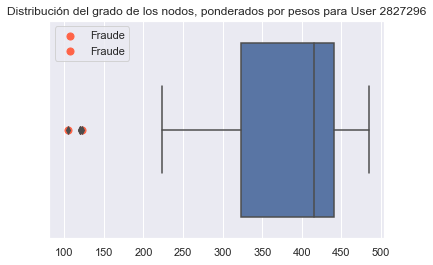



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


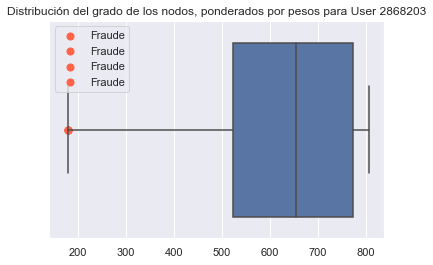



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


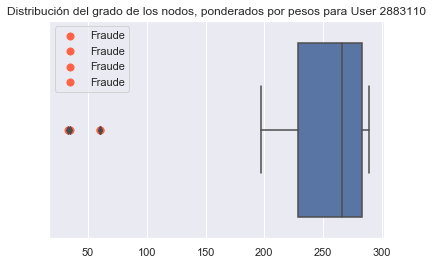



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 5.16% | Accuracy: 94.94% | Recall: 100.0%  | Precision: 27.27% | F1: 42.85%


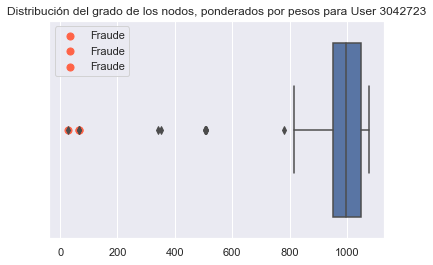



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.57% | Accuracy: 96.45% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


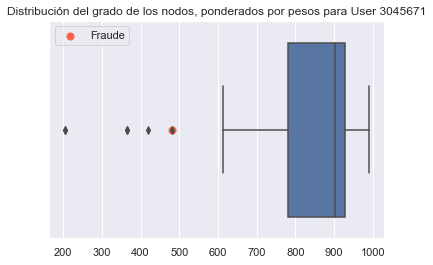



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


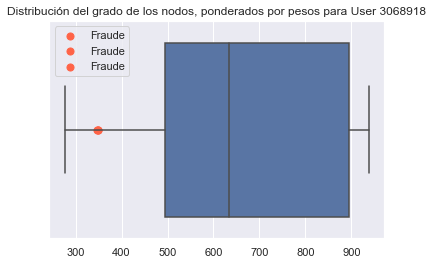



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


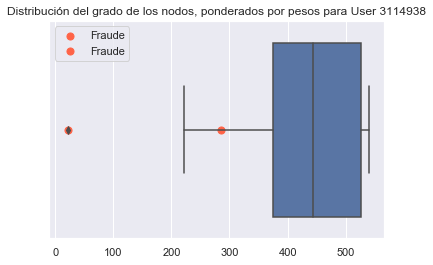



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 10.0% | Accuracy: 90.24% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


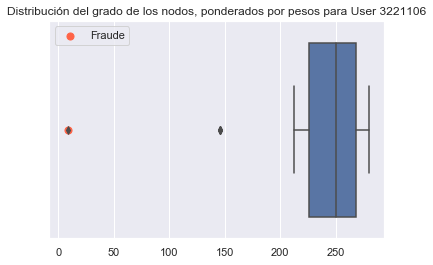



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


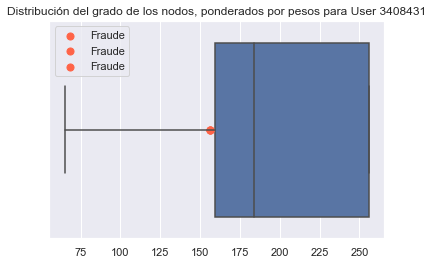



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 31
 - TFP: 19.57% | Accuracy: 80.99% | Recall: 100.0%  | Precision: 12.9% | F1: 22.85%


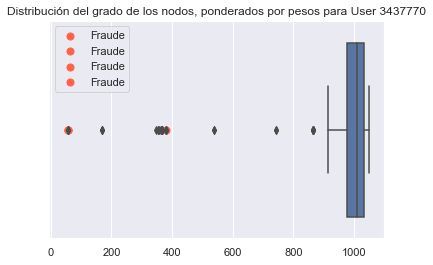



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 19
 - TFP: 11.81% | Accuracy: 88.36% | Recall: 100.0%  | Precision: 10.53% | F1: 19.05%


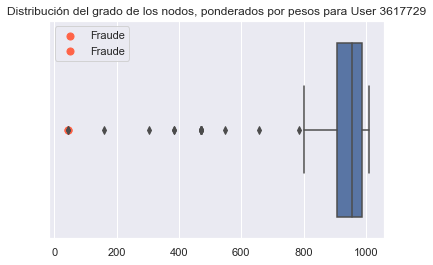



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 5.0% | Accuracy: 95.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


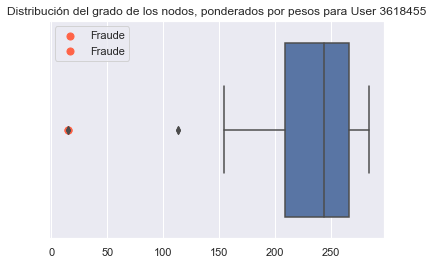



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 5.77% | Accuracy: 94.3% | Recall: 100.0%  | Precision: 18.18% | F1: 30.77%


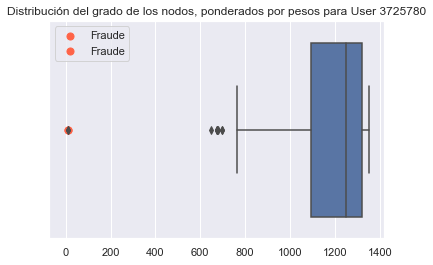



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


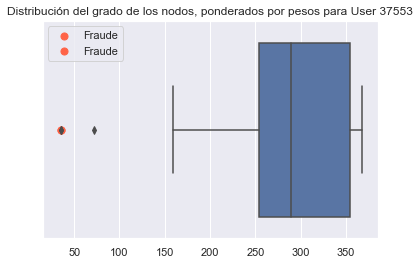



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


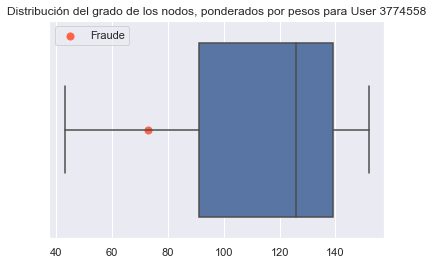



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.3% | Recall: 0.0%  | Precision: X% | F1: X%


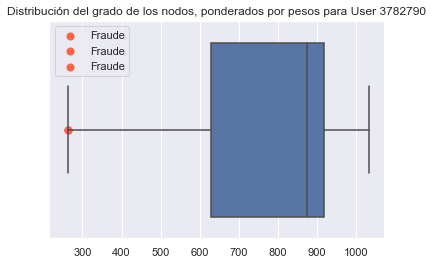



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 5.48% | Accuracy: 94.59% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


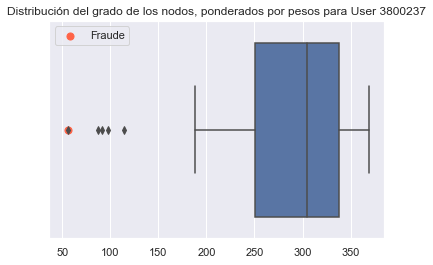



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.41% | Accuracy: 95.29% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


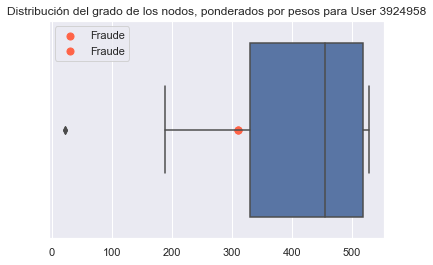



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


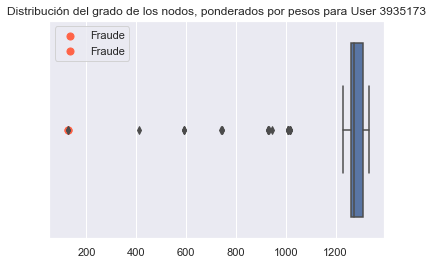



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 97.85% | Recall: 33.33%  | Precision: 100.0% | F1: 50.0%


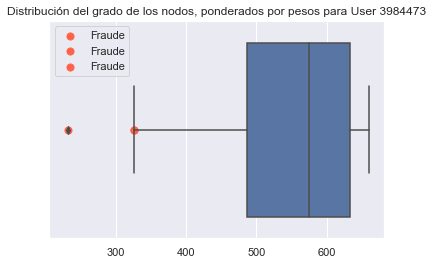



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


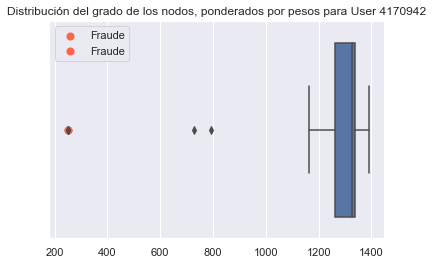



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


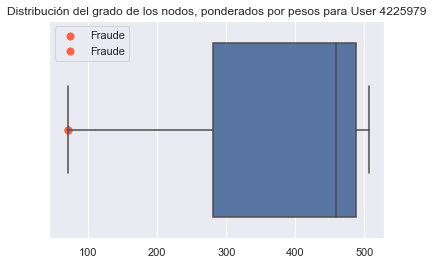



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 7.2% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


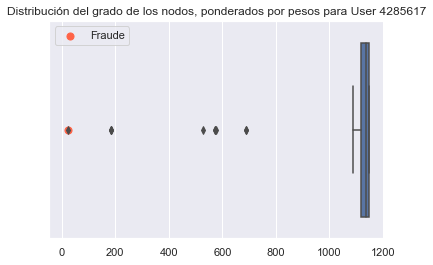



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 13.64% | Accuracy: 73.08% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


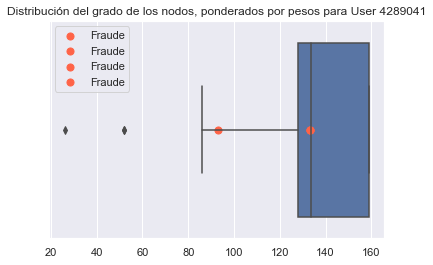



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 1.94% | Accuracy: 98.07% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


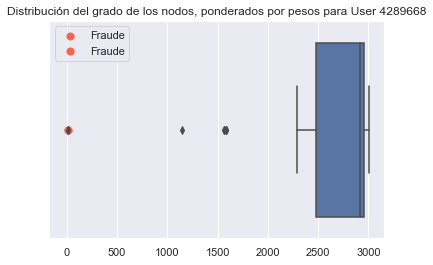



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 8.09% | Accuracy: 92.0% | Recall: 100.0%  | Precision: 12.5% | F1: 22.22%


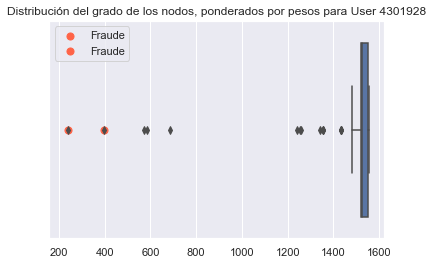



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 82.35% | Recall: 0.0%  | Precision: X% | F1: X%


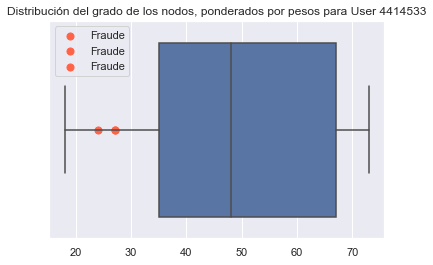



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.92% | Accuracy: 95.11% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


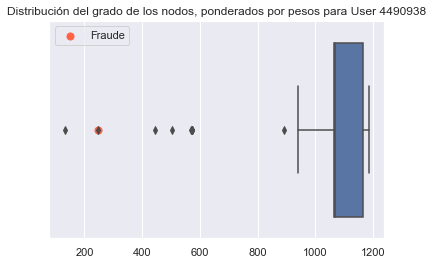



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 7.69% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


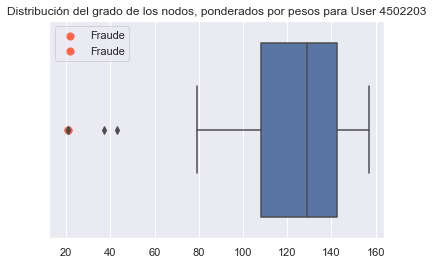



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 8.33% | Accuracy: 91.78% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


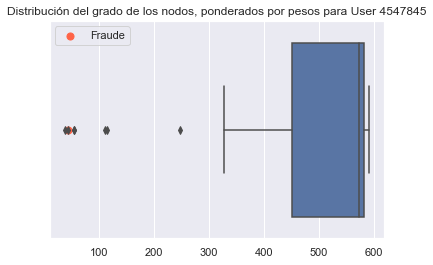



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


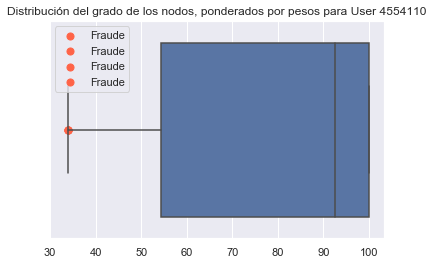



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


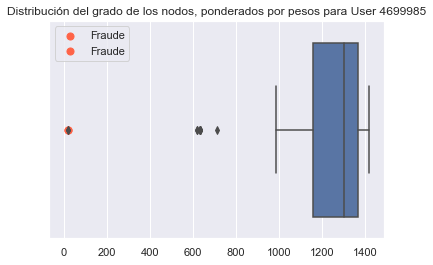



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


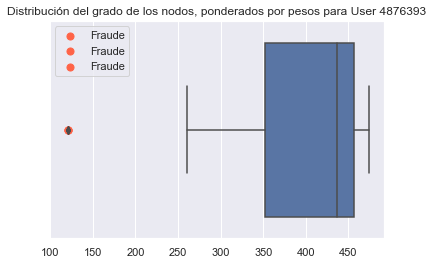



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.67% | Accuracy: 99.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


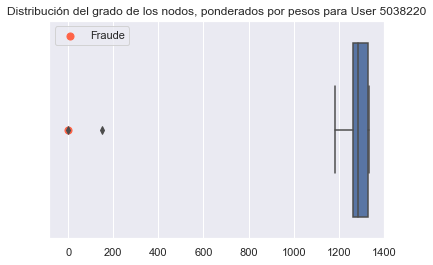



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 3.85% | Accuracy: 92.59% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


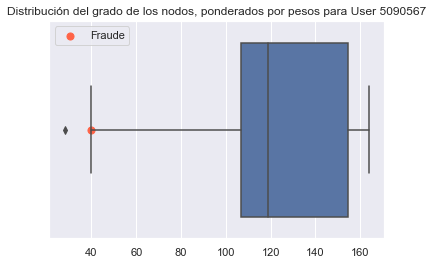



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 40.0% | Accuracy: 64.71% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


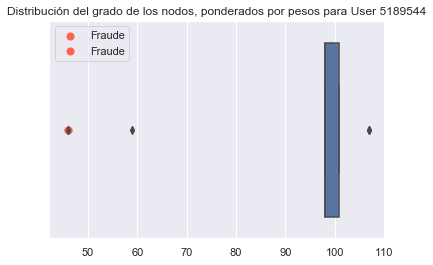



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.88% | Accuracy: 97.14% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


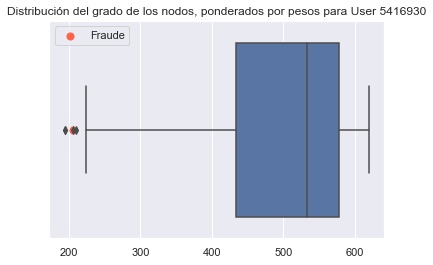



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 6.25% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


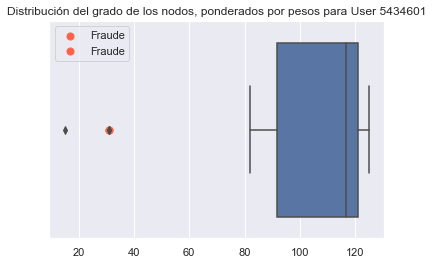



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.7% | Accuracy: 97.5% | Recall: 100.0%  | Precision: 75.0% | F1: 85.71%


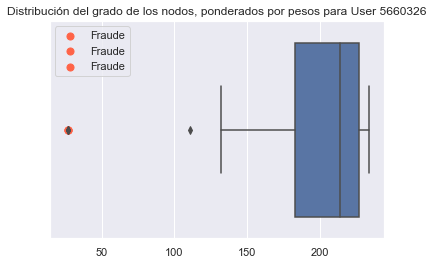



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 13.64% | Accuracy: 86.96% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


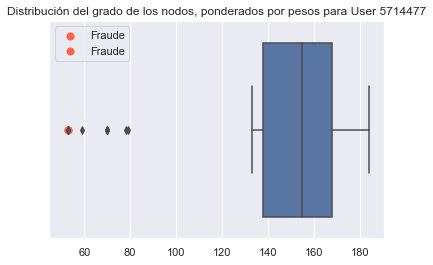



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 1.1% | Accuracy: 98.95% | Recall: 100.0%  | Precision: 80.0% | F1: 88.89%


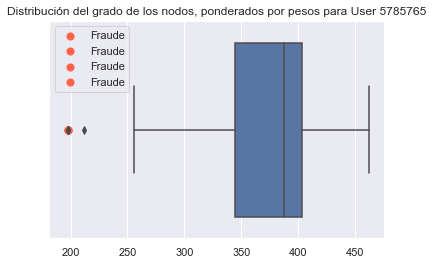



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.47% | Recall: 0.0%  | Precision: X% | F1: X%


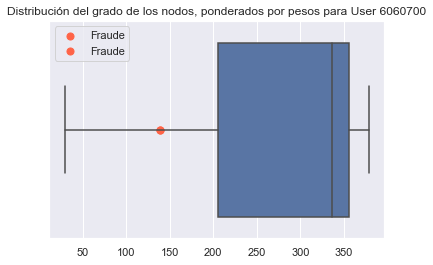



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 14.71% | Accuracy: 85.4% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


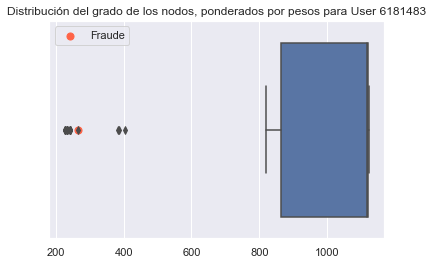



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


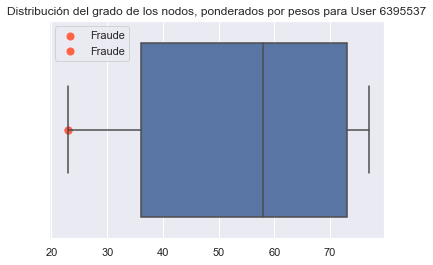



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


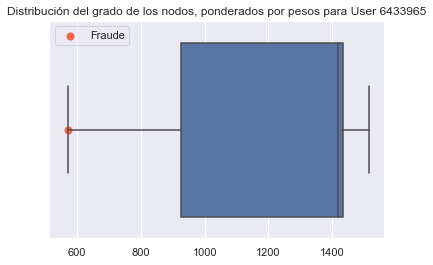



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


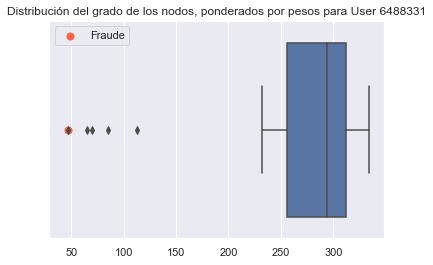



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.74% | Recall: 0.0%  | Precision: X% | F1: X%


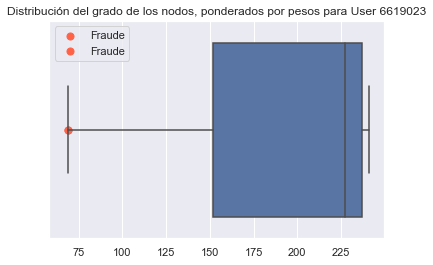



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.28% | Accuracy: 84.44% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


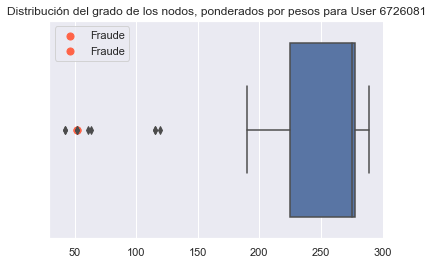



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


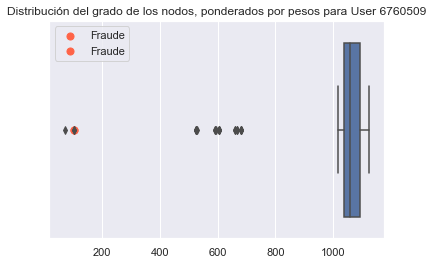



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.99% | Accuracy: 86.11% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


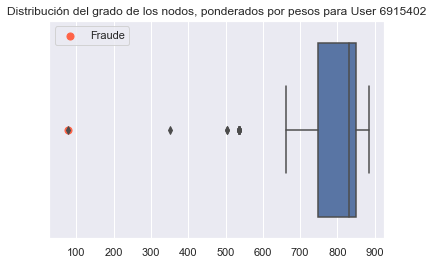



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


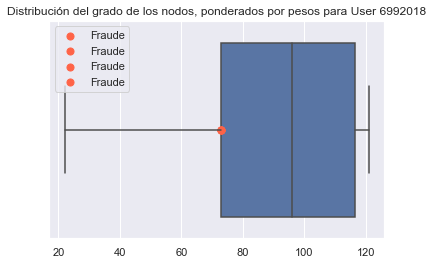



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


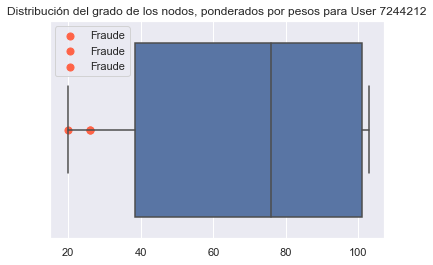



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.63% | Accuracy: 97.44% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


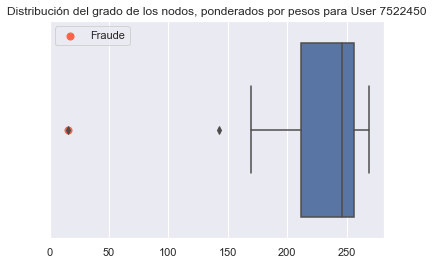



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 10.0% | Accuracy: 90.48% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


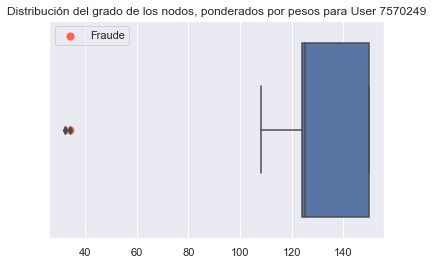



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


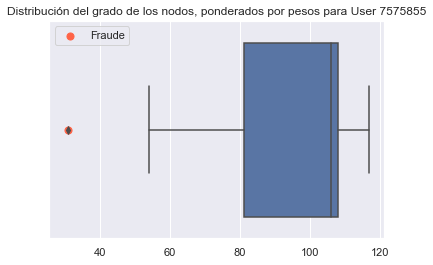



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


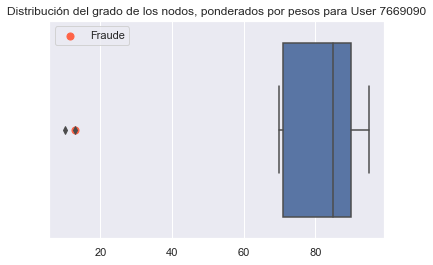



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 5.83% | Accuracy: 93.47% | Fraudes atrapados: 62.4% | Recall Avg: 70.22% | Precision Avg: 35.48%



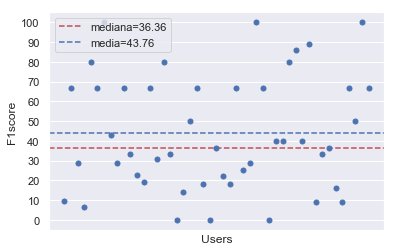

In [22]:
mod_base_3 = run_model(users,vars_for_grafo_3,data)

##### vars_for_grafo_4



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


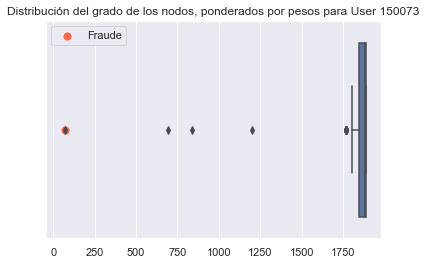



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 12.05% | Accuracy: 88.24% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


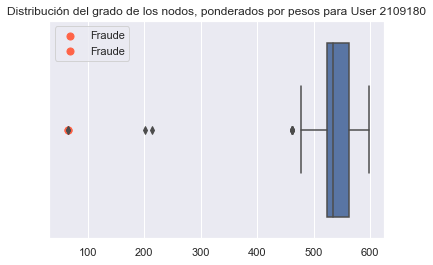



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 17.24% | Accuracy: 83.33% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


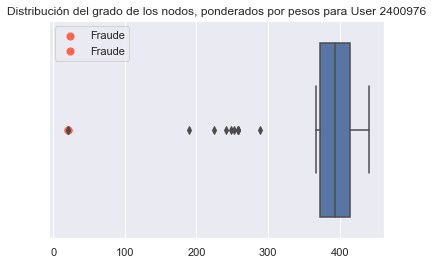



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 30
 - TFP: 17.47% | Accuracy: 82.63% | Recall: 100.0%  | Precision: 3.33% | F1: 6.45%


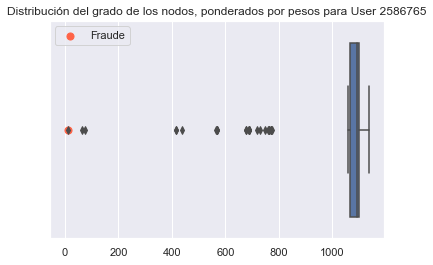



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


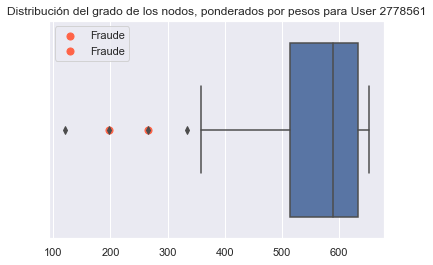



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.6% | Accuracy: 97.47% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


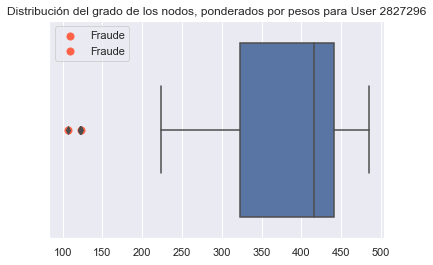



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


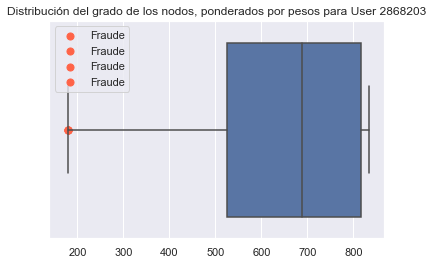



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


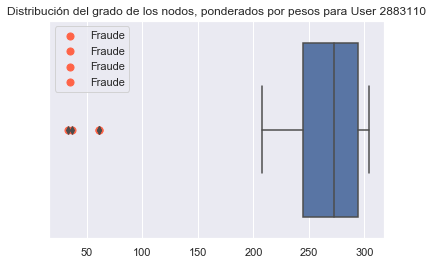



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 5.16% | Accuracy: 94.94% | Recall: 100.0%  | Precision: 27.27% | F1: 42.85%


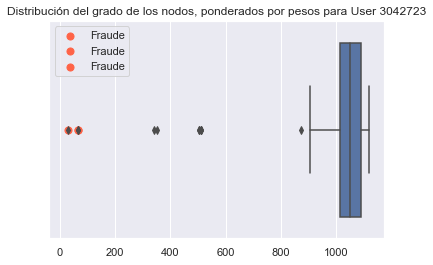



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.57% | Accuracy: 96.45% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


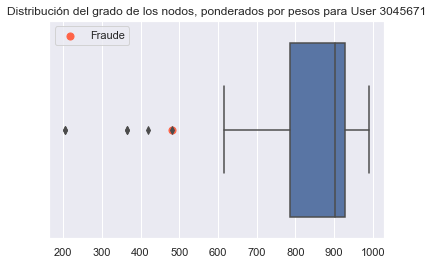



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


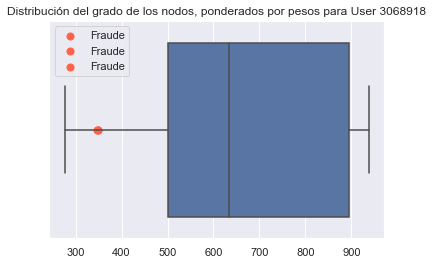



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


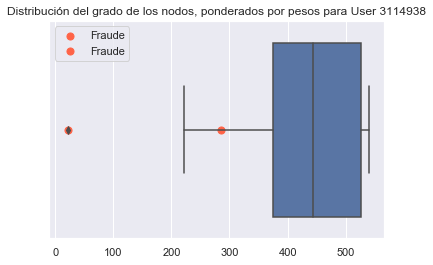



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 10.0% | Accuracy: 90.24% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


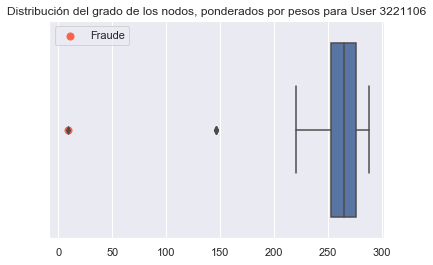



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


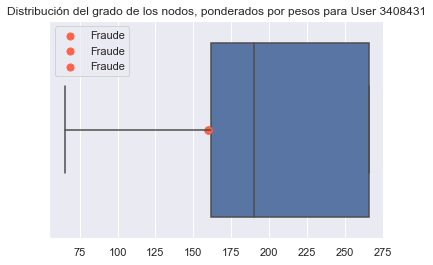



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 31
 - TFP: 19.57% | Accuracy: 80.99% | Recall: 100.0%  | Precision: 12.9% | F1: 22.85%


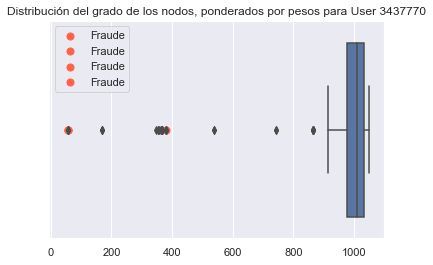



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 19
 - TFP: 11.81% | Accuracy: 88.36% | Recall: 100.0%  | Precision: 10.53% | F1: 19.05%


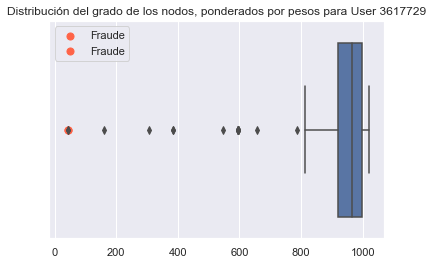



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 5.0% | Accuracy: 95.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


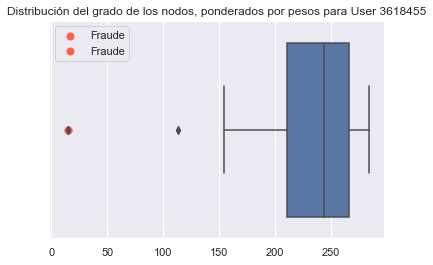



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 12.18% | Accuracy: 87.97% | Recall: 100.0%  | Precision: 9.52% | F1: 17.38%


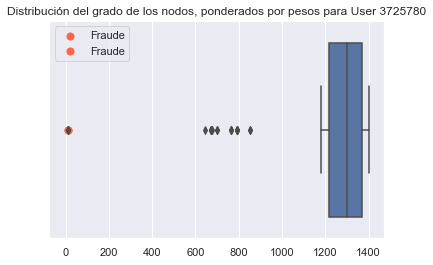



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


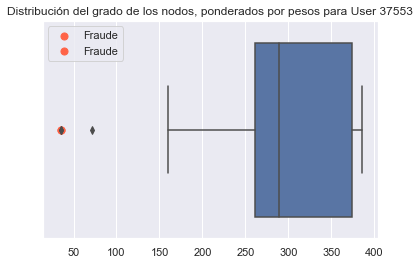



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


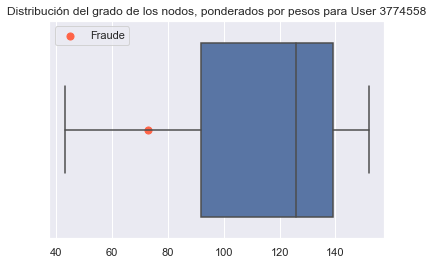



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.3% | Recall: 0.0%  | Precision: X% | F1: X%


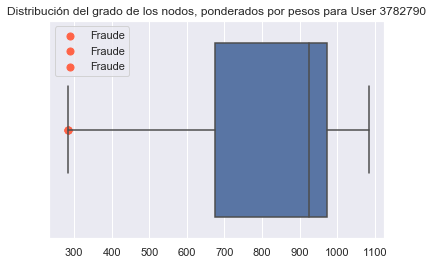



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 5.48% | Accuracy: 94.59% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


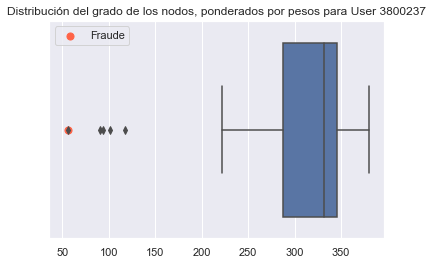



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.41% | Accuracy: 95.29% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


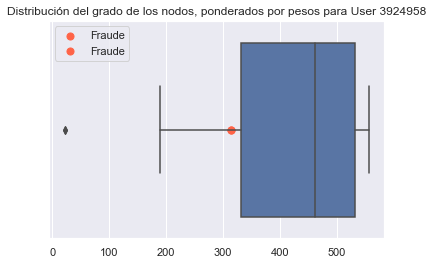



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


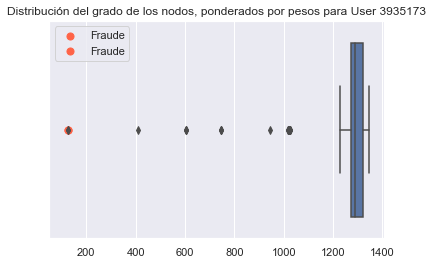



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 97.85% | Recall: 33.33%  | Precision: 100.0% | F1: 50.0%


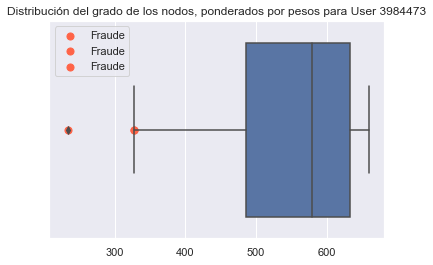



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


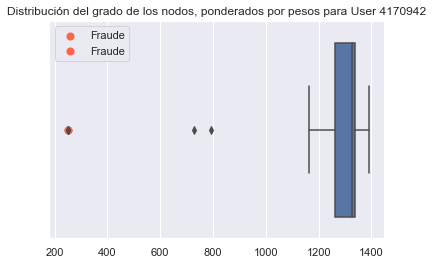



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


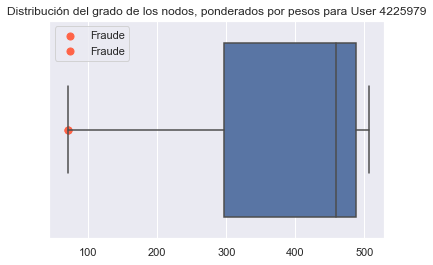



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 7.2% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


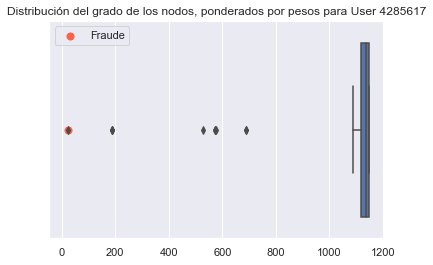



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 22.73% | Accuracy: 65.38% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


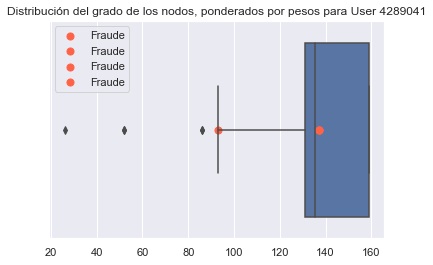



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 1.94% | Accuracy: 98.07% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


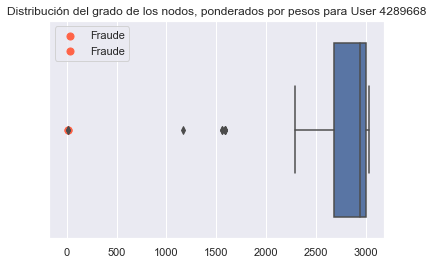



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 8.09% | Accuracy: 92.0% | Recall: 100.0%  | Precision: 12.5% | F1: 22.22%


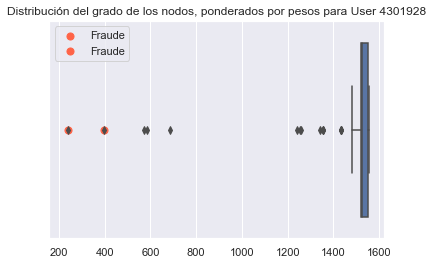



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 82.35% | Recall: 0.0%  | Precision: X% | F1: X%


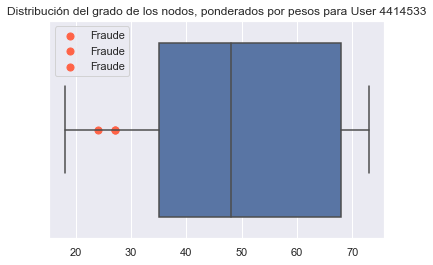



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.92% | Accuracy: 95.11% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


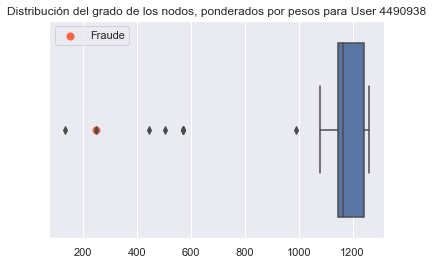



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 7.69% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


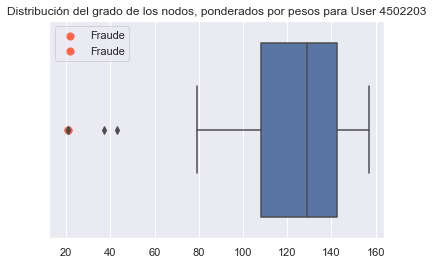



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 13.89% | Accuracy: 86.3% | Recall: 100.0%  | Precision: 9.09% | F1: 16.67%


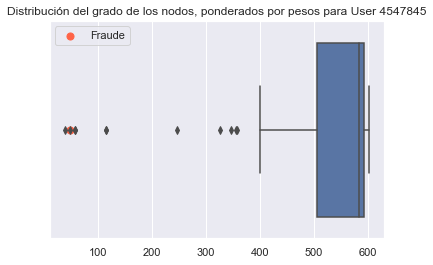



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


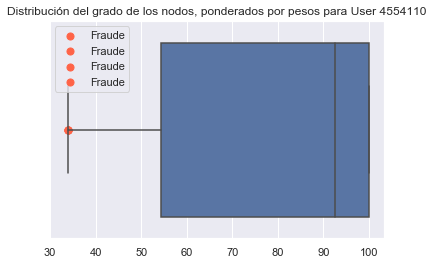



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


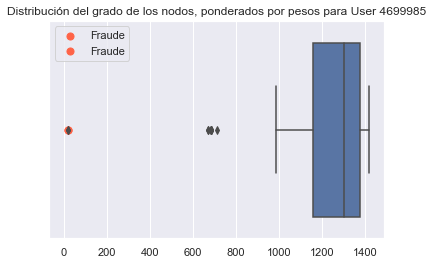



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


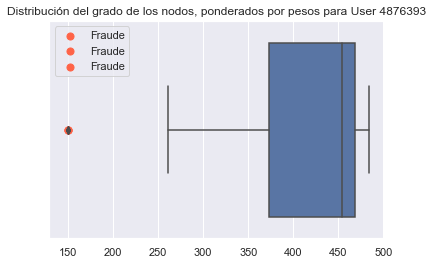



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.67% | Accuracy: 99.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


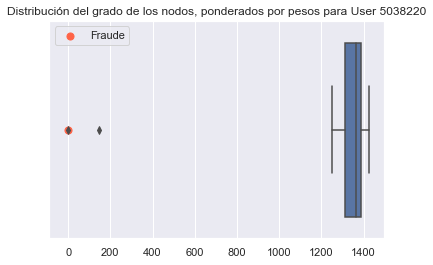



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 3.85% | Accuracy: 92.59% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


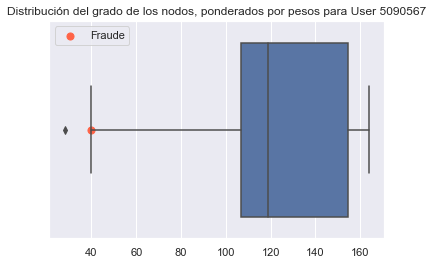



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 40.0% | Accuracy: 64.71% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


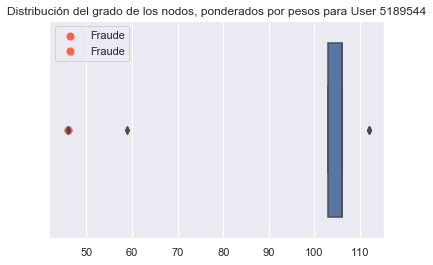



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.88% | Accuracy: 97.14% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


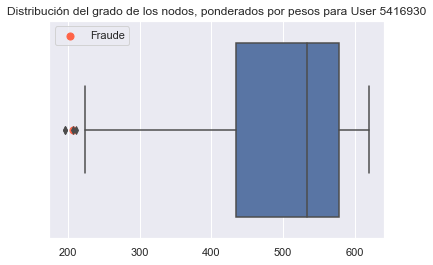



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 6.25% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


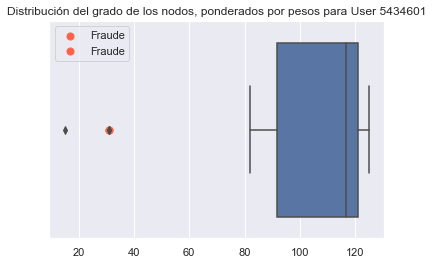



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 8.11% | Accuracy: 92.5% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


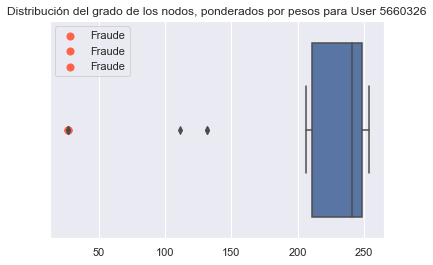



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 13.64% | Accuracy: 86.96% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


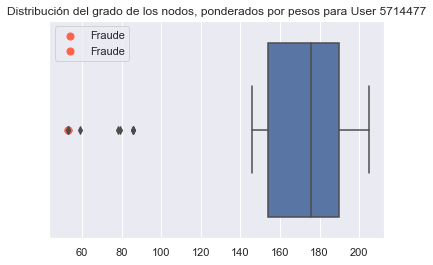



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 5.49% | Accuracy: 94.74% | Recall: 100.0%  | Precision: 44.44% | F1: 61.53%


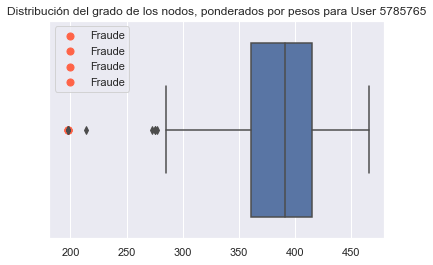



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.47% | Recall: 0.0%  | Precision: X% | F1: X%


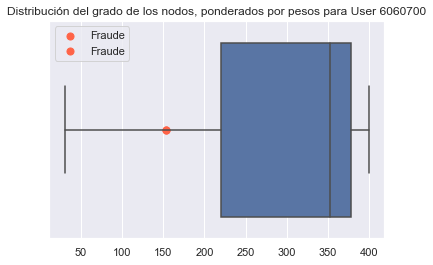



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 18
 - TFP: 12.5% | Accuracy: 87.59% | Recall: 100.0%  | Precision: 5.56% | F1: 10.53%


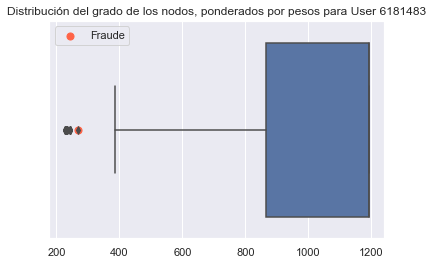



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


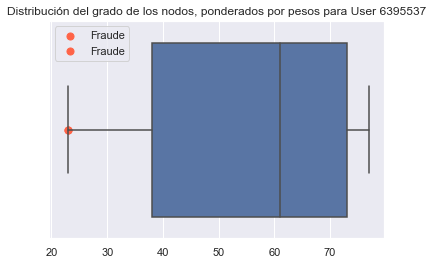



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


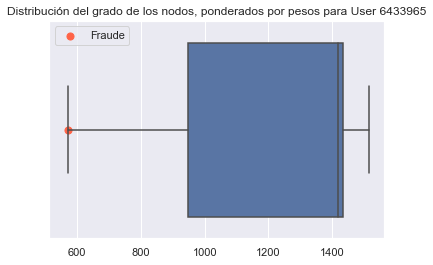



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


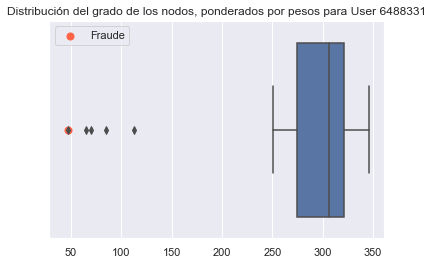



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.74% | Recall: 0.0%  | Precision: X% | F1: X%


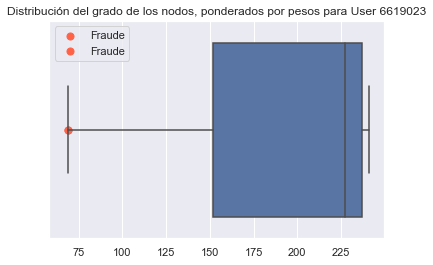



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.28% | Accuracy: 84.44% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


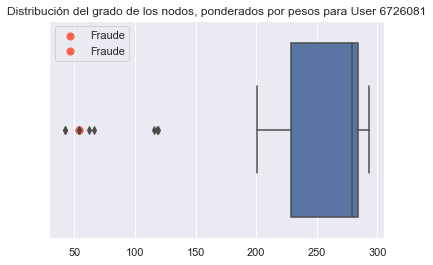



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


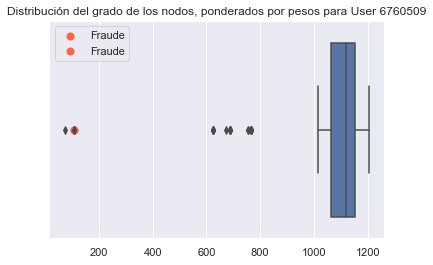



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.99% | Accuracy: 86.11% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


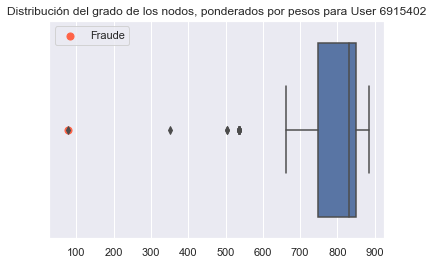



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


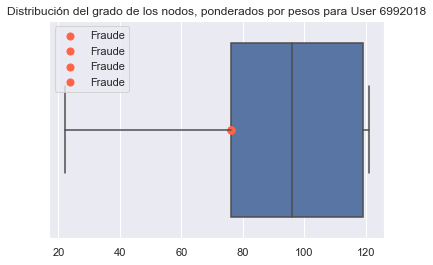



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


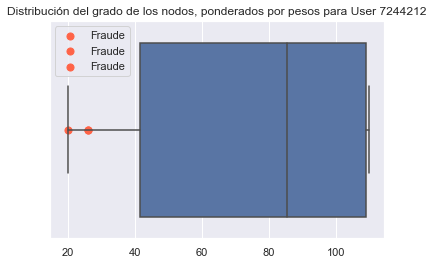



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.63% | Accuracy: 97.44% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


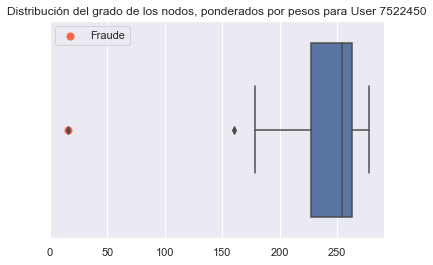



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 10.0% | Accuracy: 90.48% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


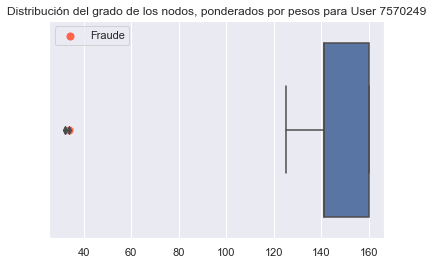



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 4.35% | Accuracy: 95.83% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


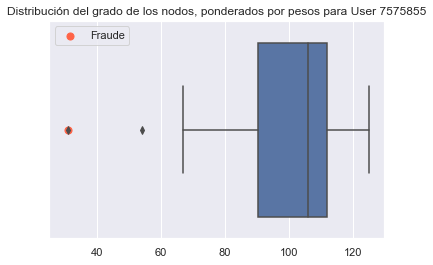



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


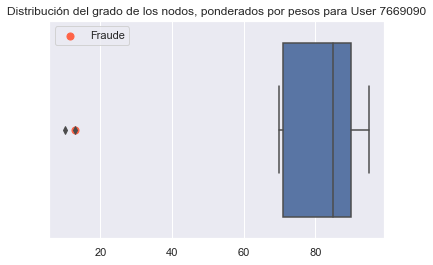



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 6.35% | Accuracy: 92.96% | Fraudes atrapados: 62.4% | Recall Avg: 70.22% | Precision Avg: 31.79%



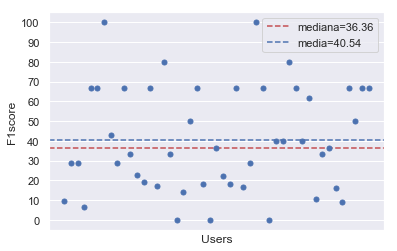

In [23]:
mod_base_4 = run_model(users,vars_for_grafo_4,data)

##### vars_for_grafo_5



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


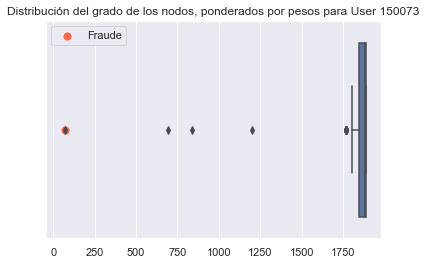



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


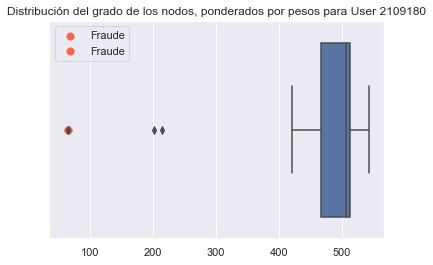



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 17.24% | Accuracy: 83.33% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


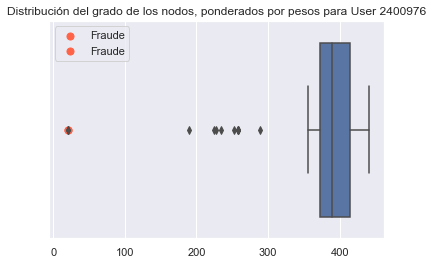



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 30
 - TFP: 17.47% | Accuracy: 82.63% | Recall: 100.0%  | Precision: 3.33% | F1: 6.45%


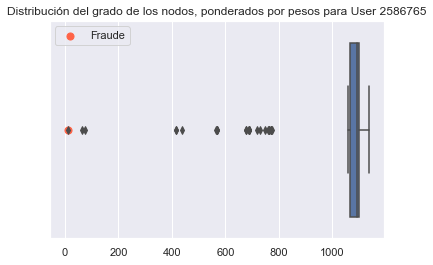



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


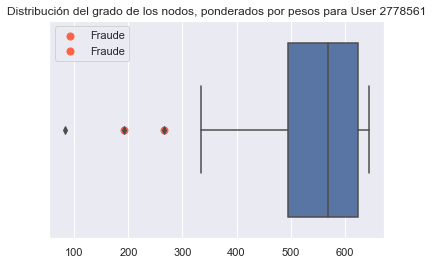



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.6% | Accuracy: 97.47% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


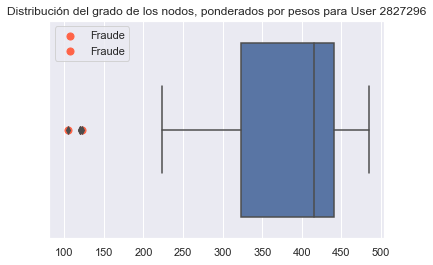



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


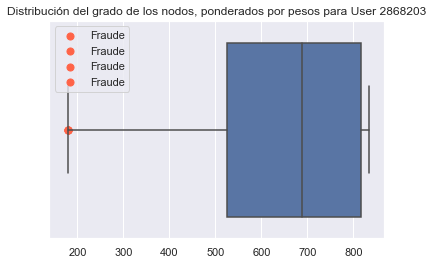



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


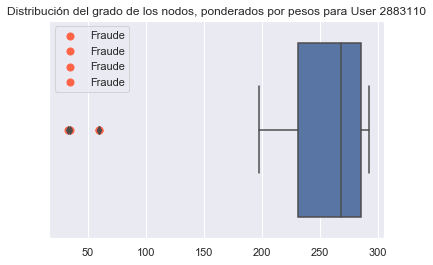



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 5.16% | Accuracy: 94.94% | Recall: 100.0%  | Precision: 27.27% | F1: 42.85%


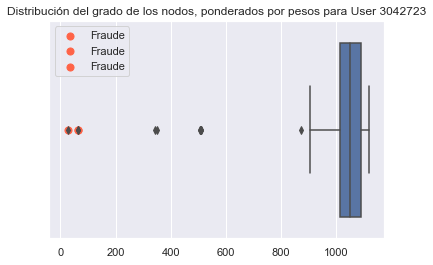



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.57% | Accuracy: 96.45% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


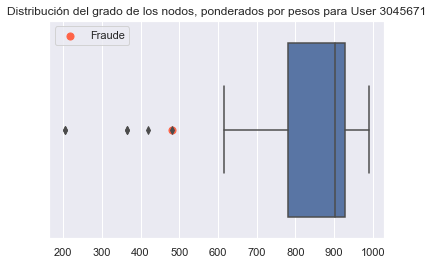



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


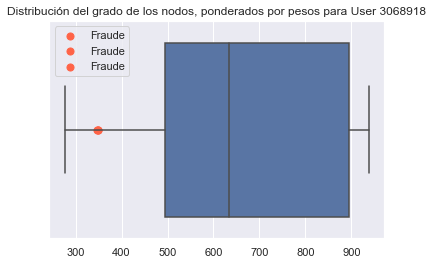



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


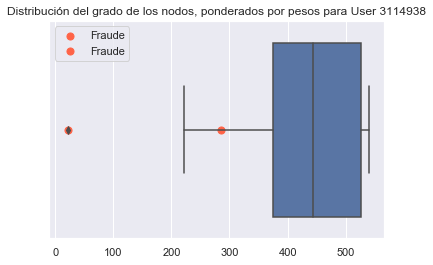



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 10.0% | Accuracy: 90.24% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


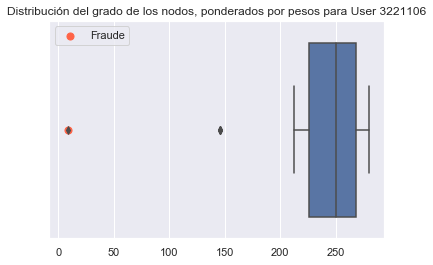



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


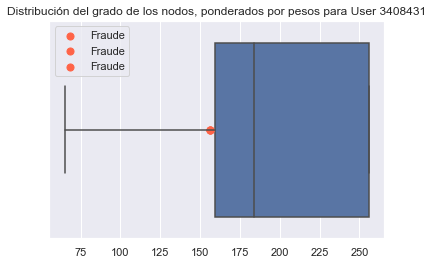



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 31
 - TFP: 19.57% | Accuracy: 80.99% | Recall: 100.0%  | Precision: 12.9% | F1: 22.85%


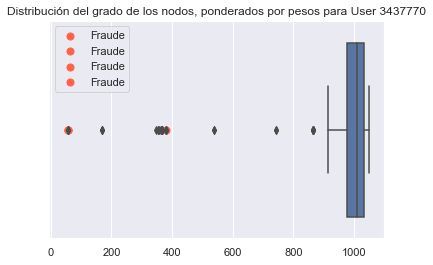



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 19
 - TFP: 11.81% | Accuracy: 88.36% | Recall: 100.0%  | Precision: 10.53% | F1: 19.05%


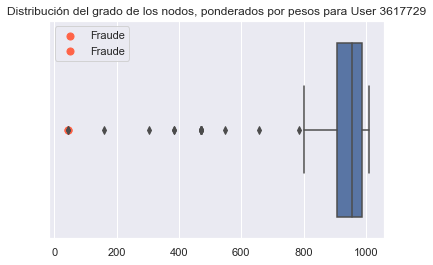



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 5.0% | Accuracy: 95.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


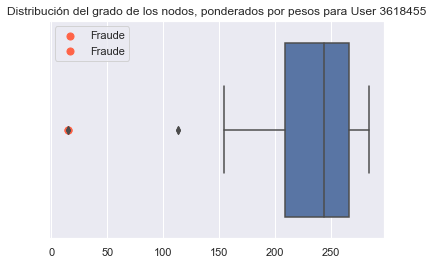



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 19
 - TFP: 10.9% | Accuracy: 89.24% | Recall: 100.0%  | Precision: 10.53% | F1: 19.05%


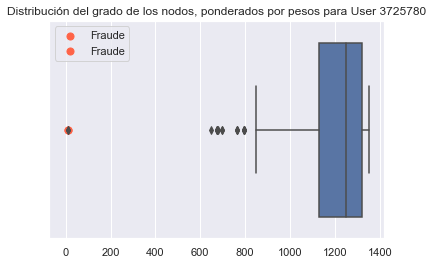



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


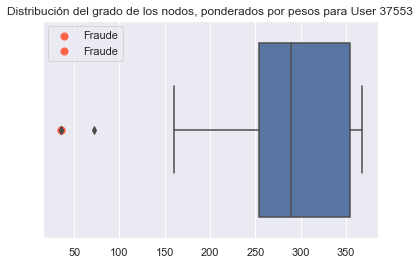



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


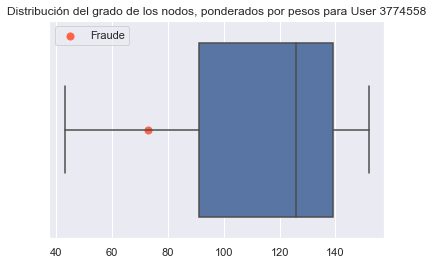



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.3% | Recall: 0.0%  | Precision: X% | F1: X%


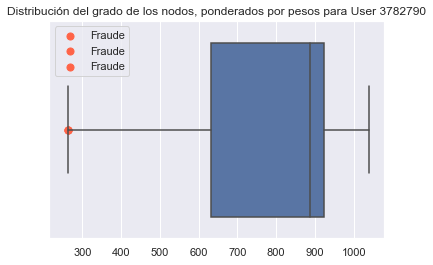



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 5.48% | Accuracy: 94.59% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


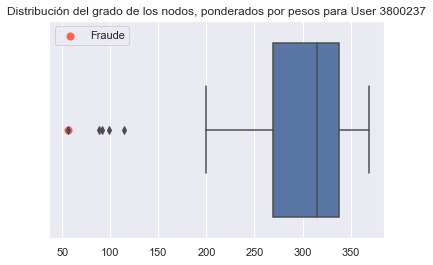



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.41% | Accuracy: 95.29% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


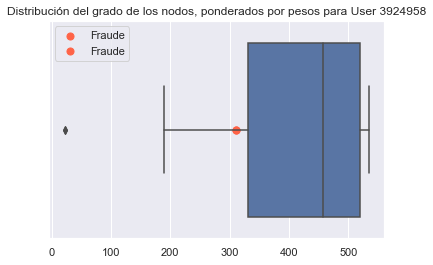



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


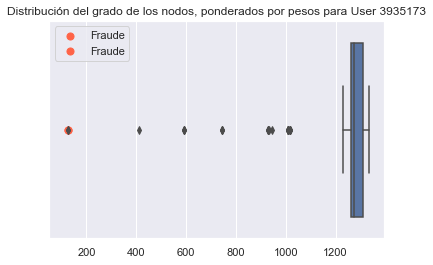



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 97.85% | Recall: 33.33%  | Precision: 100.0% | F1: 50.0%


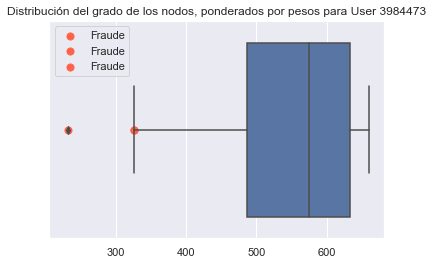



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


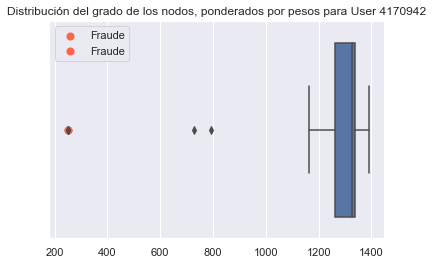



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


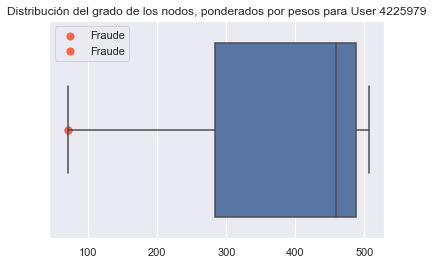



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 7.2% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


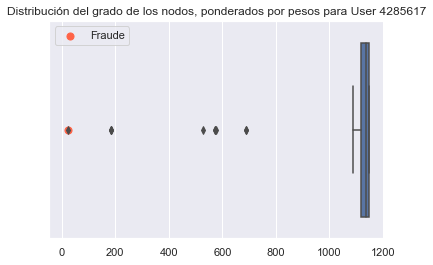



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 13.64% | Accuracy: 73.08% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


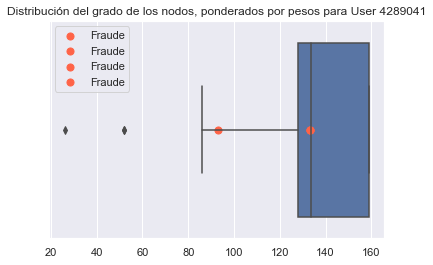



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 1.94% | Accuracy: 98.07% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


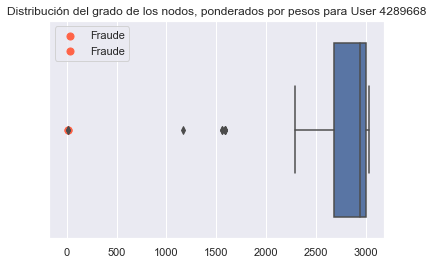



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 8.09% | Accuracy: 92.0% | Recall: 100.0%  | Precision: 12.5% | F1: 22.22%


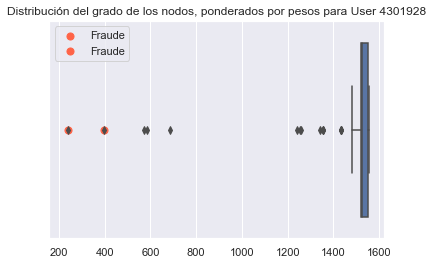



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 82.35% | Recall: 0.0%  | Precision: X% | F1: X%


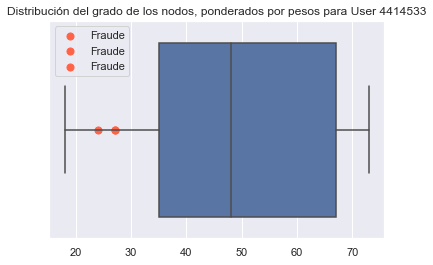



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.92% | Accuracy: 95.11% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


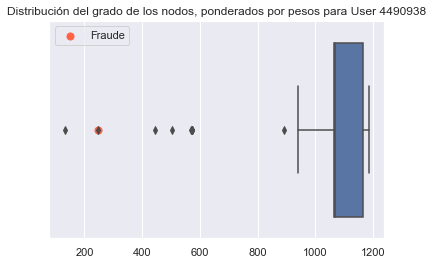



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 7.69% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


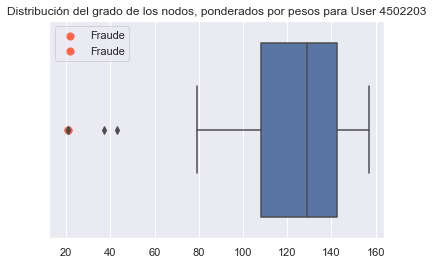



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 8.33% | Accuracy: 91.78% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


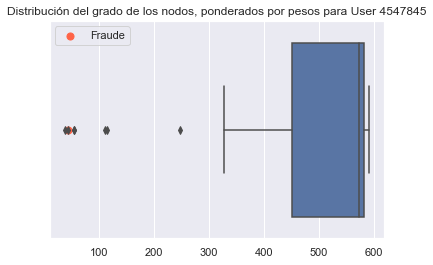



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


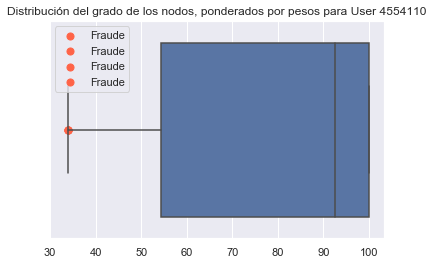



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


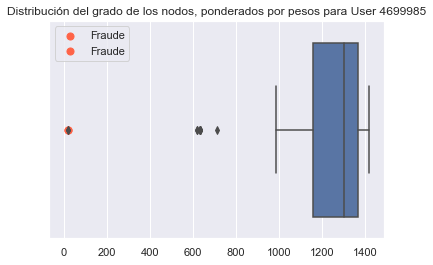



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


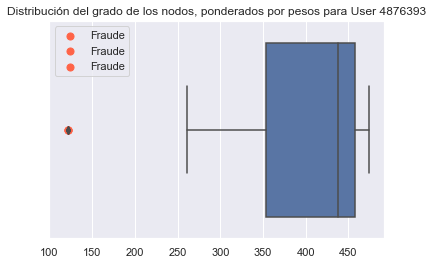



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.67% | Accuracy: 99.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


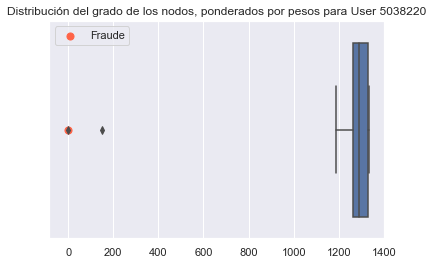



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 3.85% | Accuracy: 92.59% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


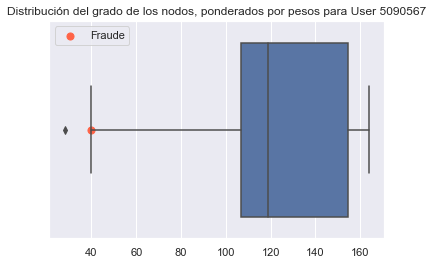



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 40.0% | Accuracy: 64.71% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


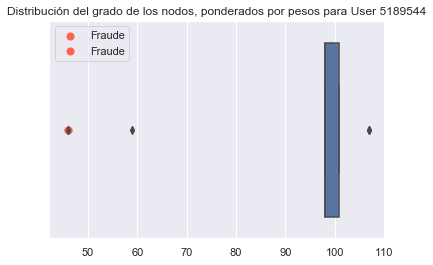



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.88% | Accuracy: 97.14% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


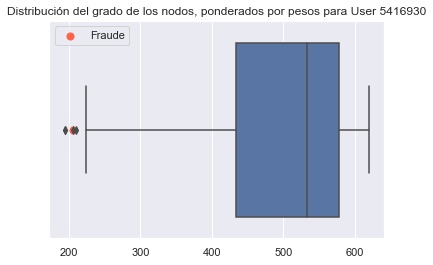



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 6.25% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


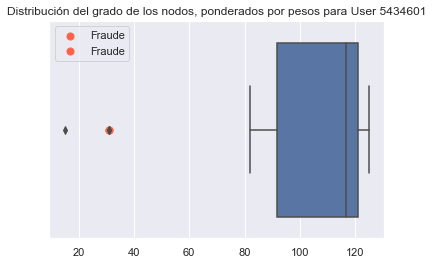



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 8.11% | Accuracy: 92.5% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


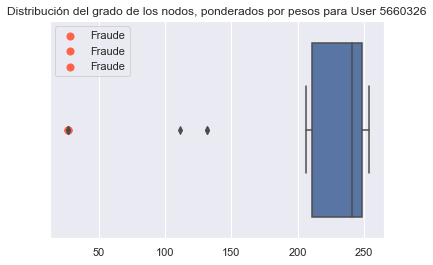



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 13.64% | Accuracy: 86.96% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


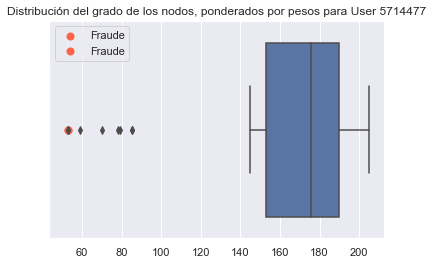



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 1.1% | Accuracy: 98.95% | Recall: 100.0%  | Precision: 80.0% | F1: 88.89%


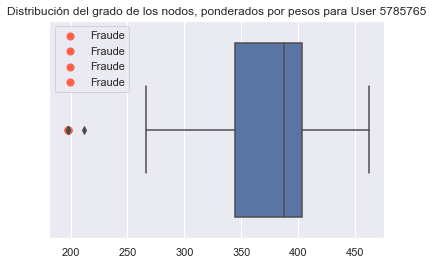



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.47% | Recall: 0.0%  | Precision: X% | F1: X%


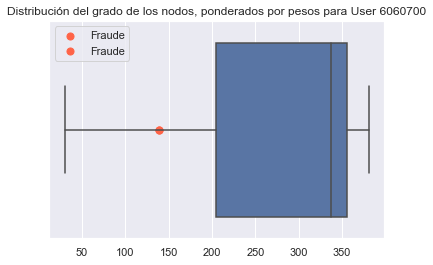



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 14.71% | Accuracy: 85.4% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


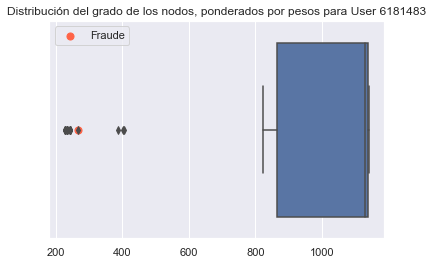



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


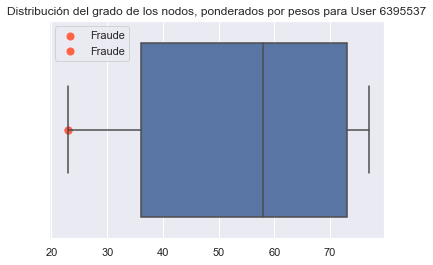



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


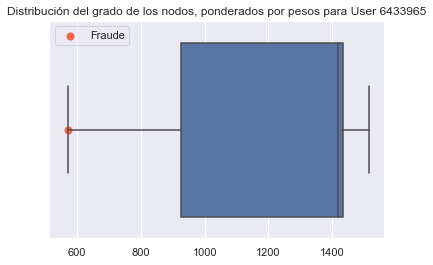



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


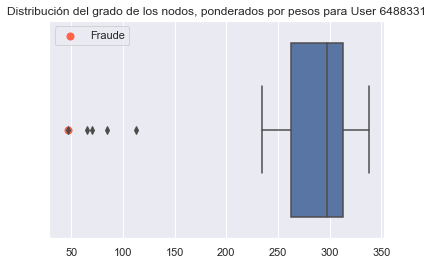



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.74% | Recall: 0.0%  | Precision: X% | F1: X%


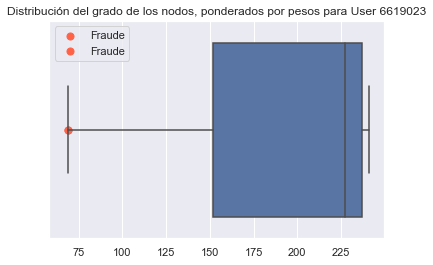



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.28% | Accuracy: 84.44% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


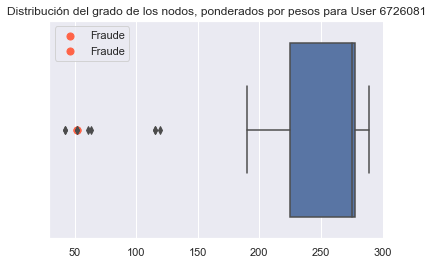



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


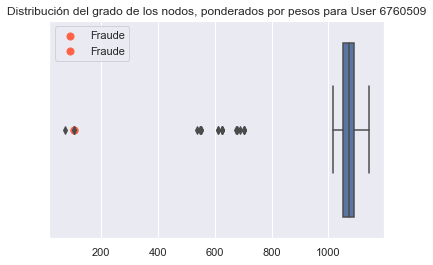



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.99% | Accuracy: 86.11% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


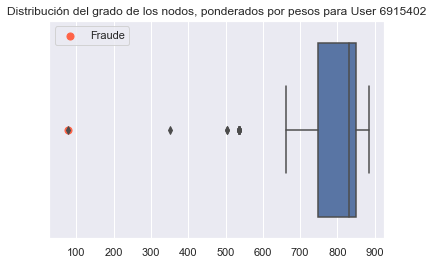



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


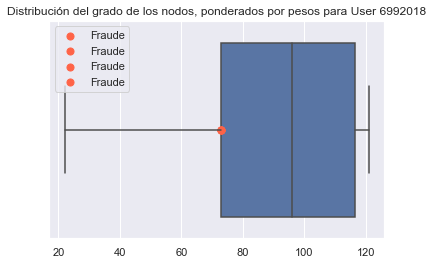



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


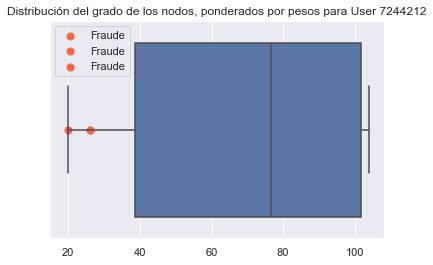



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.63% | Accuracy: 97.44% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


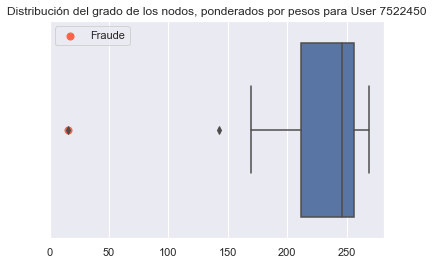



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 10.0% | Accuracy: 90.48% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


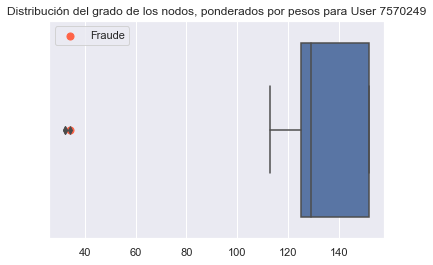



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 4.35% | Accuracy: 95.83% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


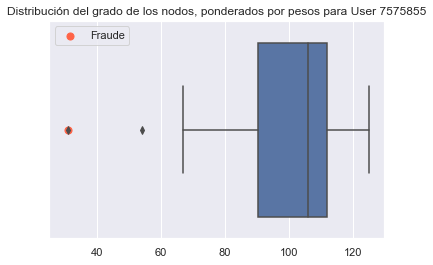



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


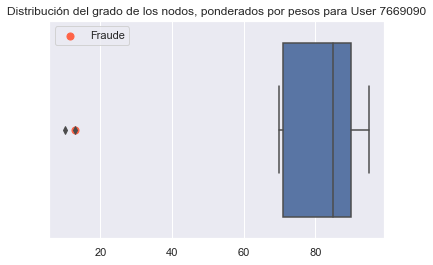



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 6.03% | Accuracy: 93.28% | Fraudes atrapados: 62.4% | Recall Avg: 70.22% | Precision Avg: 33.72%



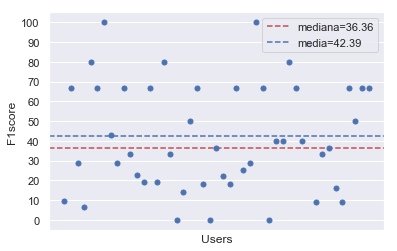

In [24]:
mod_base_5 = run_model(users,vars_for_grafo_5,data)

##### vars_for_grafo_6



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


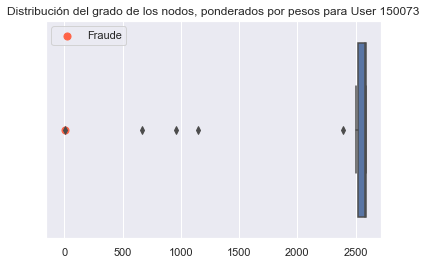



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


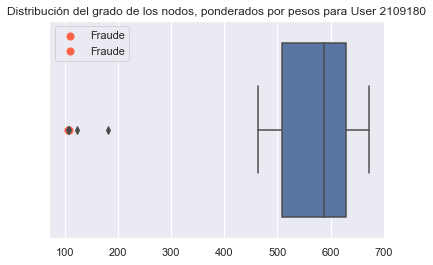



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


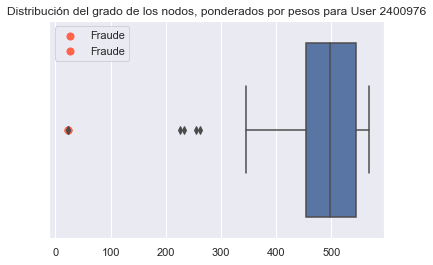



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 30
 - TFP: 17.47% | Accuracy: 82.63% | Recall: 100.0%  | Precision: 3.33% | F1: 6.45%


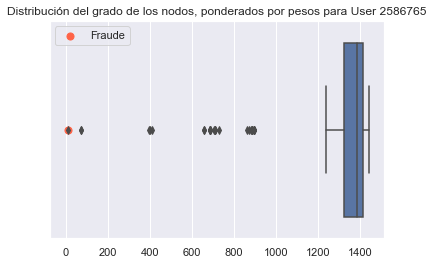



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


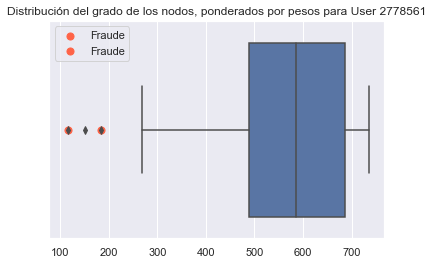



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 7.79% | Accuracy: 92.41% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


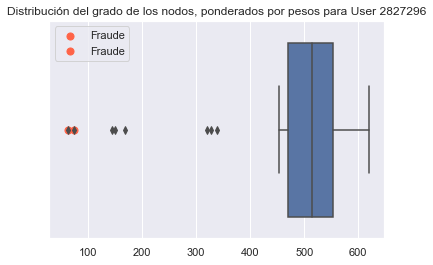



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


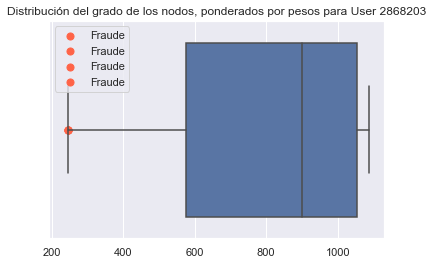



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


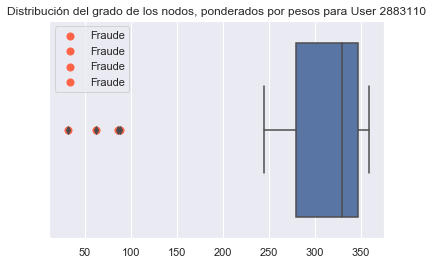



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 14.84% | Accuracy: 85.44% | Recall: 100.0%  | Precision: 11.54% | F1: 20.69%


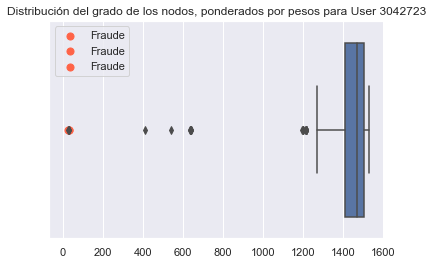



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.57% | Accuracy: 96.45% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


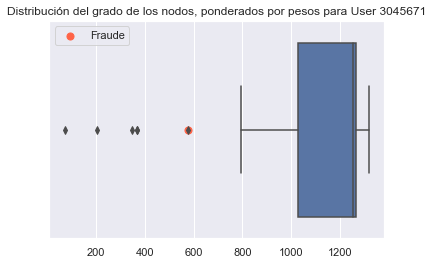



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


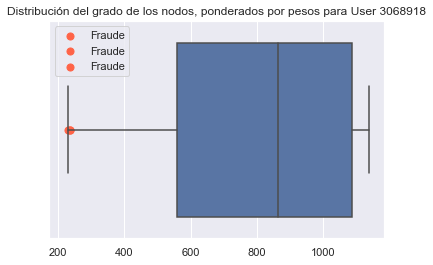



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


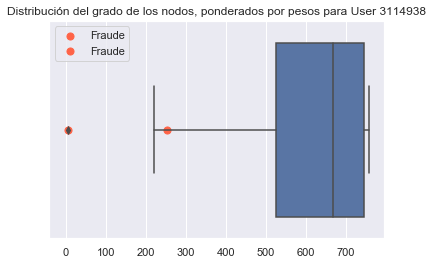



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 10.0% | Accuracy: 90.24% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


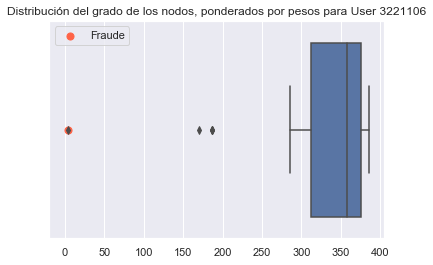



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


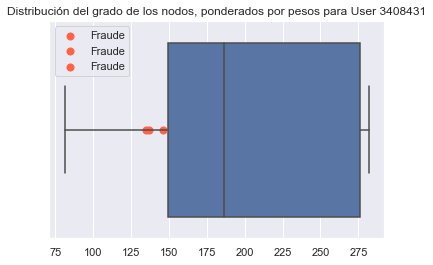



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 32
 - TFP: 20.29% | Accuracy: 80.28% | Recall: 100.0%  | Precision: 12.5% | F1: 22.22%


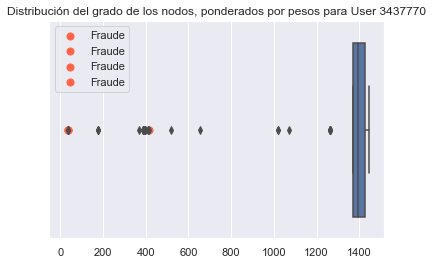



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 16.67% | Accuracy: 83.56% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


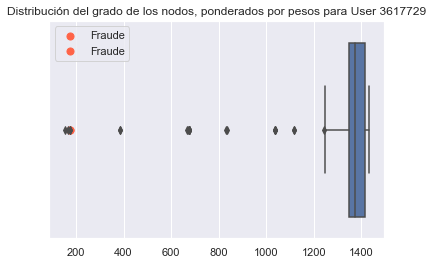



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.5% | Accuracy: 97.62% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


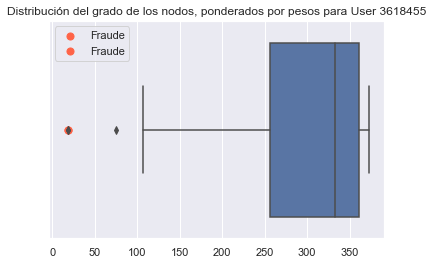



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 12.18% | Accuracy: 87.97% | Recall: 100.0%  | Precision: 9.52% | F1: 17.38%


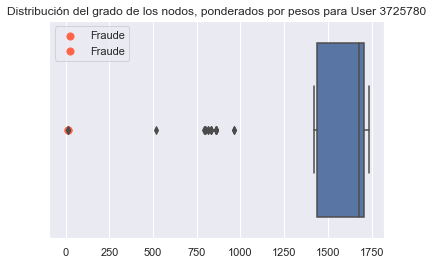



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


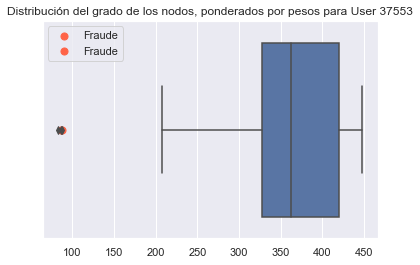



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


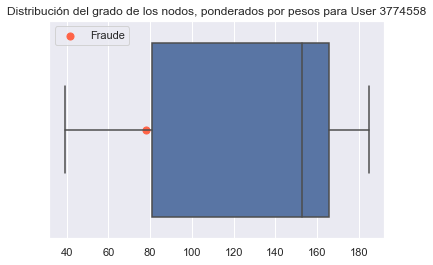



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.3% | Recall: 0.0%  | Precision: X% | F1: X%


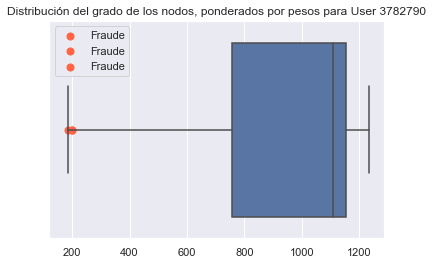



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 5.48% | Accuracy: 94.59% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


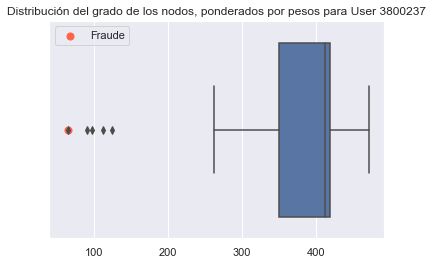



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.65% | Recall: 0.0%  | Precision: X% | F1: X%


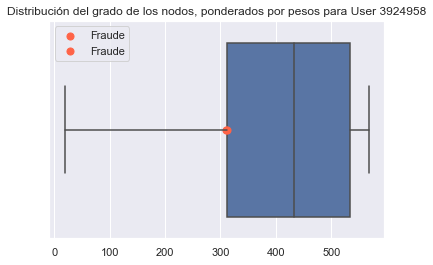



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


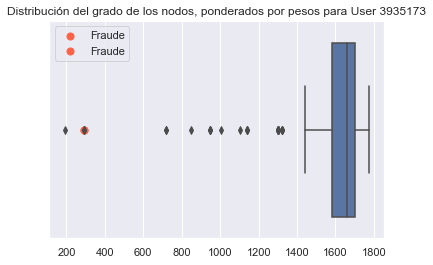



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


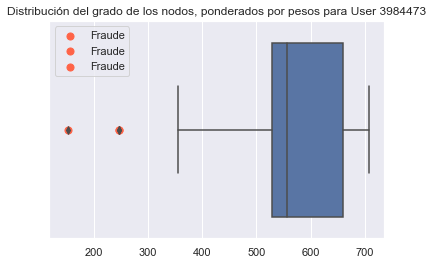



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


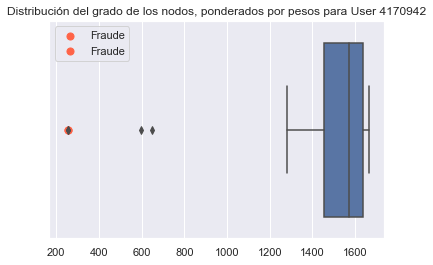



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


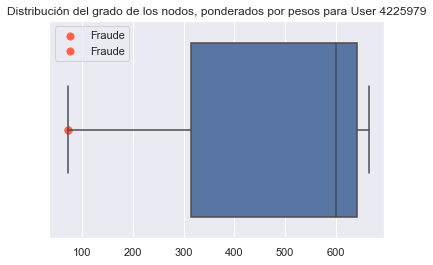



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


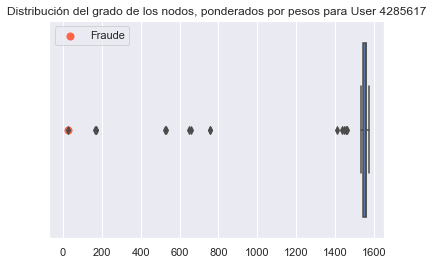



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 13.64% | Accuracy: 73.08% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


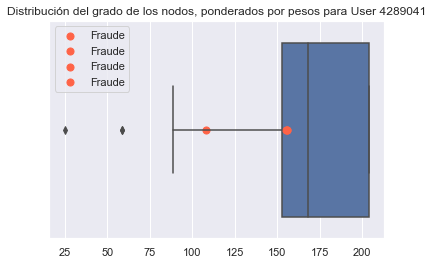



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 17
 - TFP: 4.17% | Accuracy: 95.86% | Recall: 100.0%  | Precision: 11.76% | F1: 21.05%


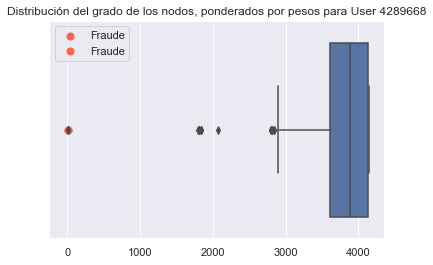



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 5.78% | Accuracy: 94.29% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


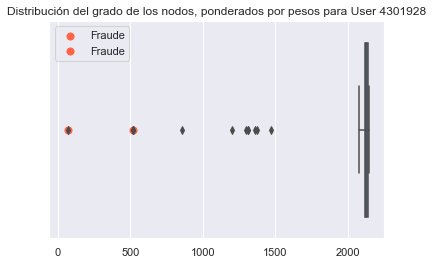



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 82.35% | Recall: 0.0%  | Precision: X% | F1: X%


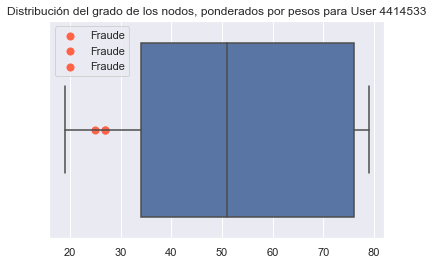



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.92% | Accuracy: 95.11% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


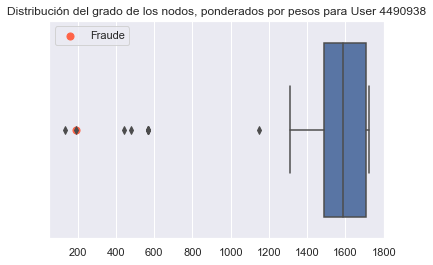



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 3.85% | Accuracy: 96.43% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


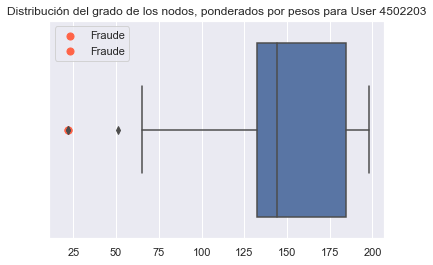



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 8.33% | Accuracy: 91.78% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


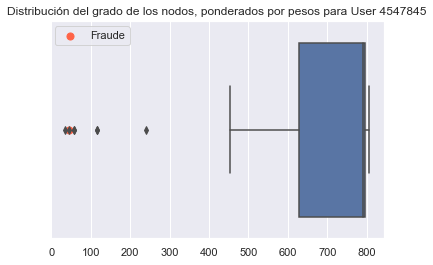



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


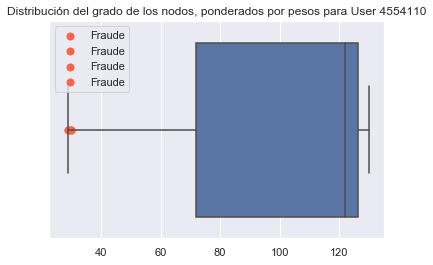



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


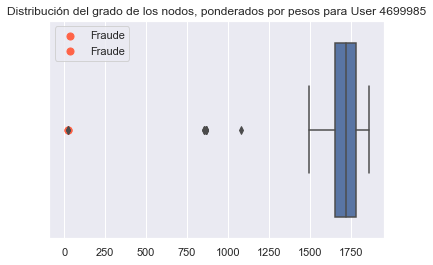



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


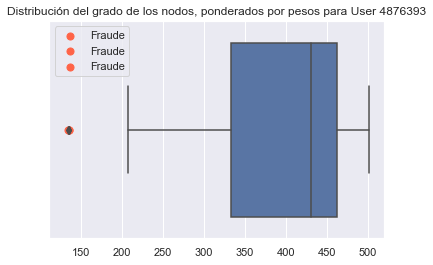



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 4.03% | Accuracy: 96.0% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


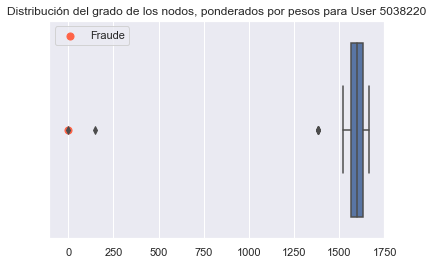



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 15.38% | Accuracy: 85.19% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


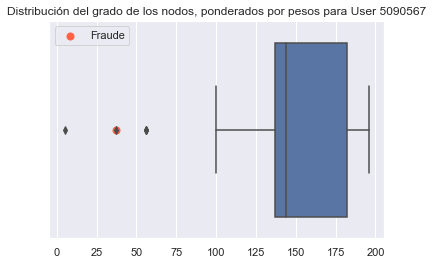



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 33.33% | Accuracy: 70.59% | Recall: 100.0%  | Precision: 28.57% | F1: 44.44%


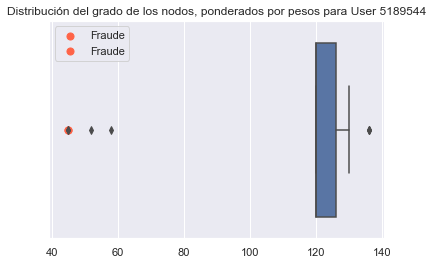



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 5.77% | Accuracy: 94.29% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


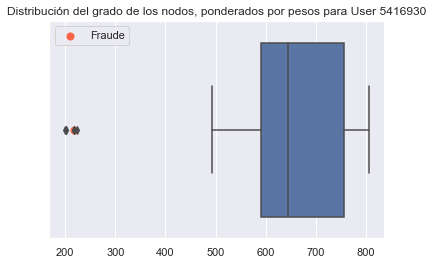



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 6.25% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


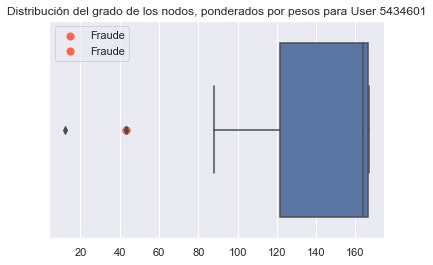



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 8.11% | Accuracy: 92.5% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


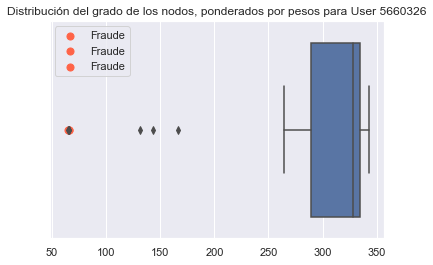



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 9.09% | Accuracy: 91.3% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


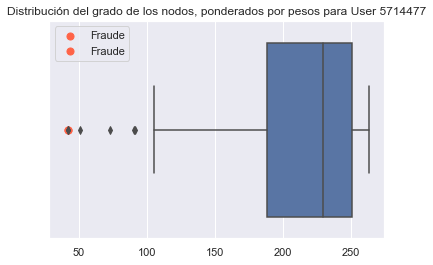



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.79% | Recall: 0.0%  | Precision: X% | F1: X%


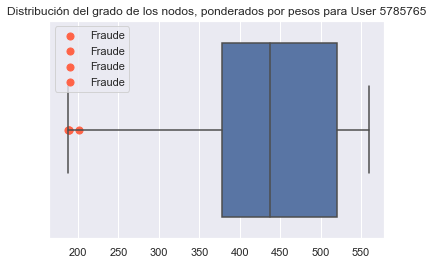



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 1.3% | Accuracy: 96.2% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


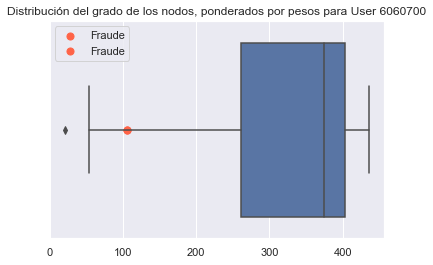



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.27% | Recall: 0.0%  | Precision: X% | F1: X%


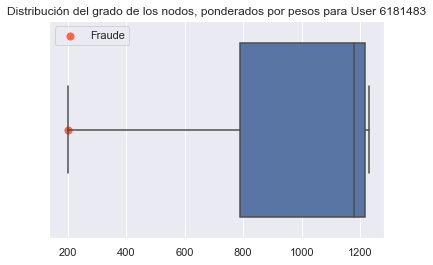



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


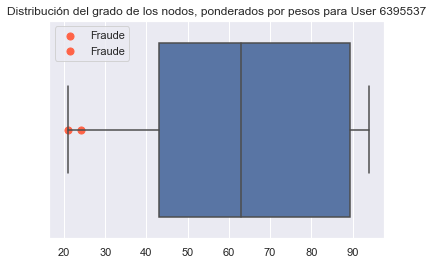



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


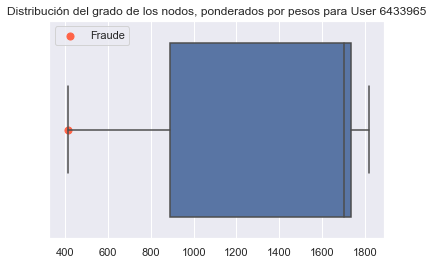



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


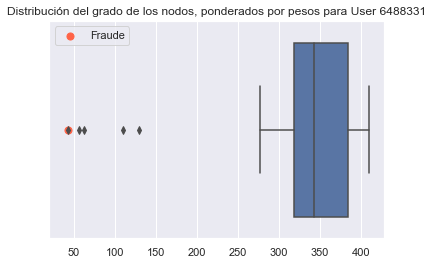



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.74% | Recall: 0.0%  | Precision: X% | F1: X%


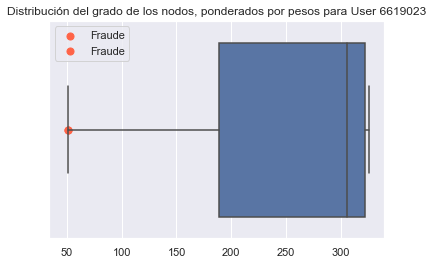



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.28% | Accuracy: 84.44% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


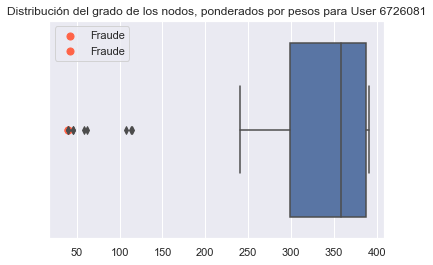



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


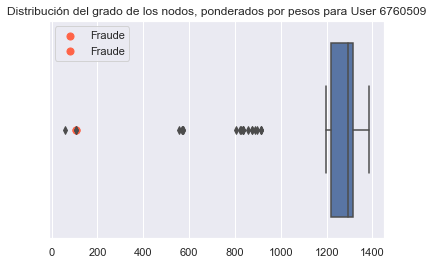



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


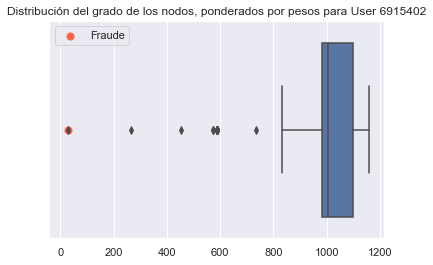



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


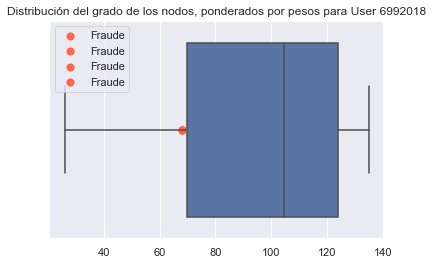



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


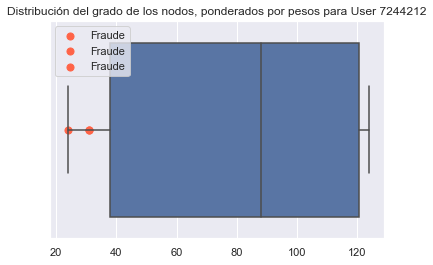



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


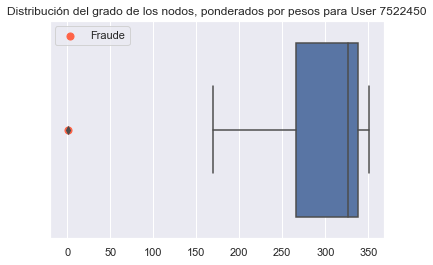



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 10.0% | Accuracy: 90.48% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


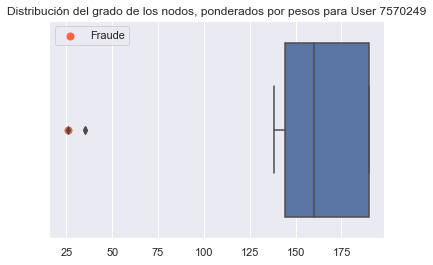



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


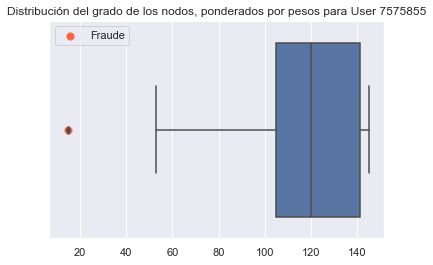



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


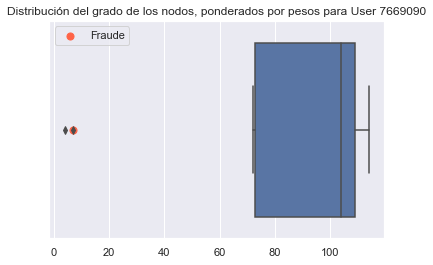



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 6.04% | Accuracy: 93.23% | Fraudes atrapados: 60.8% | Recall Avg: 69.67% | Precision Avg: 35.46%



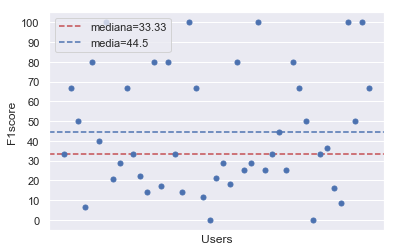

In [25]:
mod_base_6 = run_model(users,vars_for_grafo_6,data)

##### vars_for_grafo_7



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


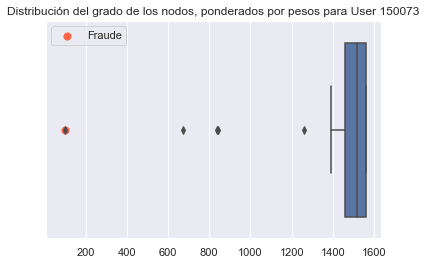



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


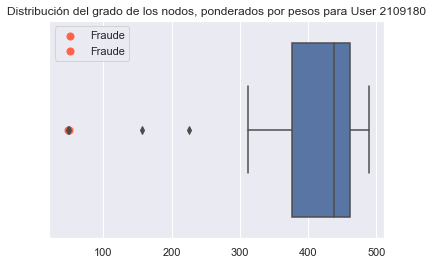



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


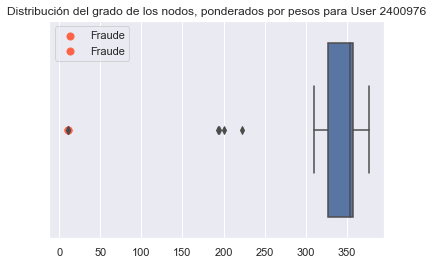



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 15
 - TFP: 8.43% | Accuracy: 91.62% | Recall: 100.0%  | Precision: 6.67% | F1: 12.51%


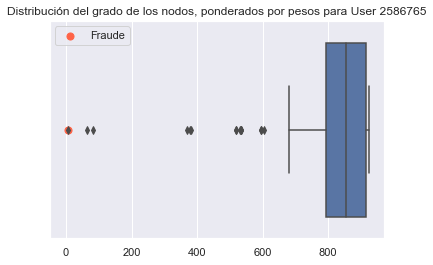



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


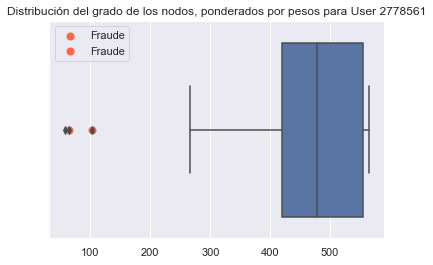



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


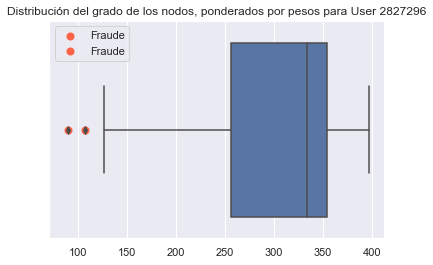



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


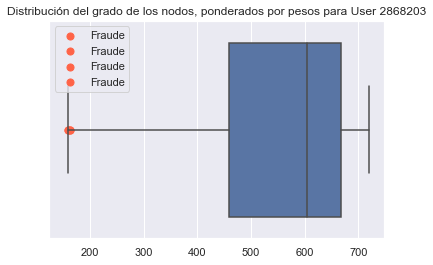



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


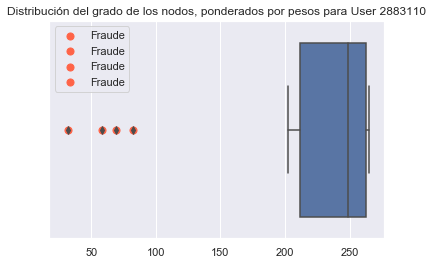



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 5.81% | Accuracy: 94.3% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


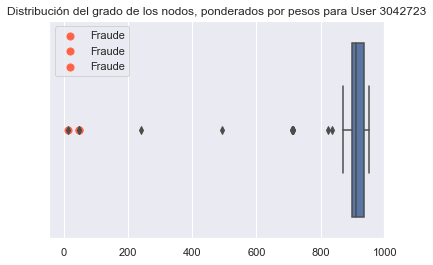



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 4.29% | Accuracy: 95.74% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


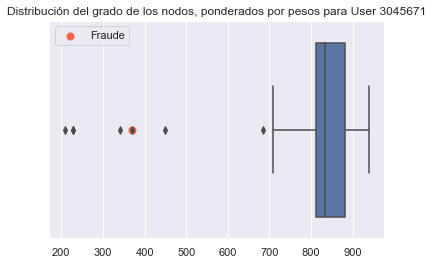



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


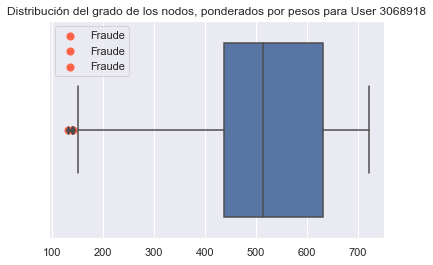



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


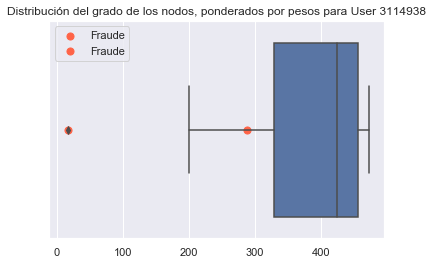



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.5% | Accuracy: 97.56% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


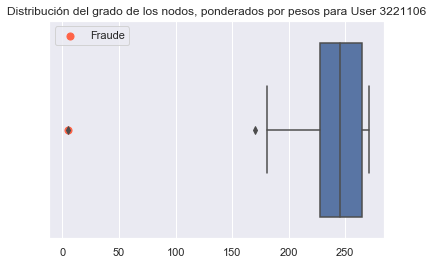



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


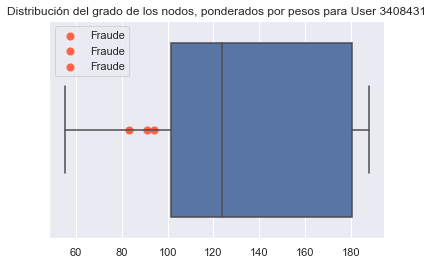



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.77% | Accuracy: 86.62% | Recall: 100.0%  | Precision: 17.39% | F1: 29.63%


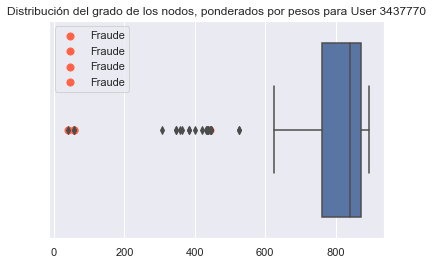



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 18
 - TFP: 11.11% | Accuracy: 89.04% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


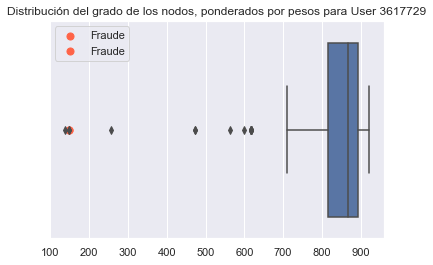



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.5% | Accuracy: 97.62% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


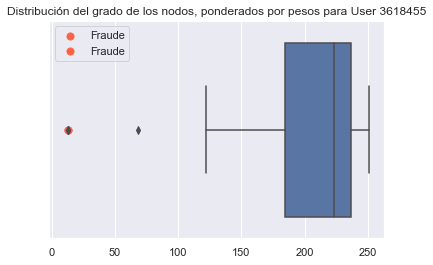



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 12.18% | Accuracy: 87.97% | Recall: 100.0%  | Precision: 9.52% | F1: 17.38%


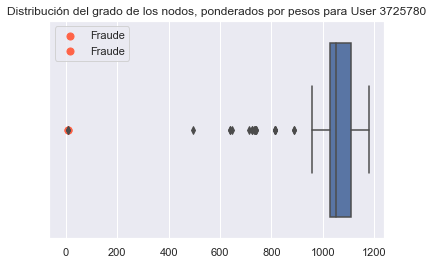



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


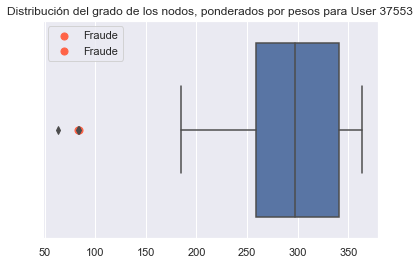



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


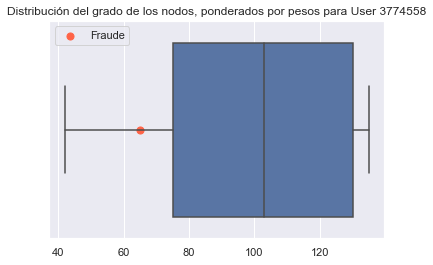



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


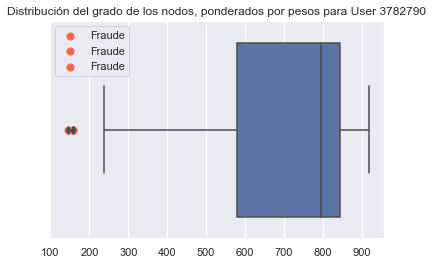



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.65% | Recall: 0.0%  | Precision: X% | F1: X%


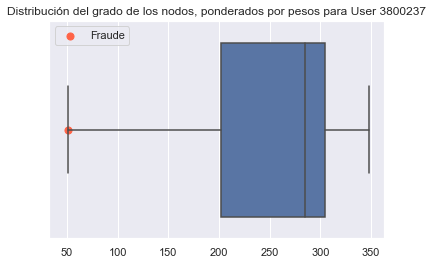



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.65% | Recall: 0.0%  | Precision: X% | F1: X%


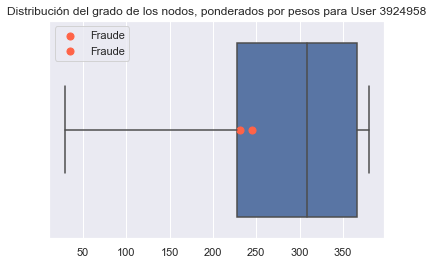



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 25
 - TFP: 12.23% | Accuracy: 87.89% | Recall: 100.0%  | Precision: 8.0% | F1: 14.81%


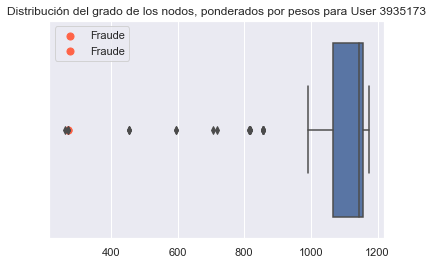



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.11% | Accuracy: 98.92% | Recall: 100.0%  | Precision: 75.0% | F1: 85.71%


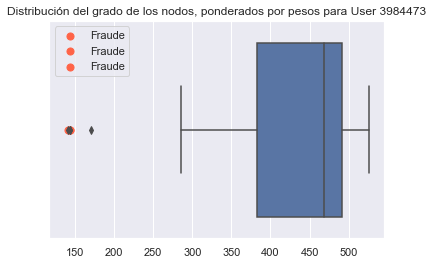



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 1.66% | Accuracy: 98.36% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


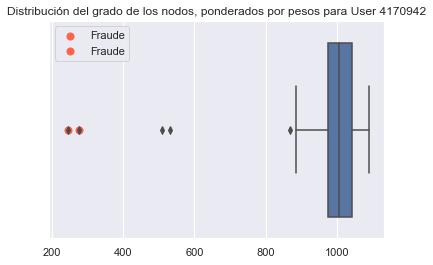



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


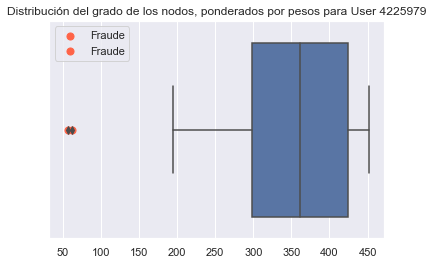



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


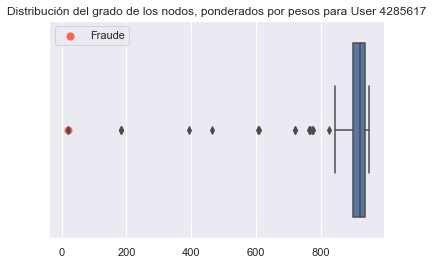



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 4.55% | Accuracy: 80.77% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


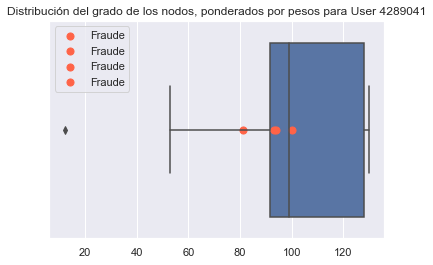



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 52
 - TFP: 13.89% | Accuracy: 86.19% | Recall: 100.0%  | Precision: 3.85% | F1: 7.41%


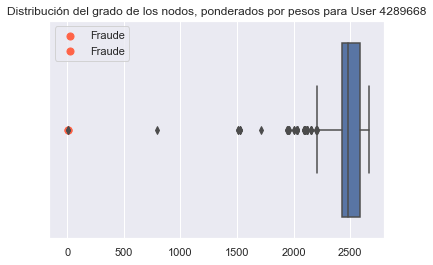



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 15
 - TFP: 7.51% | Accuracy: 92.57% | Recall: 100.0%  | Precision: 13.33% | F1: 23.52%


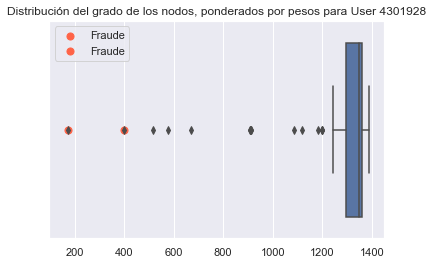



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 82.35% | Recall: 0.0%  | Precision: X% | F1: X%


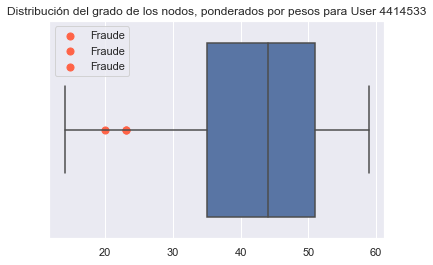



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 4.37% | Accuracy: 95.65% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


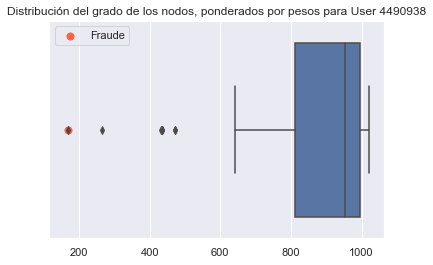



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


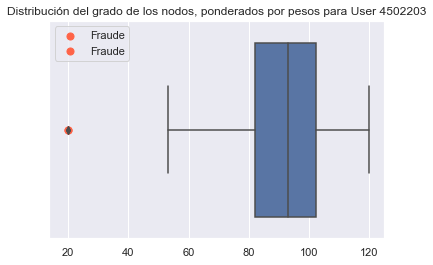



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 15.28% | Accuracy: 84.93% | Recall: 100.0%  | Precision: 8.33% | F1: 15.38%


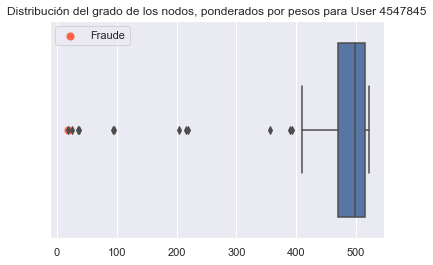



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


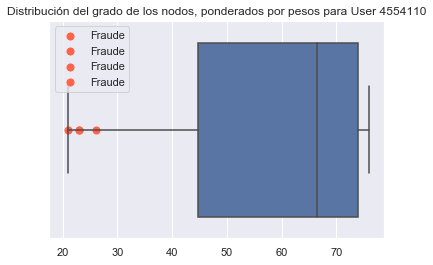



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


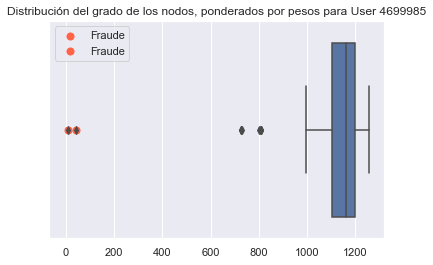



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


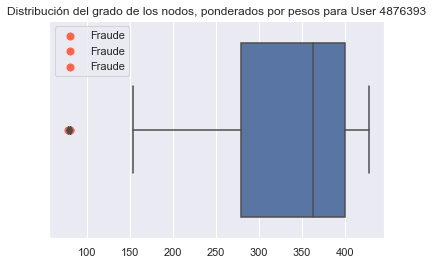



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.67% | Accuracy: 99.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


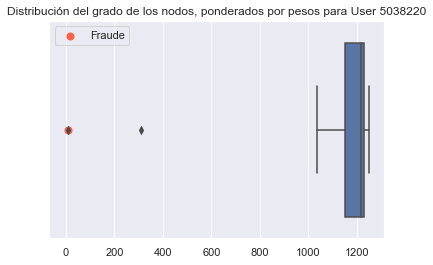



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 3.85% | Accuracy: 96.3% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


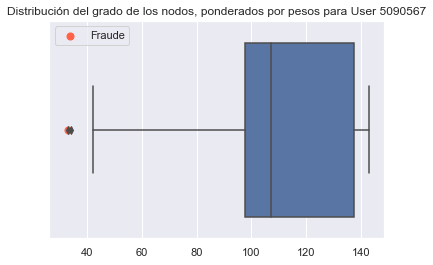



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 7.14% | Accuracy: 93.75% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


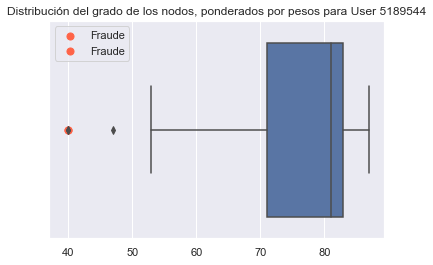



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 4.81% | Accuracy: 94.29% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


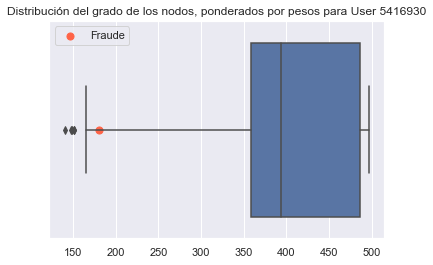



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 6.25% | Accuracy: 83.33% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


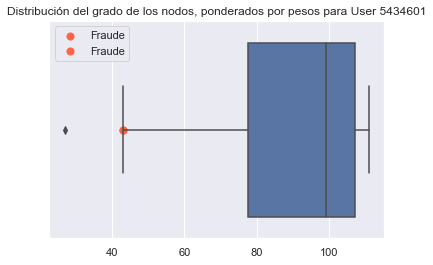



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 10.81% | Accuracy: 90.0% | Recall: 100.0%  | Precision: 42.86% | F1: 60.0%


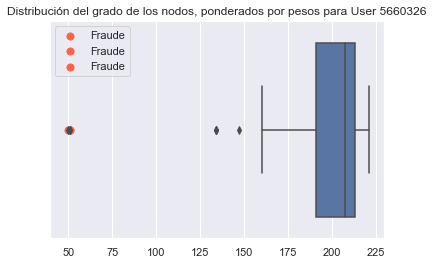



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.27% | Accuracy: 97.83% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


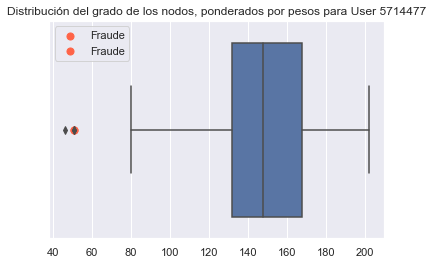



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


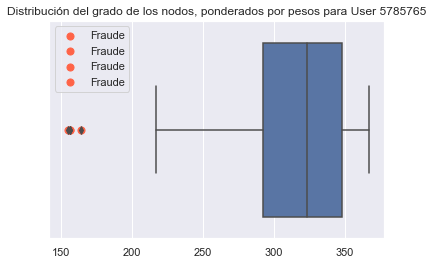



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.47% | Recall: 0.0%  | Precision: X% | F1: X%


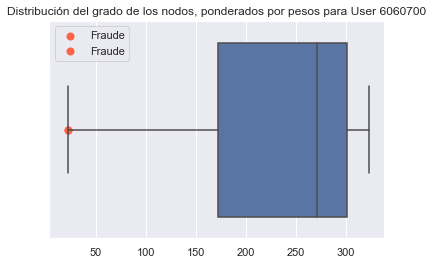



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 14.71% | Accuracy: 85.4% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


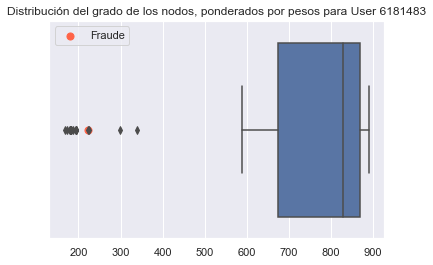



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


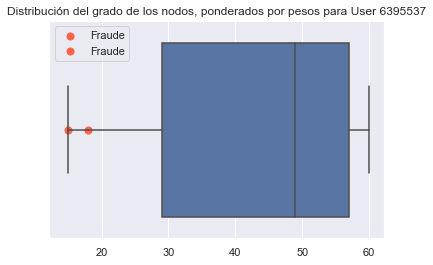



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


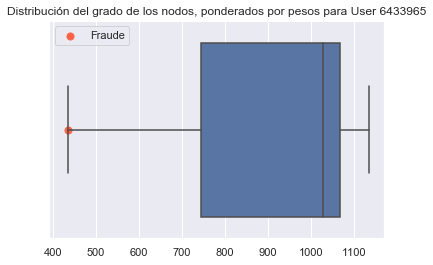



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 6.52% | Accuracy: 93.62% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


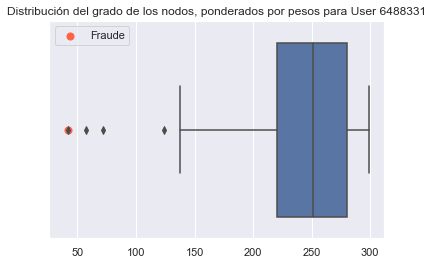



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


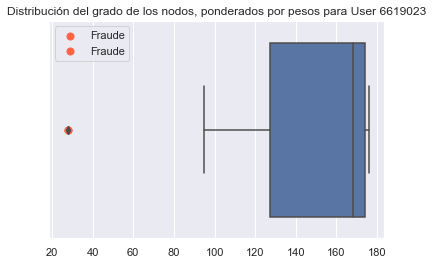



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.56% | Recall: 0.0%  | Precision: X% | F1: X%


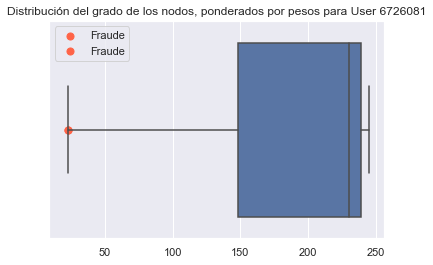



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


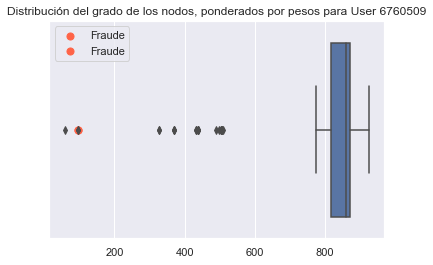



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 24
 - TFP: 16.08% | Accuracy: 84.03% | Recall: 100.0%  | Precision: 4.17% | F1: 8.01%


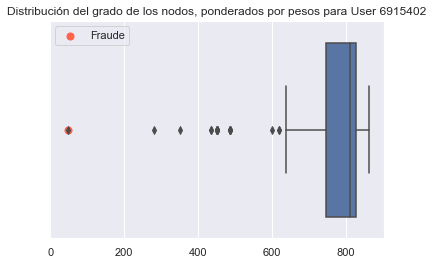



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


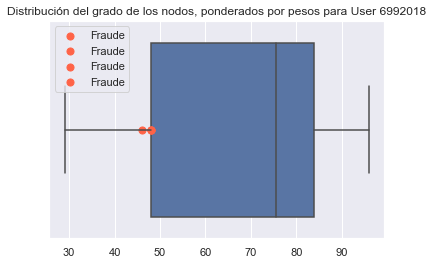



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


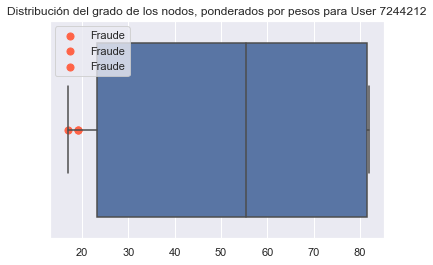



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.63% | Accuracy: 97.44% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


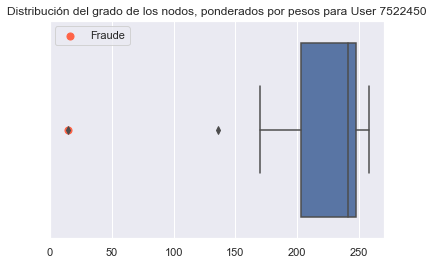



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


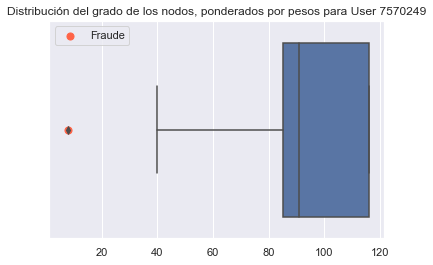



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


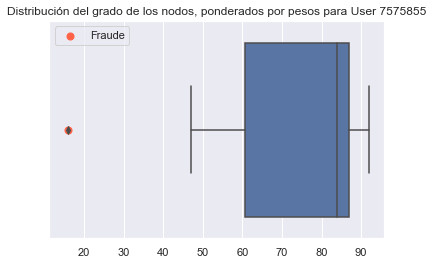



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


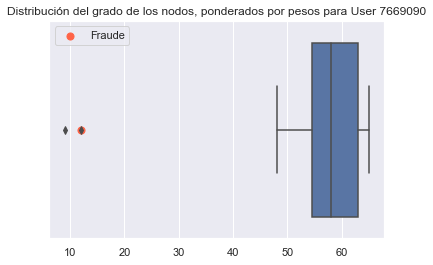



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 5.67% | Accuracy: 93.75% | Fraudes atrapados: 68.0% | Recall Avg: 72.95% | Precision Avg: 46.64%



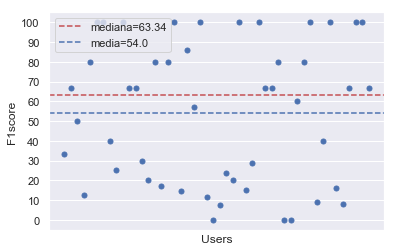

In [26]:
mod_base_7 = run_model(users,vars_for_grafo_7,data)

##### vars_for_grafo_8



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


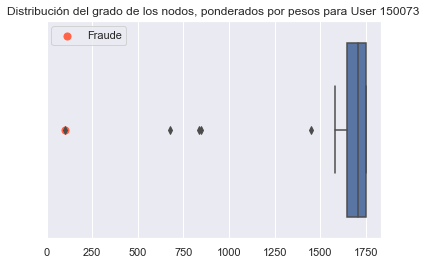



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


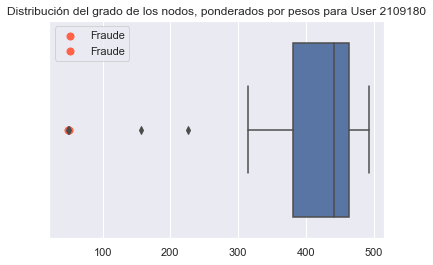



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


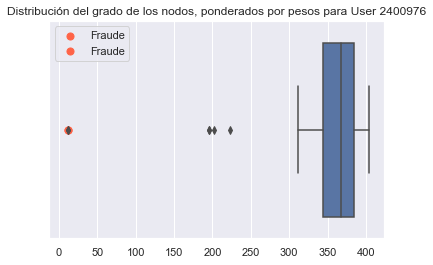



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 19
 - TFP: 10.84% | Accuracy: 89.22% | Recall: 100.0%  | Precision: 5.26% | F1: 9.99%


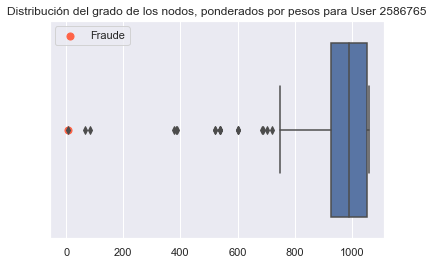



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


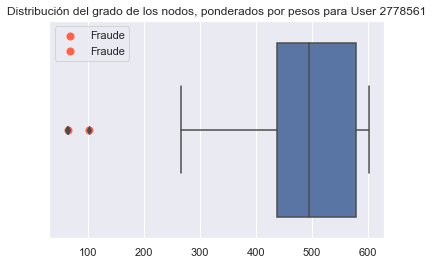



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 3.9% | Accuracy: 96.2% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


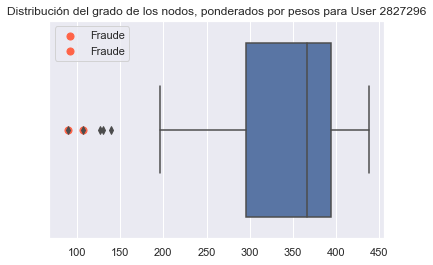



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


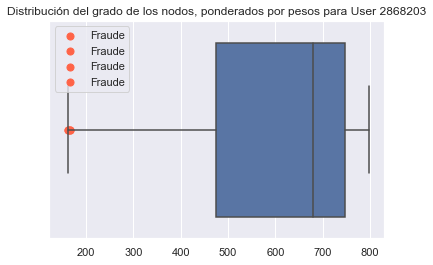



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


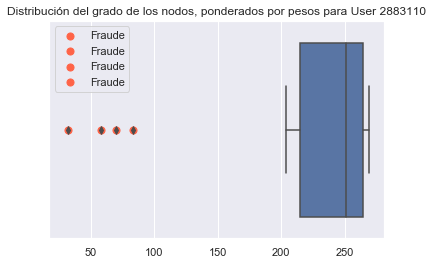



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 27
 - TFP: 15.48% | Accuracy: 84.81% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


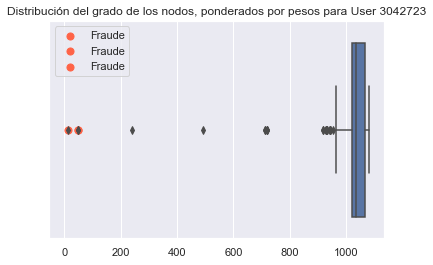



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 5.71% | Accuracy: 94.33% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


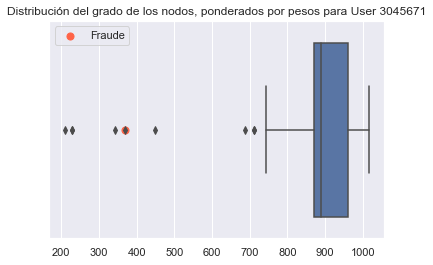



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


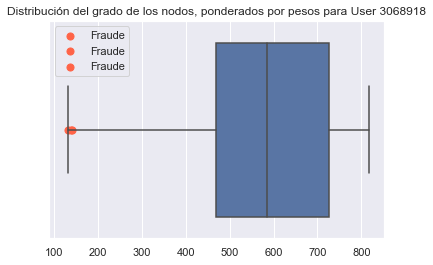



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


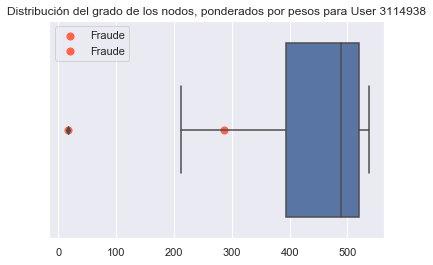



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


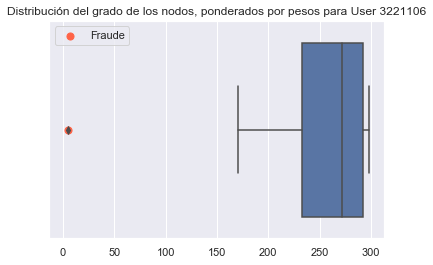



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


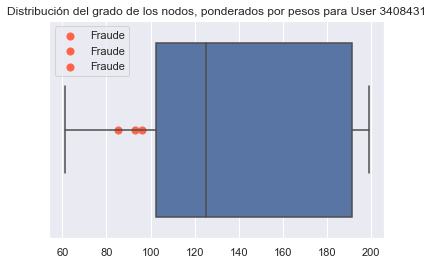



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 24
 - TFP: 14.49% | Accuracy: 85.92% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


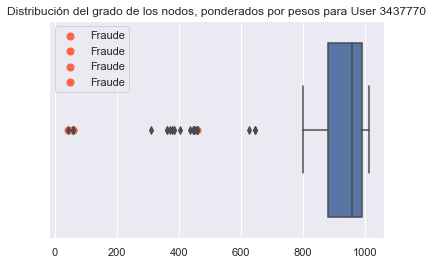



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.19% | Accuracy: 86.99% | Recall: 100.0%  | Precision: 9.52% | F1: 17.38%


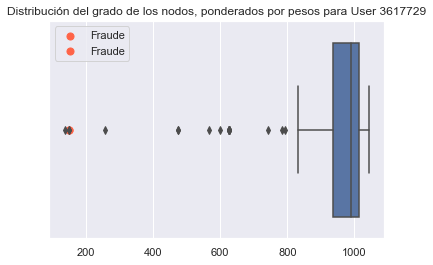



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.5% | Accuracy: 97.62% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


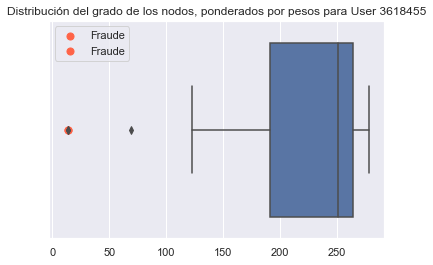



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 12.18% | Accuracy: 87.97% | Recall: 100.0%  | Precision: 9.52% | F1: 17.38%


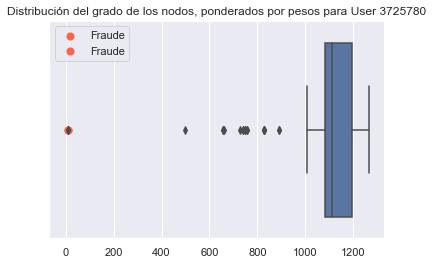



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


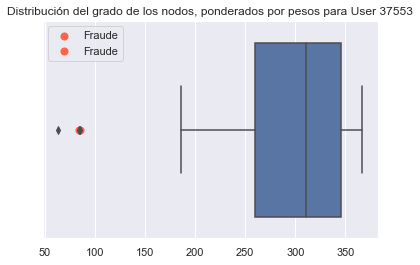



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


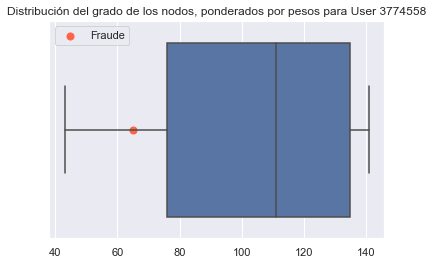



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


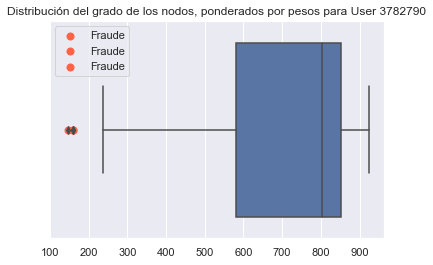



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


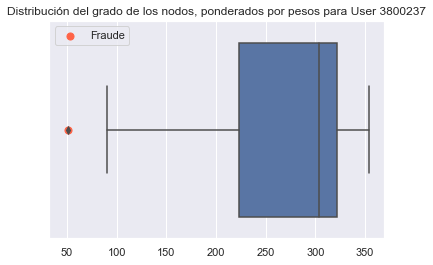



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.65% | Recall: 0.0%  | Precision: X% | F1: X%


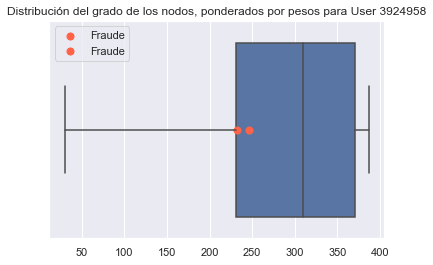



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


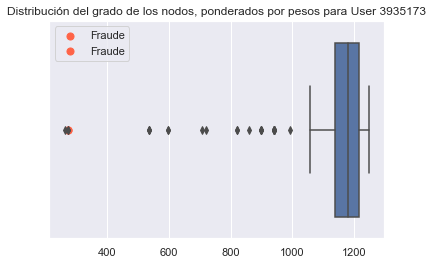



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.11% | Accuracy: 98.92% | Recall: 100.0%  | Precision: 75.0% | F1: 85.71%


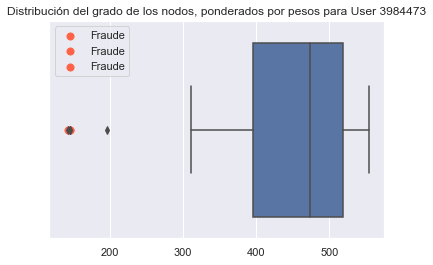



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


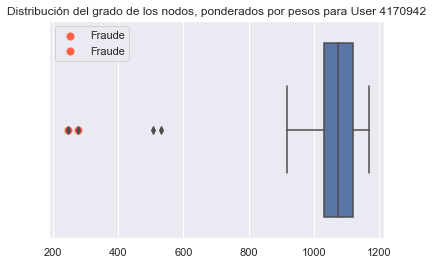



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


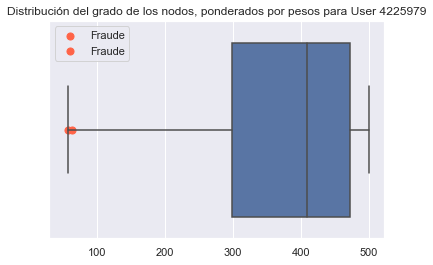



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


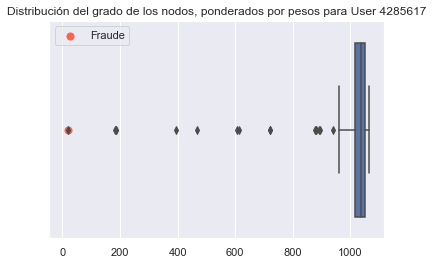



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 4.55% | Accuracy: 80.77% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


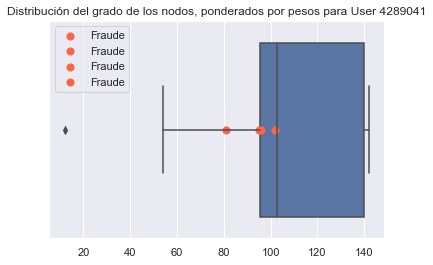



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 1.94% | Accuracy: 98.07% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


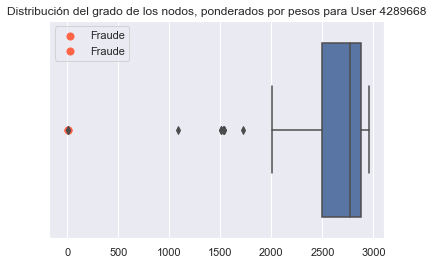



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 15
 - TFP: 7.51% | Accuracy: 92.57% | Recall: 100.0%  | Precision: 13.33% | F1: 23.52%


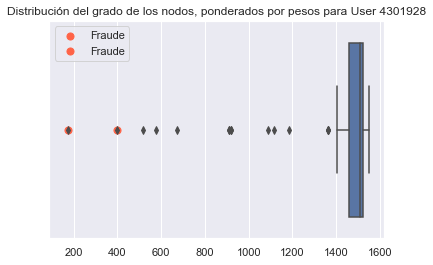



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.25% | Recall: 0.0%  | Precision: X% | F1: X%


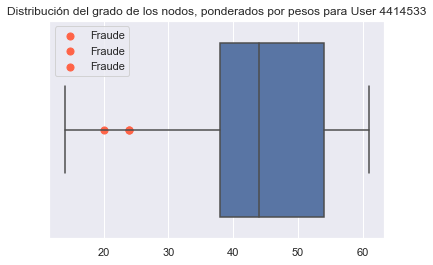



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.92% | Accuracy: 95.11% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


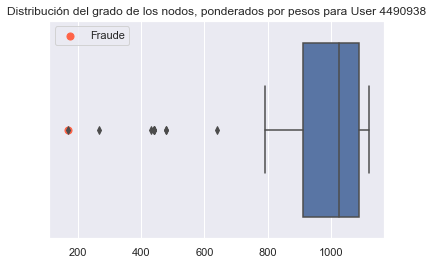



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


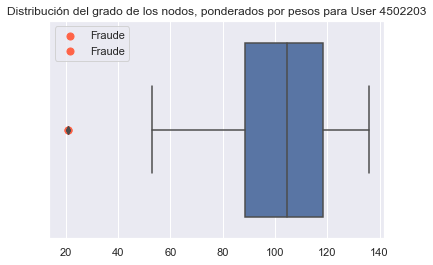



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 15.28% | Accuracy: 84.93% | Recall: 100.0%  | Precision: 8.33% | F1: 15.38%


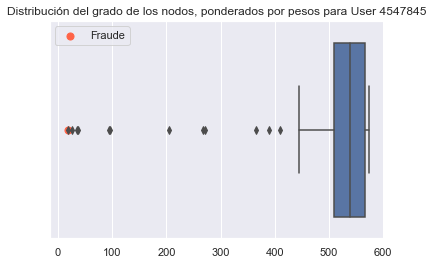



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


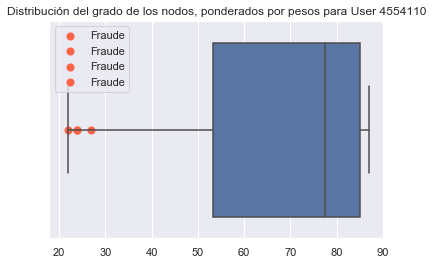



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 13
 - TFP: 6.79% | Accuracy: 93.29% | Recall: 100.0%  | Precision: 15.38% | F1: 26.66%


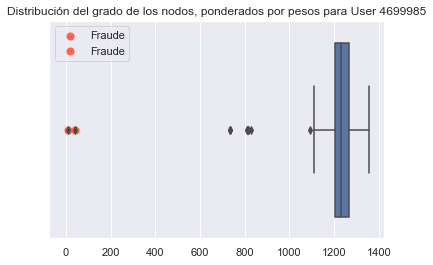



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


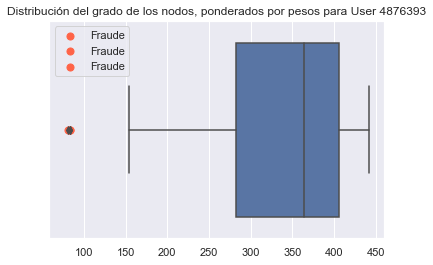



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.67% | Accuracy: 99.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


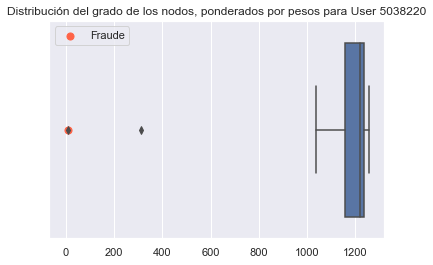



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 8.33% | Accuracy: 92.0% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


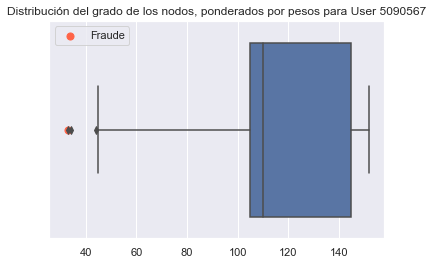



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 13.33% | Accuracy: 88.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


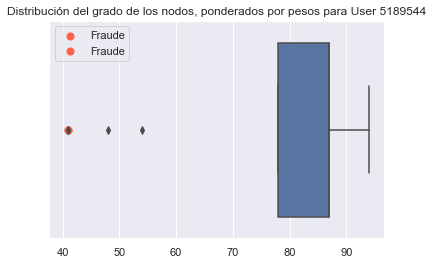



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 5.77% | Accuracy: 94.29% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


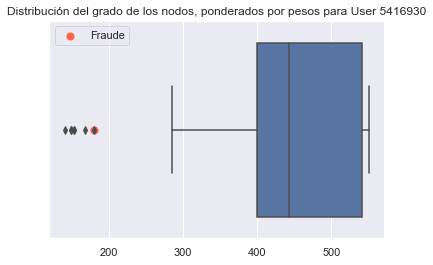



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 6.25% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


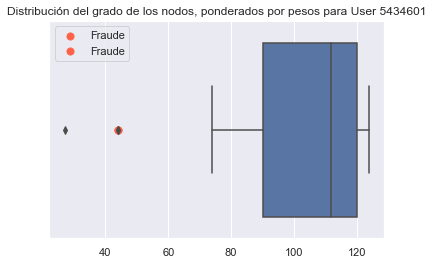



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.22% | Accuracy: 85.0% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


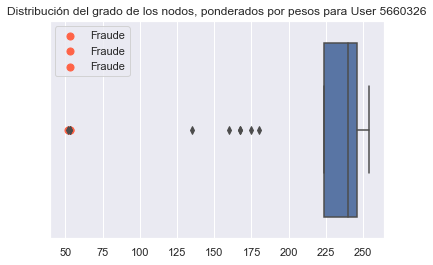



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 4.55% | Accuracy: 95.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


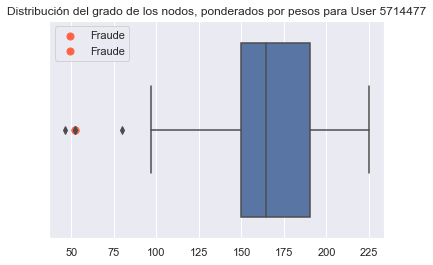



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


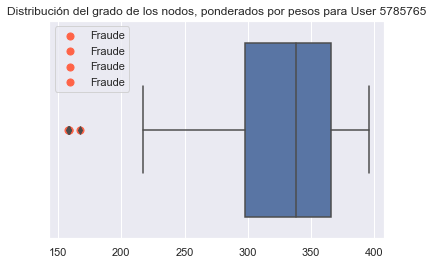



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.47% | Recall: 0.0%  | Precision: X% | F1: X%


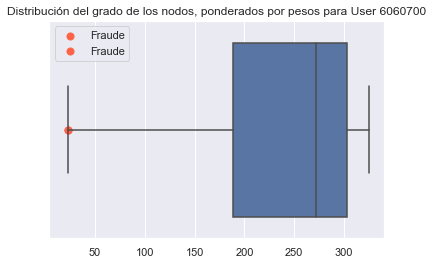



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 14.71% | Accuracy: 85.4% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


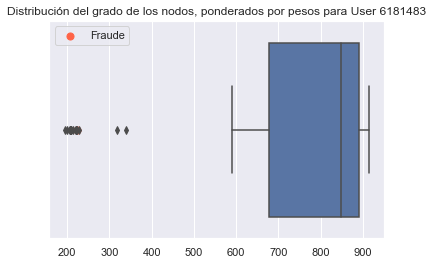



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


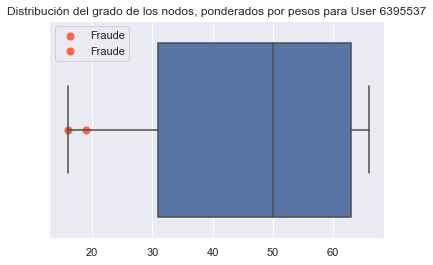



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


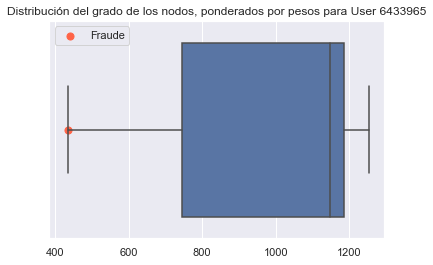



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 6.52% | Accuracy: 93.62% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


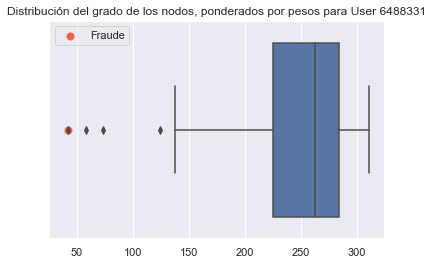



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


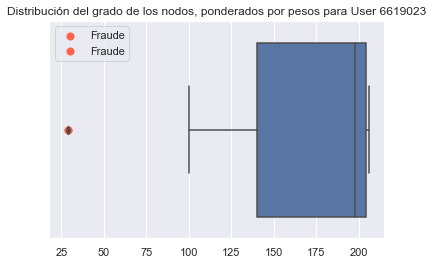



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


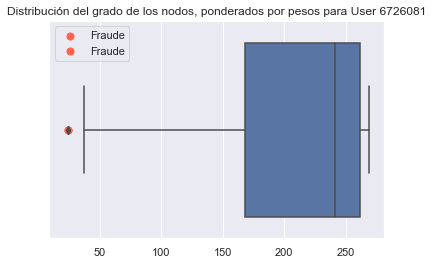



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


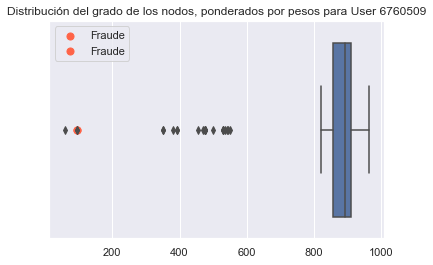



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


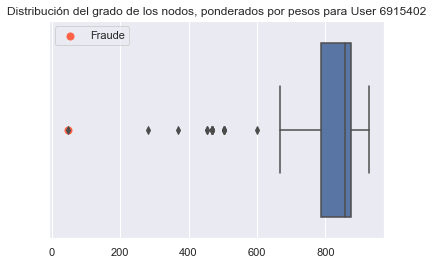



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


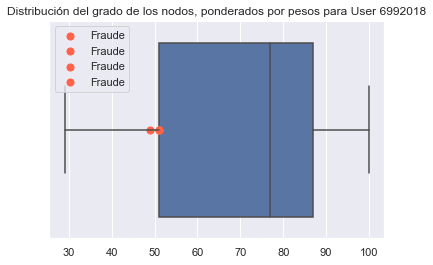



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


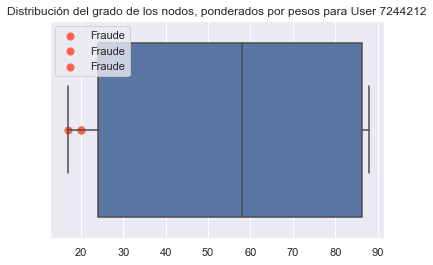



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


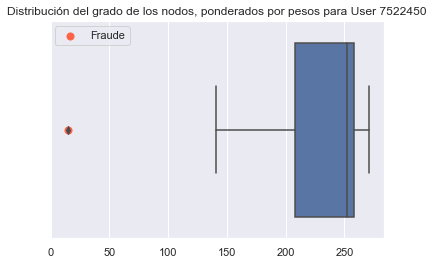



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 10.0% | Accuracy: 90.48% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


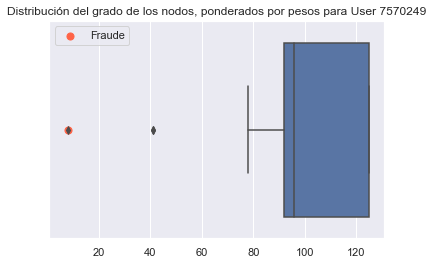



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


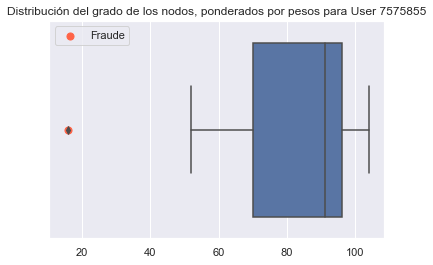



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


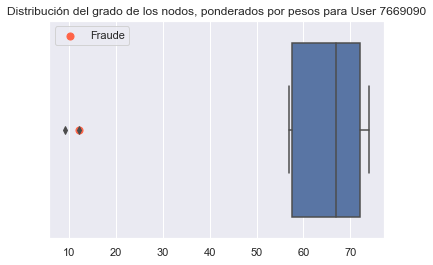



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 5.51% | Accuracy: 93.93% | Fraudes atrapados: 68.8% | Recall Avg: 76.23% | Precision Avg: 46.64%



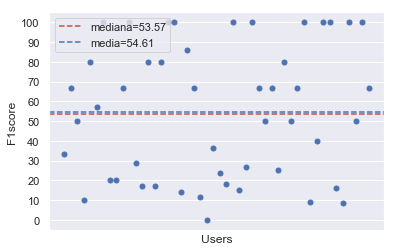

In [27]:
mod_base_8 = run_model(users,vars_for_grafo_8,data)

##### vars_for_grafo_9



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


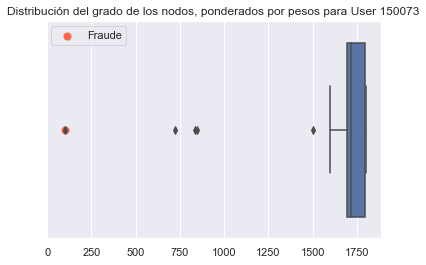



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


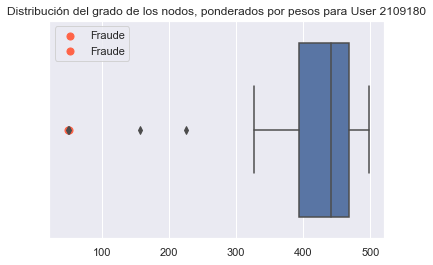



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


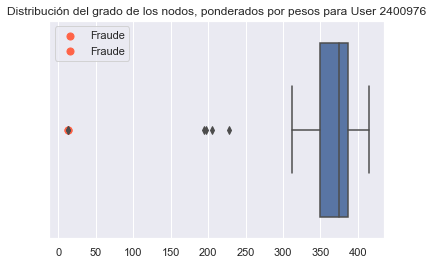



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 15
 - TFP: 8.43% | Accuracy: 91.62% | Recall: 100.0%  | Precision: 6.67% | F1: 12.51%


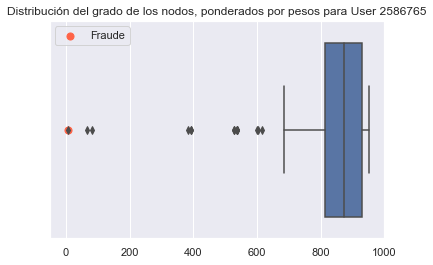



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


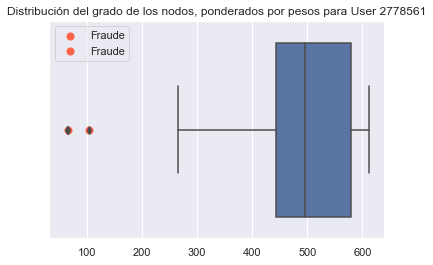



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 3.9% | Accuracy: 96.2% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


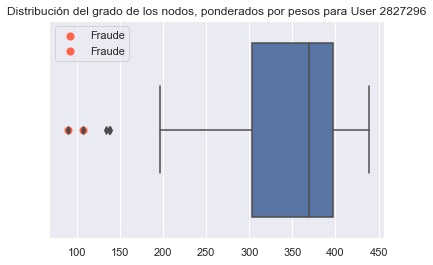



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


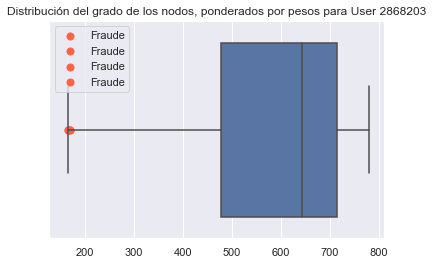



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


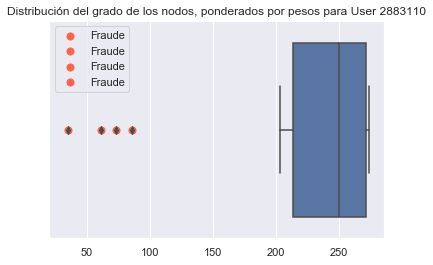



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.52% | Accuracy: 95.57% | Recall: 100.0%  | Precision: 30.0% | F1: 46.15%


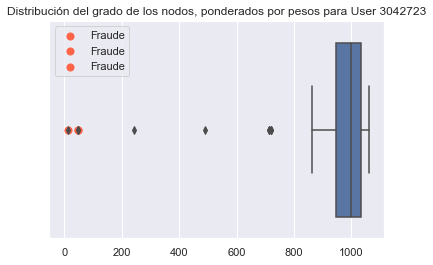



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 13
 - TFP: 8.57% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


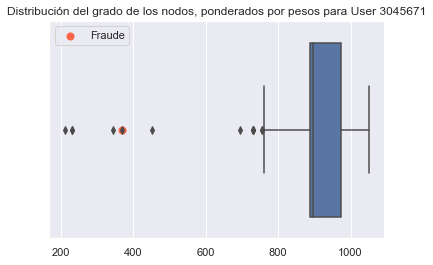



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


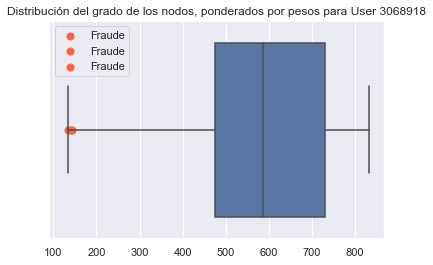



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


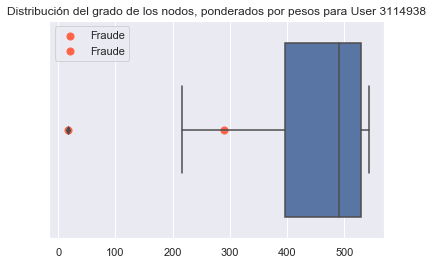



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


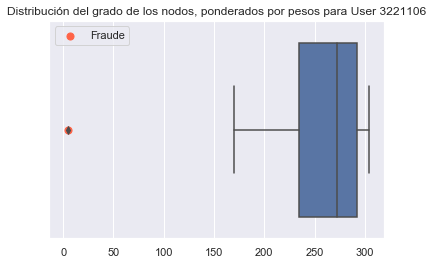



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


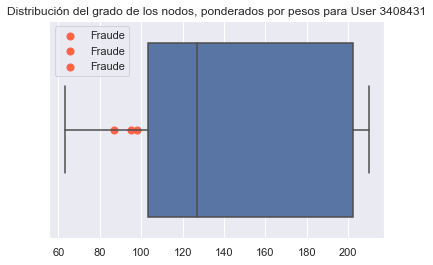



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 24
 - TFP: 14.49% | Accuracy: 85.92% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


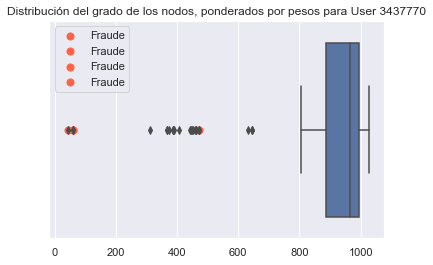



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 14.58% | Accuracy: 85.62% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


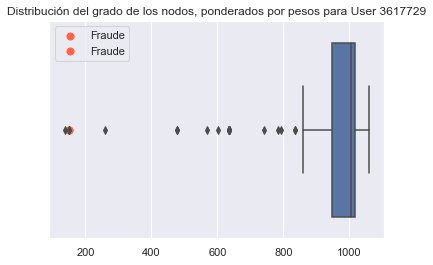



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.5% | Accuracy: 97.62% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


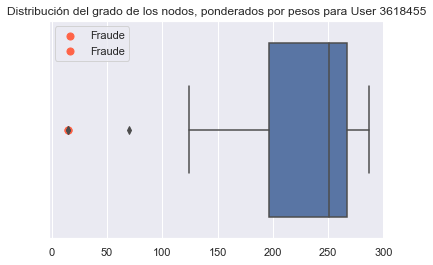



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 14
 - TFP: 7.69% | Accuracy: 92.41% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


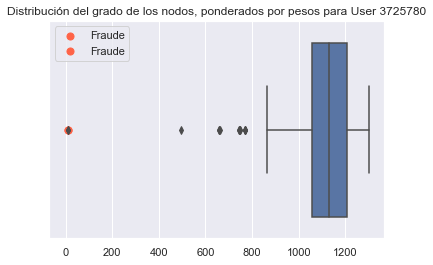



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


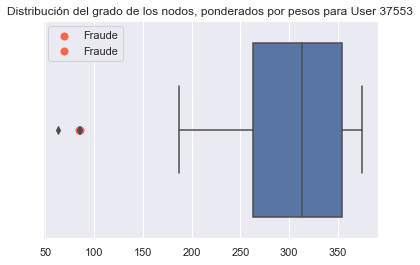



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


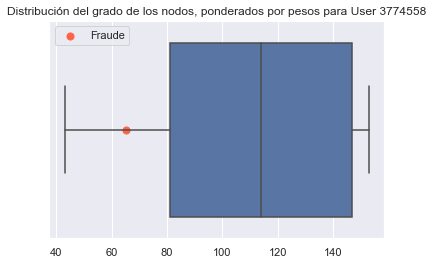



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


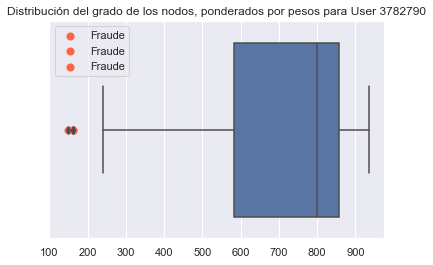



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.65% | Recall: 0.0%  | Precision: X% | F1: X%


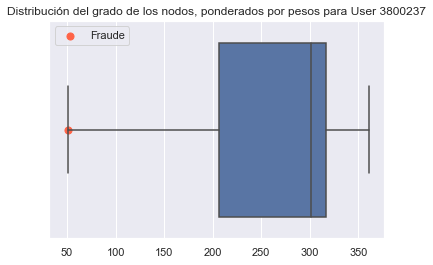



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.65% | Recall: 0.0%  | Precision: X% | F1: X%


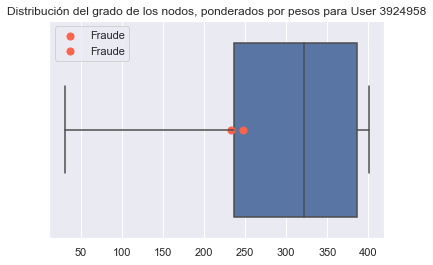



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


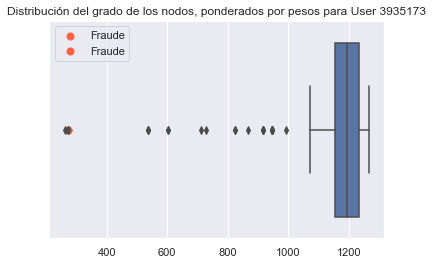



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.11% | Accuracy: 98.92% | Recall: 100.0%  | Precision: 75.0% | F1: 85.71%


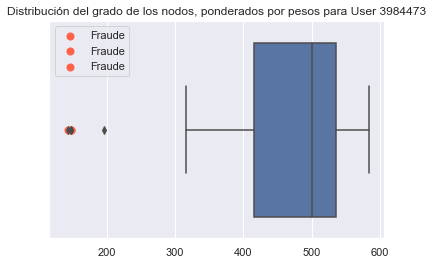



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


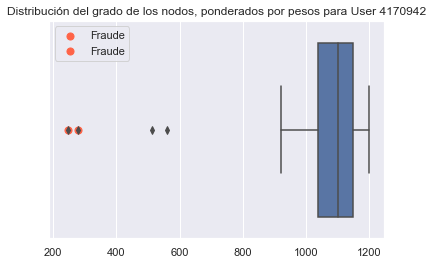



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


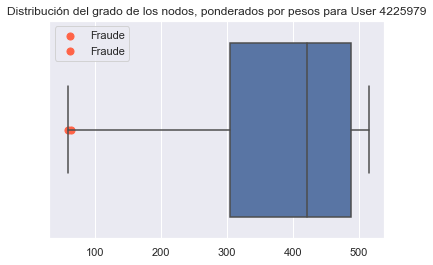



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 24
 - TFP: 18.4% | Accuracy: 81.75% | Recall: 100.0%  | Precision: 4.17% | F1: 8.01%


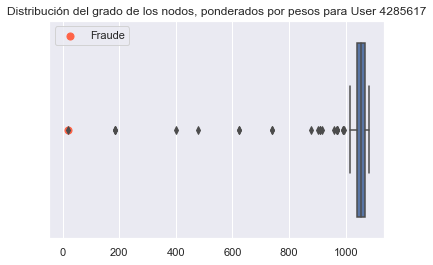



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 4.55% | Accuracy: 80.77% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


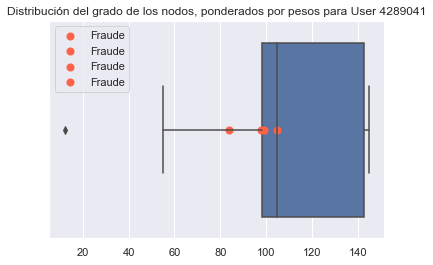



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 1.94% | Accuracy: 98.07% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


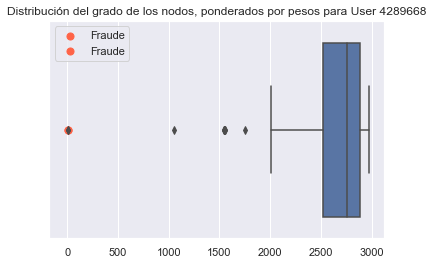



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 15
 - TFP: 7.51% | Accuracy: 92.57% | Recall: 100.0%  | Precision: 13.33% | F1: 23.52%


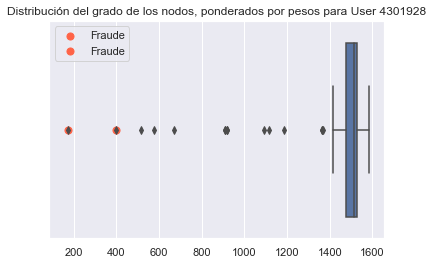



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 7.14% | Accuracy: 76.47% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


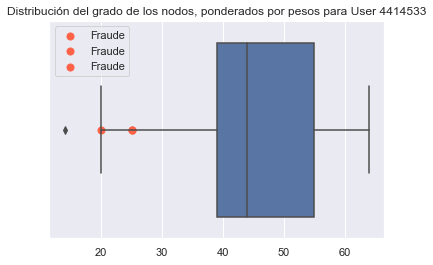



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.92% | Accuracy: 95.11% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


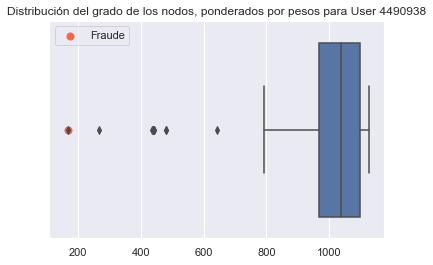



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


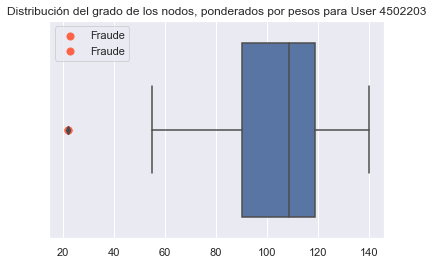



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 15.28% | Accuracy: 84.93% | Recall: 100.0%  | Precision: 8.33% | F1: 15.38%


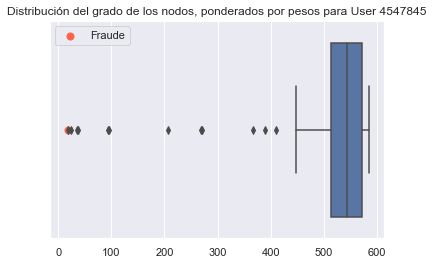



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


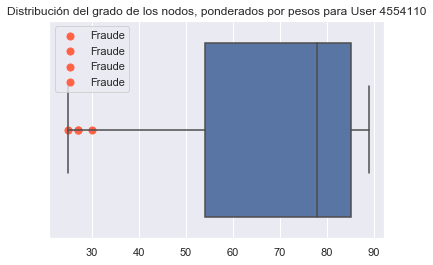



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


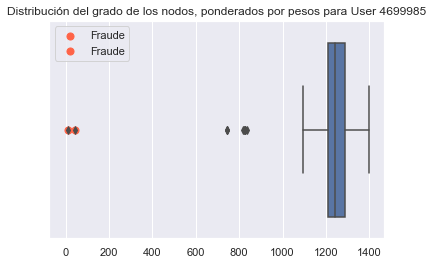



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


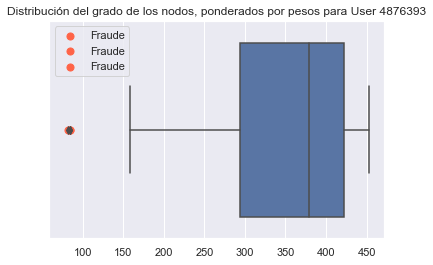



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.36% | Accuracy: 96.67% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


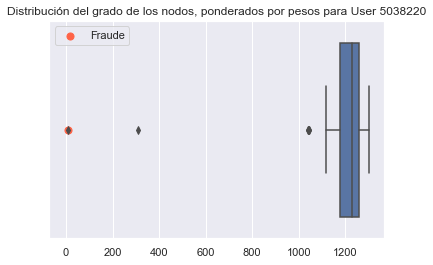



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.3% | Recall: 0.0%  | Precision: X% | F1: X%


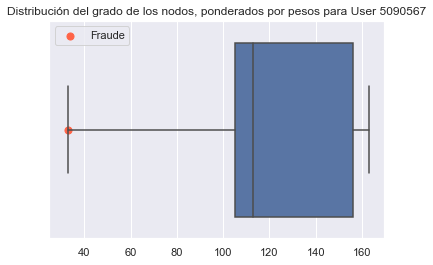



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 13.33% | Accuracy: 88.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


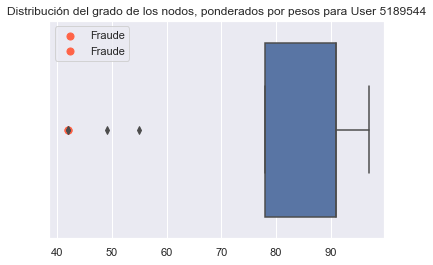



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 5.77% | Accuracy: 94.29% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


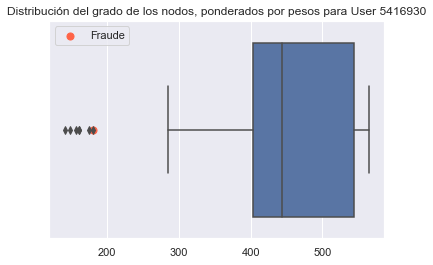



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 6.25% | Accuracy: 83.33% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


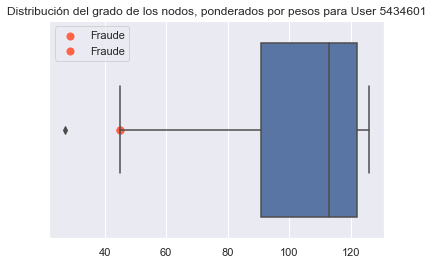



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 10.81% | Accuracy: 90.0% | Recall: 100.0%  | Precision: 42.86% | F1: 60.0%


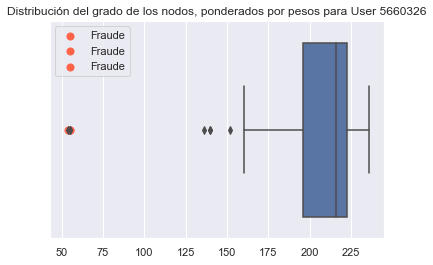



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 4.55% | Accuracy: 95.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


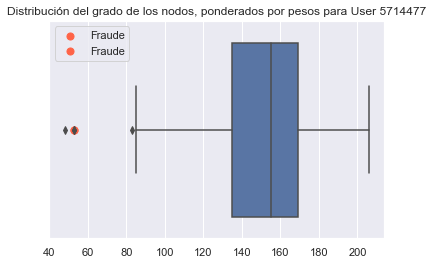



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


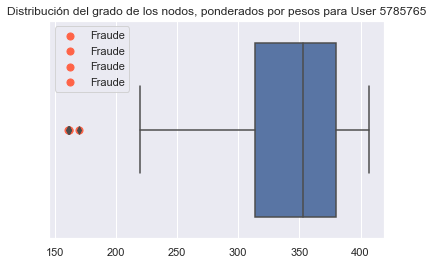



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.47% | Recall: 0.0%  | Precision: X% | F1: X%


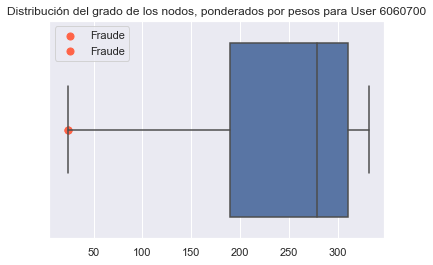



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 14.71% | Accuracy: 85.4% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


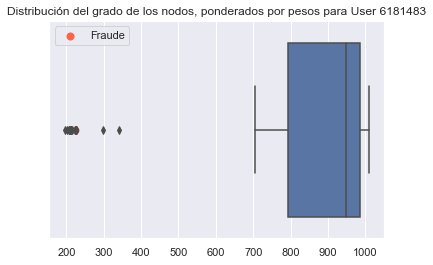



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


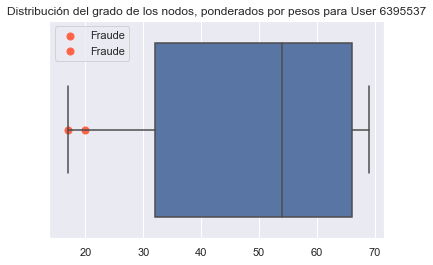



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


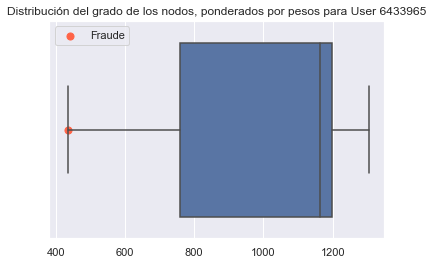



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 6.52% | Accuracy: 93.62% | Recall: 100.0%  | Precision: 25.0% | F1: 40.0%


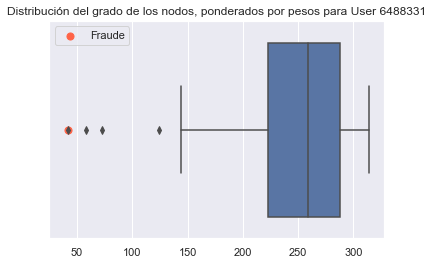



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


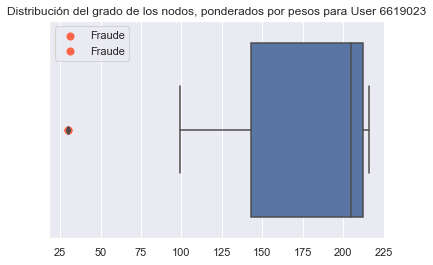



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


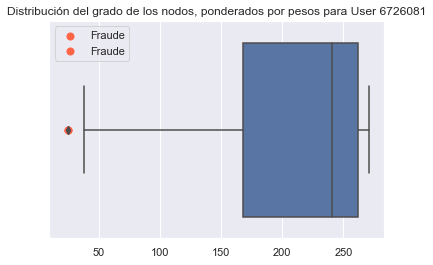



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


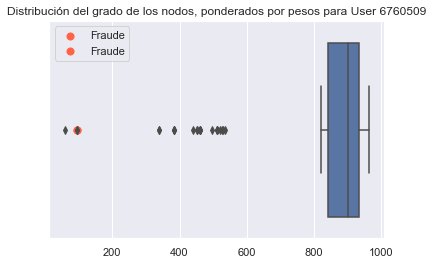



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


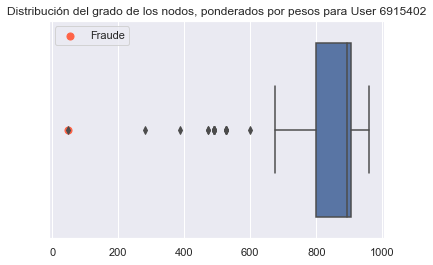



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


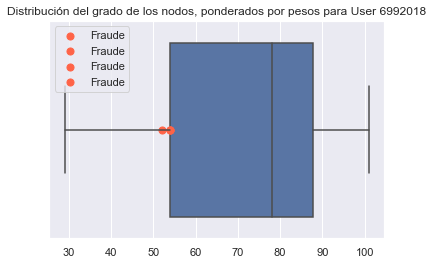



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


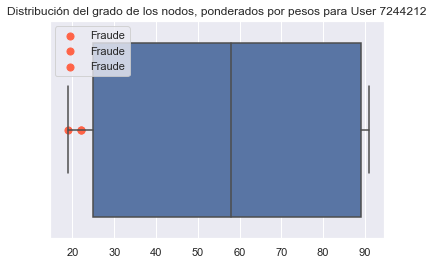



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


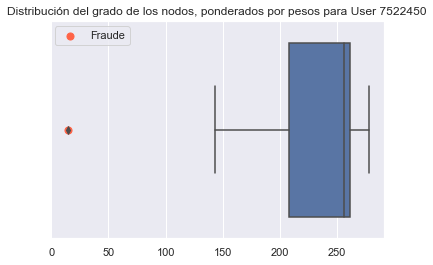



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


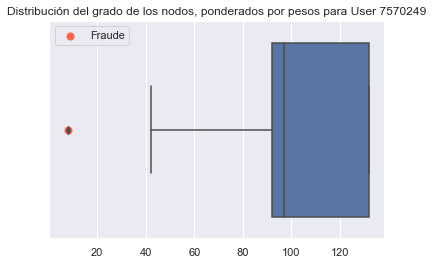



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.83% | Recall: 0.0%  | Precision: X% | F1: X%


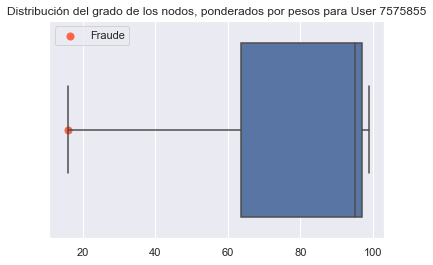



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


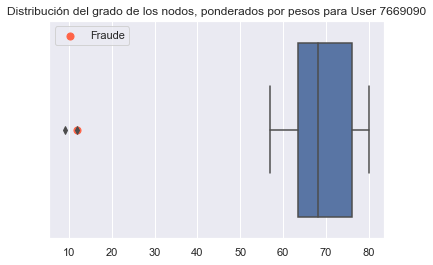



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 5.22% | Accuracy: 94.12% | Fraudes atrapados: 64.8% | Recall Avg: 69.67% | Precision Avg: 43.51%



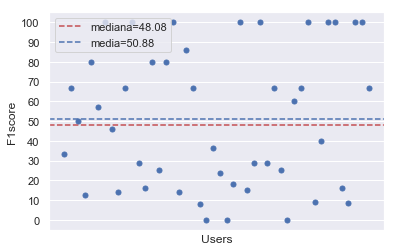

In [28]:
mod_base_9 = run_model(users,vars_for_grafo_9,data)

##### vars_for_grafo_10



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 10.31% | Accuracy: 89.74% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


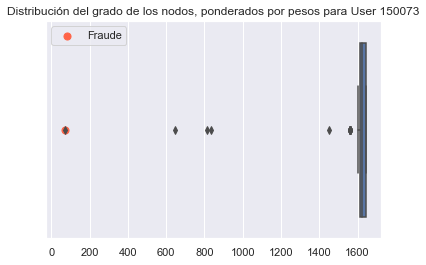



----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


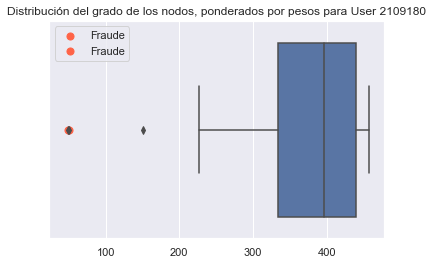



----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


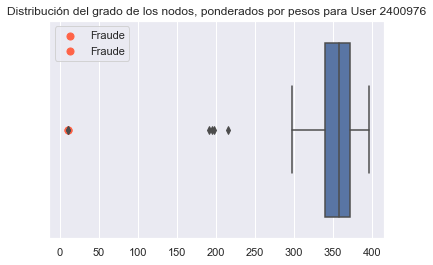



----------------------------------
ANALISIS PARA USUARIO '2586765' :
----------------------------------

Data
 - Cantidad de observaciones        : 167
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 15
 - TFP: 8.43% | Accuracy: 91.62% | Recall: 100.0%  | Precision: 6.67% | F1: 12.51%


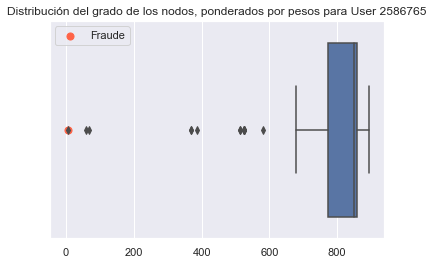



----------------------------------
ANALISIS PARA USUARIO '2778561' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


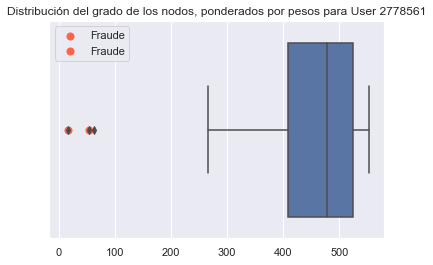



----------------------------------
ANALISIS PARA USUARIO '2827296' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 3.9% | Accuracy: 96.2% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


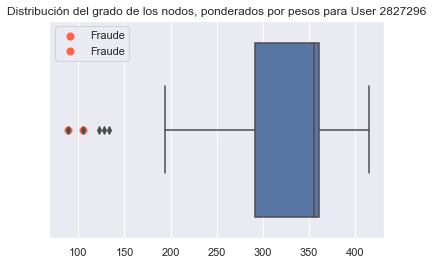



----------------------------------
ANALISIS PARA USUARIO '2868203' :
----------------------------------

Data
 - Cantidad de observaciones        : 138
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.1% | Recall: 0.0%  | Precision: X% | F1: X%


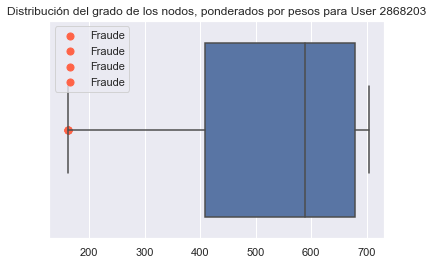



----------------------------------
ANALISIS PARA USUARIO '2883110' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


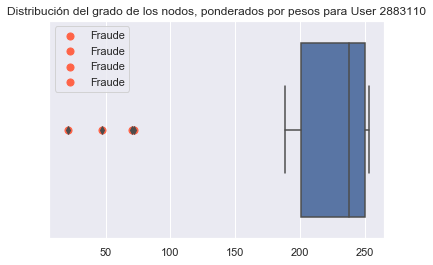



----------------------------------
ANALISIS PARA USUARIO '3042723' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 4.52% | Accuracy: 95.57% | Recall: 100.0%  | Precision: 30.0% | F1: 46.15%


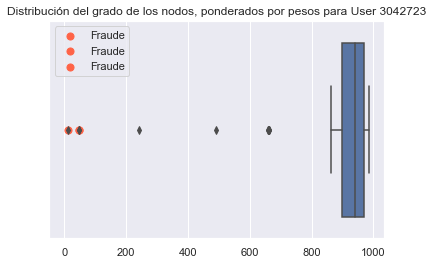



----------------------------------
ANALISIS PARA USUARIO '3045671' :
----------------------------------

Data
 - Cantidad de observaciones        : 141
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.57% | Accuracy: 96.45% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


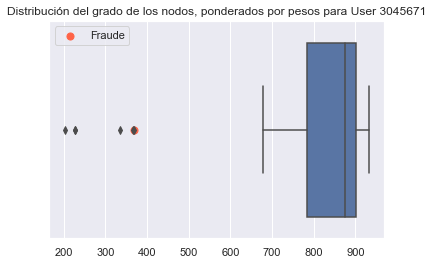



----------------------------------
ANALISIS PARA USUARIO '3068918' :
----------------------------------

Data
 - Cantidad de observaciones        : 161
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 98.14% | Recall: 0.0%  | Precision: X% | F1: X%


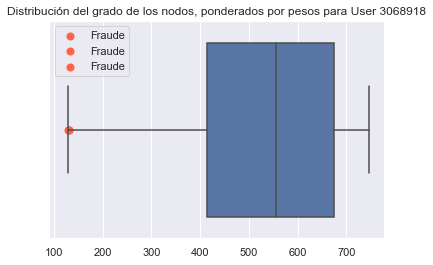



----------------------------------
ANALISIS PARA USUARIO '3114938' :
----------------------------------

Data
 - Cantidad de observaciones        : 83
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.8% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


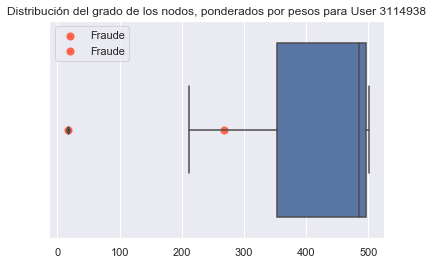



----------------------------------
ANALISIS PARA USUARIO '3221106' :
----------------------------------

Data
 - Cantidad de observaciones        : 41
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 2.5% | Accuracy: 97.56% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


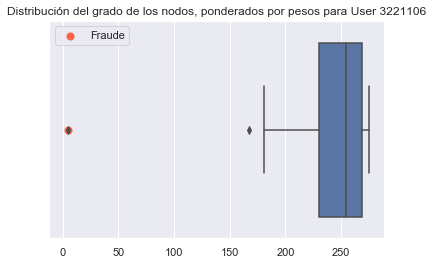



----------------------------------
ANALISIS PARA USUARIO '3408431' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 92.31% | Recall: 0.0%  | Precision: X% | F1: X%


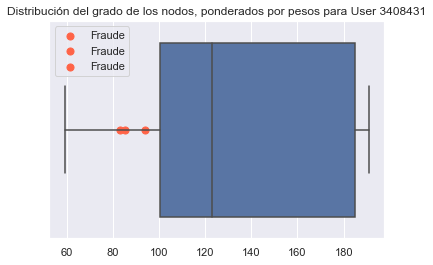



----------------------------------
ANALISIS PARA USUARIO '3437770' :
----------------------------------

Data
 - Cantidad de observaciones        : 142
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 24
 - TFP: 14.49% | Accuracy: 85.92% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


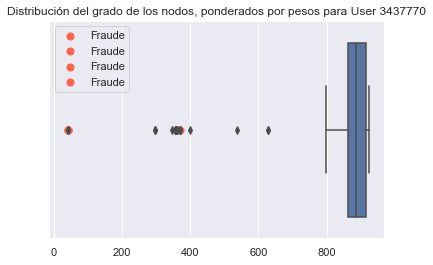



----------------------------------
ANALISIS PARA USUARIO '3617729' :
----------------------------------

Data
 - Cantidad de observaciones        : 146
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.19% | Accuracy: 86.99% | Recall: 100.0%  | Precision: 9.52% | F1: 17.38%


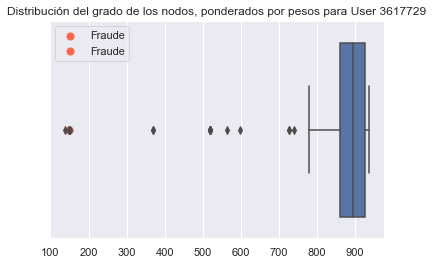



----------------------------------
ANALISIS PARA USUARIO '3618455' :
----------------------------------

Data
 - Cantidad de observaciones        : 42
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 5.0% | Accuracy: 95.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


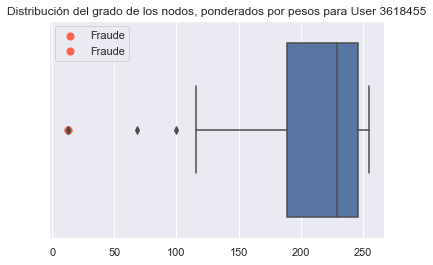



----------------------------------
ANALISIS PARA USUARIO '3725780' :
----------------------------------

Data
 - Cantidad de observaciones        : 158
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 5.77% | Accuracy: 94.3% | Recall: 100.0%  | Precision: 18.18% | F1: 30.77%


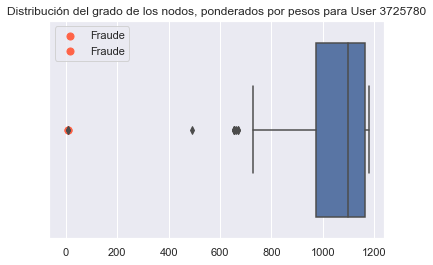



----------------------------------
ANALISIS PARA USUARIO '37553' :
----------------------------------

Data
 - Cantidad de observaciones        : 63
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.64% | Accuracy: 98.41% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


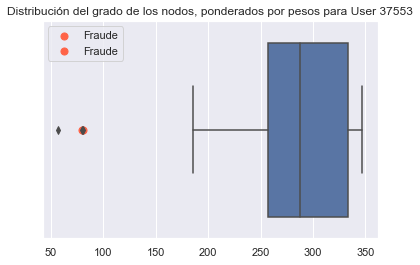



----------------------------------
ANALISIS PARA USUARIO '3774558' :
----------------------------------

Data
 - Cantidad de observaciones        : 29
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 96.55% | Recall: 0.0%  | Precision: X% | F1: X%


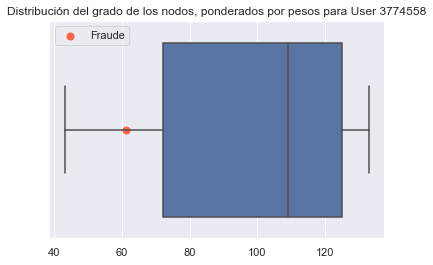



----------------------------------
ANALISIS PARA USUARIO '3782790' :
----------------------------------

Data
 - Cantidad de observaciones        : 176
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


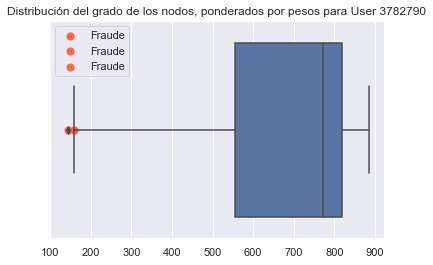



----------------------------------
ANALISIS PARA USUARIO '3800237' :
----------------------------------

Data
 - Cantidad de observaciones        : 74
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


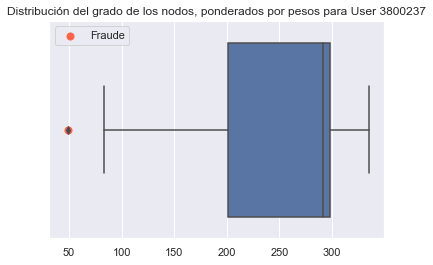



----------------------------------
ANALISIS PARA USUARIO '3924958' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.65% | Recall: 0.0%  | Precision: X% | F1: X%


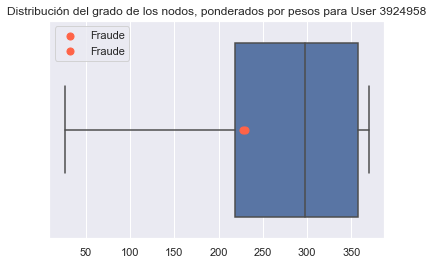



----------------------------------
ANALISIS PARA USUARIO '3935173' :
----------------------------------

Data
 - Cantidad de observaciones        : 190
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 26
 - TFP: 12.77% | Accuracy: 87.37% | Recall: 100.0%  | Precision: 7.69% | F1: 14.28%


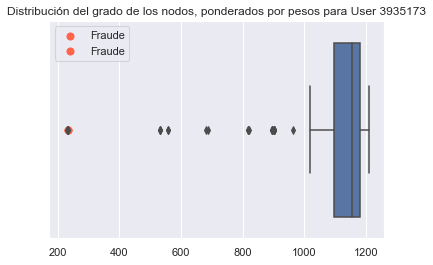



----------------------------------
ANALISIS PARA USUARIO '3984473' :
----------------------------------

Data
 - Cantidad de observaciones        : 93
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


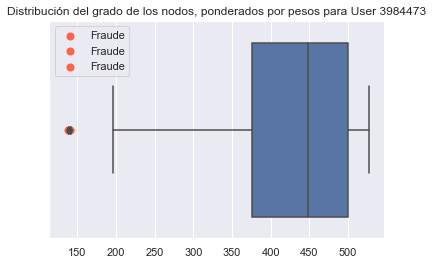



----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 3.87% | Accuracy: 96.17% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


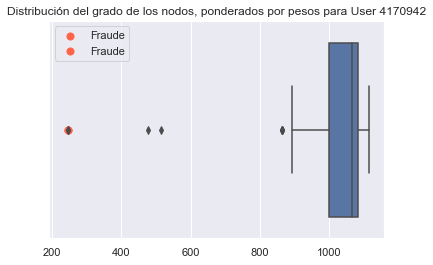



----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


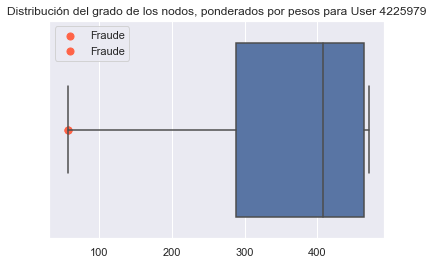



----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


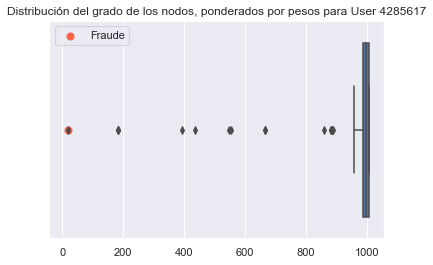



----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 4.55% | Accuracy: 80.77% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


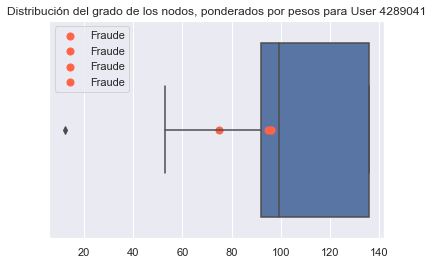



----------------------------------
ANALISIS PARA USUARIO '4289668' :
----------------------------------

Data
 - Cantidad de observaciones        : 362
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 1.94% | Accuracy: 98.07% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


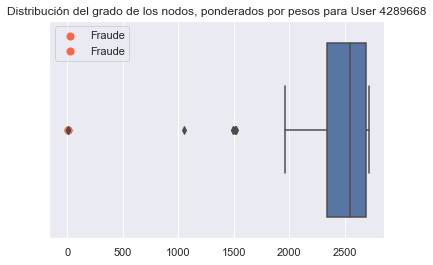



----------------------------------
ANALISIS PARA USUARIO '4301928' :
----------------------------------

Data
 - Cantidad de observaciones        : 175
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 24
 - TFP: 12.72% | Accuracy: 87.43% | Recall: 100.0%  | Precision: 8.33% | F1: 15.38%


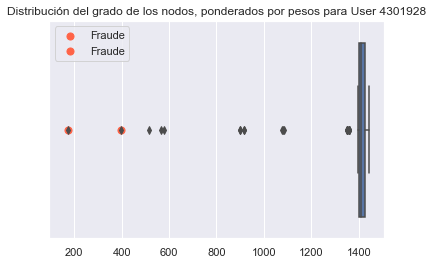



----------------------------------
ANALISIS PARA USUARIO '4414533' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 82.35% | Recall: 0.0%  | Precision: X% | F1: X%


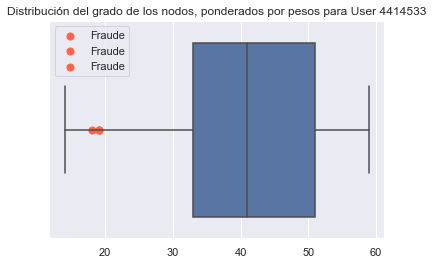



----------------------------------
ANALISIS PARA USUARIO '4490938' :
----------------------------------

Data
 - Cantidad de observaciones        : 184
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 4.37% | Accuracy: 95.65% | Recall: 100.0%  | Precision: 11.11% | F1: 20.0%


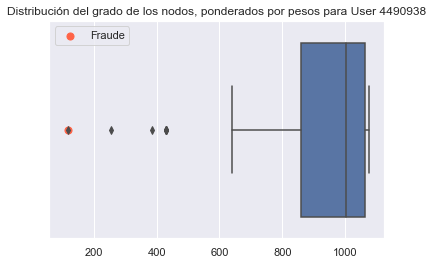



----------------------------------
ANALISIS PARA USUARIO '4502203' :
----------------------------------

Data
 - Cantidad de observaciones        : 28
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


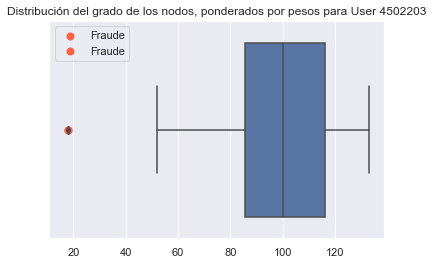



----------------------------------
ANALISIS PARA USUARIO '4547845' :
----------------------------------

Data
 - Cantidad de observaciones        : 73
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 11
 - TFP: 13.89% | Accuracy: 86.3% | Recall: 100.0%  | Precision: 9.09% | F1: 16.67%


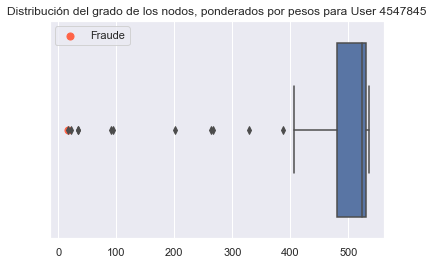



----------------------------------
ANALISIS PARA USUARIO '4554110' :
----------------------------------

Data
 - Cantidad de observaciones        : 16
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 75.0% | Recall: 0.0%  | Precision: X% | F1: X%


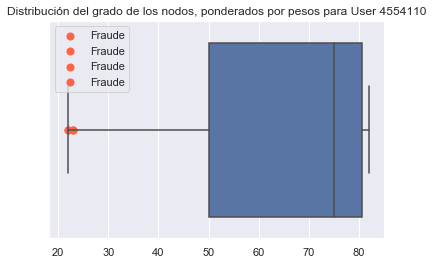



----------------------------------
ANALISIS PARA USUARIO '4699985' :
----------------------------------

Data
 - Cantidad de observaciones        : 164
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 6.17% | Accuracy: 93.9% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


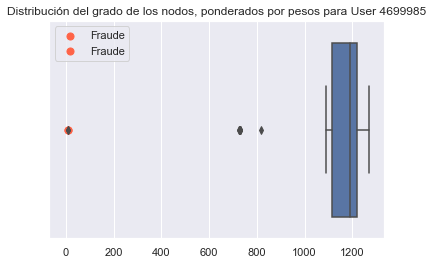



----------------------------------
ANALISIS PARA USUARIO '4876393' :
----------------------------------

Data
 - Cantidad de observaciones        : 91
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


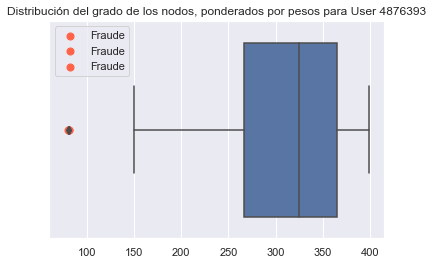



----------------------------------
ANALISIS PARA USUARIO '5038220' :
----------------------------------

Data
 - Cantidad de observaciones        : 150
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 18
 - TFP: 11.41% | Accuracy: 88.67% | Recall: 100.0%  | Precision: 5.56% | F1: 10.53%


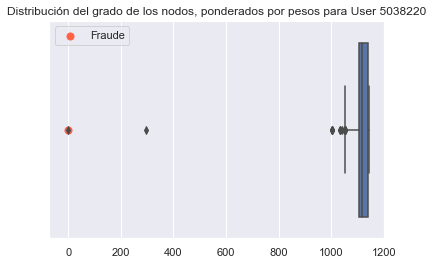



----------------------------------
ANALISIS PARA USUARIO '5090567' :
----------------------------------

Data
 - Cantidad de observaciones        : 27
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 15.38% | Accuracy: 85.19% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


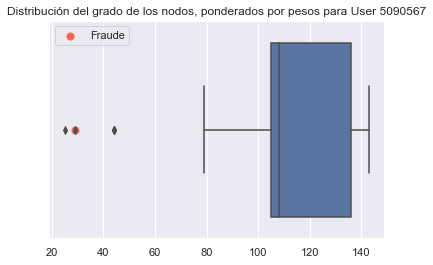



----------------------------------
ANALISIS PARA USUARIO '5189544' :
----------------------------------

Data
 - Cantidad de observaciones        : 17
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 13.33% | Accuracy: 88.24% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


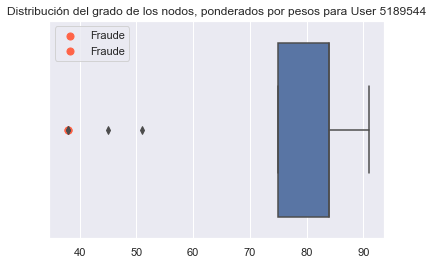



----------------------------------
ANALISIS PARA USUARIO '5416930' :
----------------------------------

Data
 - Cantidad de observaciones        : 105
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 7
 - TFP: 5.77% | Accuracy: 94.29% | Recall: 100.0%  | Precision: 14.29% | F1: 25.01%


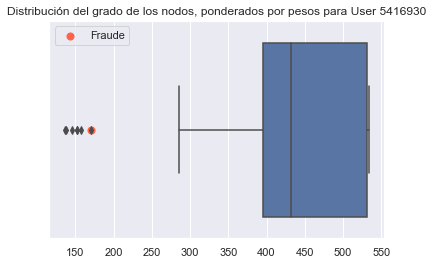



----------------------------------
ANALISIS PARA USUARIO '5434601' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 6.25% | Accuracy: 83.33% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


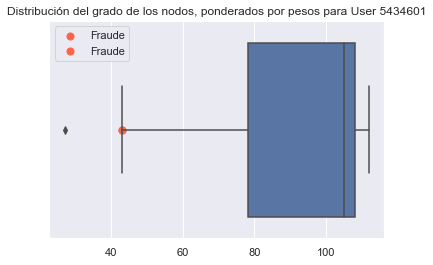



----------------------------------
ANALISIS PARA USUARIO '5660326' :
----------------------------------

Data
 - Cantidad de observaciones        : 40
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 13.51% | Accuracy: 87.5% | Recall: 100.0%  | Precision: 37.5% | F1: 54.55%


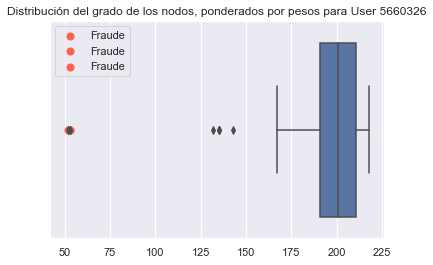



----------------------------------
ANALISIS PARA USUARIO '5714477' :
----------------------------------

Data
 - Cantidad de observaciones        : 46
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.27% | Accuracy: 97.83% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


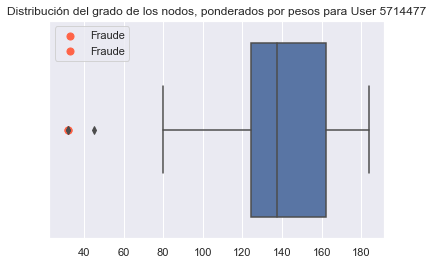



----------------------------------
ANALISIS PARA USUARIO '5785765' :
----------------------------------

Data
 - Cantidad de observaciones        : 95
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


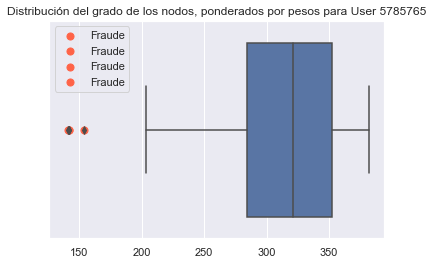



----------------------------------
ANALISIS PARA USUARIO '6060700' :
----------------------------------

Data
 - Cantidad de observaciones        : 79
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


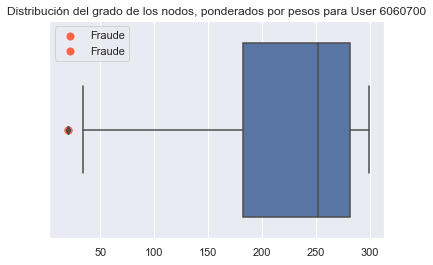



----------------------------------
ANALISIS PARA USUARIO '6181483' :
----------------------------------

Data
 - Cantidad de observaciones        : 137
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 14.71% | Accuracy: 85.4% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


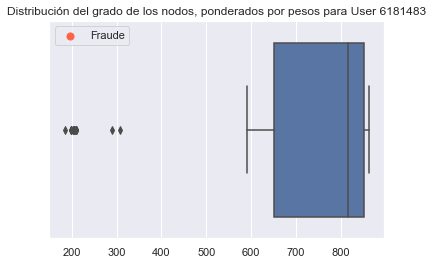



----------------------------------
ANALISIS PARA USUARIO '6395537' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 86.67% | Recall: 0.0%  | Precision: X% | F1: X%


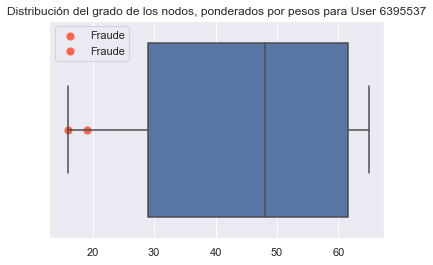



----------------------------------
ANALISIS PARA USUARIO '6433965' :
----------------------------------

Data
 - Cantidad de observaciones        : 185
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


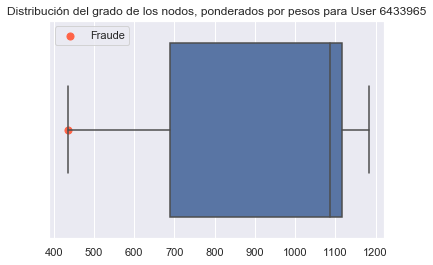



----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


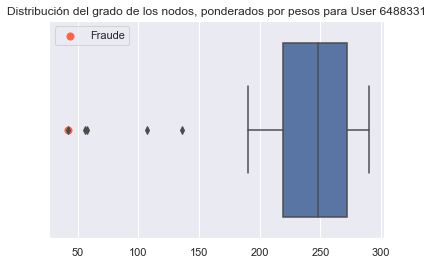



----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.74% | Recall: 0.0%  | Precision: X% | F1: X%


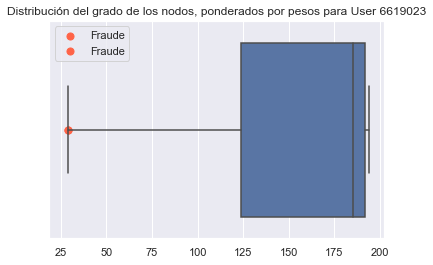



----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 4.65% | Accuracy: 95.56% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


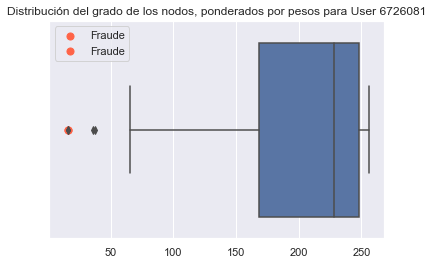



----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


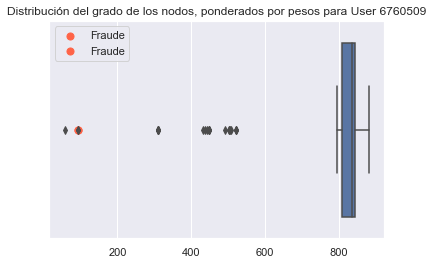



----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 35
 - TFP: 23.78% | Accuracy: 76.39% | Recall: 100.0%  | Precision: 2.86% | F1: 5.56%


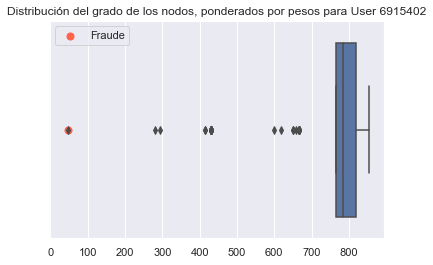



----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


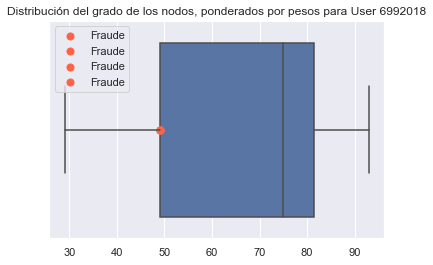



----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 83.33% | Recall: 0.0%  | Precision: X% | F1: X%


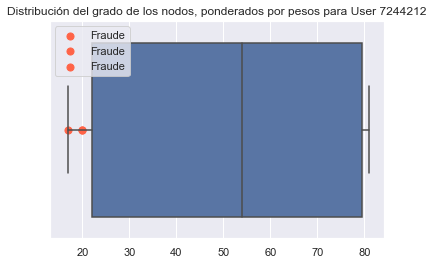



----------------------------------
ANALISIS PARA USUARIO '7522450' :
----------------------------------

Data
 - Cantidad de observaciones        : 39
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


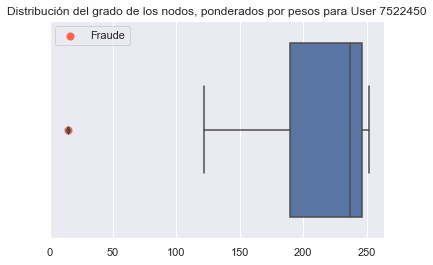



----------------------------------
ANALISIS PARA USUARIO '7570249' :
----------------------------------

Data
 - Cantidad de observaciones        : 21
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


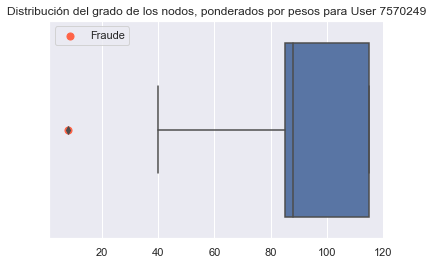



----------------------------------
ANALISIS PARA USUARIO '7575855' :
----------------------------------

Data
 - Cantidad de observaciones        : 24
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


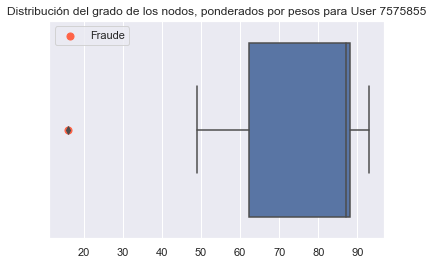



----------------------------------
ANALISIS PARA USUARIO '7669090' :
----------------------------------

Data
 - Cantidad de observaciones        : 15
 - Cantidad de observaciones fraude : 1

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 7.14% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


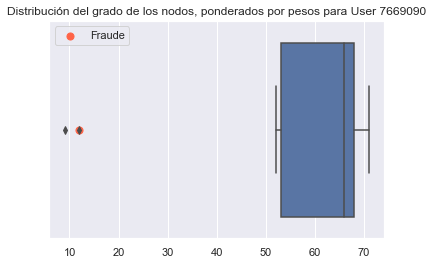



*******************************
 METRICAS GLOBALES DEL MODELO :
*******************************
FP Global: 5.92% | Accuracy: 93.49% | Fraudes atrapados: 66.67% | Recall Avg: 74.59% | Precision Avg: 43.95%



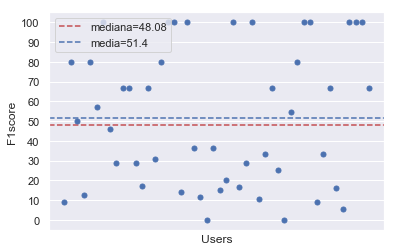

In [29]:
mod_base_10 = run_model(users,vars_for_grafo_10,data)

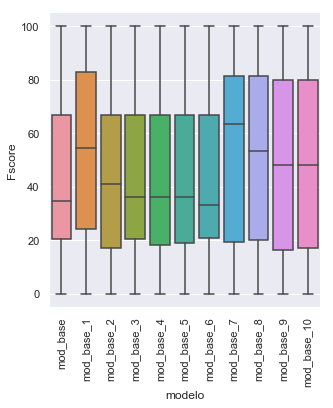

In [30]:
# grafico de comparacion entre los modelos base

df_prueba = pd.DataFrame(list(mod_base.items()),columns = ['users','Fscore'])
df_prueba['modelo'] = "mod_base"

df_prueba_1 = pd.DataFrame(list(mod_base_1.items()),columns = ['users','Fscore'])
df_prueba_1['modelo'] = "mod_base_1"
df_prueba = df_prueba.append(df_prueba_1)

df_prueba_2 = pd.DataFrame(list(mod_base_2.items()),columns = ['users','Fscore'])
df_prueba_2['modelo'] = "mod_base_2"
df_prueba = df_prueba.append(df_prueba_2)

df_prueba_3 = pd.DataFrame(list(mod_base_3.items()),columns = ['users','Fscore'])
df_prueba_3['modelo'] = "mod_base_3"
df_prueba = df_prueba.append(df_prueba_3)

df_prueba_4 = pd.DataFrame(list(mod_base_4.items()),columns = ['users','Fscore'])
df_prueba_4['modelo'] = "mod_base_4"
df_prueba = df_prueba.append(df_prueba_4)

df_prueba_5 = pd.DataFrame(list(mod_base_5.items()),columns = ['users','Fscore'])
df_prueba_5['modelo'] = "mod_base_5"
df_prueba = df_prueba.append(df_prueba_5)

df_prueba_6 = pd.DataFrame(list(mod_base_6.items()),columns = ['users','Fscore'])
df_prueba_6['modelo'] = "mod_base_6"
df_prueba = df_prueba.append(df_prueba_6)

df_prueba_7 = pd.DataFrame(list(mod_base_7.items()),columns = ['users','Fscore'])
df_prueba_7['modelo'] = "mod_base_7"
df_prueba = df_prueba.append(df_prueba_7)

df_prueba_8 = pd.DataFrame(list(mod_base_8.items()),columns = ['users','Fscore'])
df_prueba_8['modelo'] = "mod_base_8"
df_prueba = df_prueba.append(df_prueba_8)


df_prueba_9 = pd.DataFrame(list(mod_base_9.items()),columns = ['users','Fscore'])
df_prueba_9['modelo'] = "mod_base_9"
df_prueba = df_prueba.append(df_prueba_9)

df_prueba_10 = pd.DataFrame(list(mod_base_10.items()),columns = ['users','Fscore'])
df_prueba_10['modelo'] = "mod_base_10"
df_prueba = df_prueba.append(df_prueba_10)


sns.catplot(x="modelo", y="Fscore", kind="box",data=df_prueba)
plt.xticks(rotation=90)
plt.show()

#### 3.2. Analisis de cosas diferentes

##### A) Modelos con peso en variable "user_caract"
    Es posible que convenga "user_caract" ponerle una ponderación mayor ya que indican con más fuerza que estamos en presencia de la misma persona. 
    Esto ayuda con el falso positivo.
    Quiero que el peso asociado a los ejes con estas variables, sea mayor
    
    
    mod_i_ponder_j : "i" es el vars_for_grafo_i y "j" es la ponderacion que use
    
    Se pueba para las combinaciones de variables que tienen la variable "user_caract":
    vars_for_grafo_1, 
    vars_for_grafo_3, 
    vars_for_grafo_4, 
    vars_for_grafo_5, 
    vars_for_grafo_7, 
    vars_for_grafo_8, 
    vars_for_grafo_9, 
    vars_for_grafo_10
    

In [31]:
def carga_ejes_con_peso(nodos_dataset,red,vars_ponderadas=1):
    print("Variables ponderadas")
    # Esta función toma el data set preparado (nodos_dataset), prepara la info de los ejes correspondientes y los carga a la red
    
    # El método que uso para crear los ejes con peso es el siguiente:    
    # Creo un diccionario donde las "Key" serán las tuplas de nodos que comparten valor, que será un eje
    # los "values" serán la cantidad de variables para las que ambos nodos comparten valor, que será el peso del eje
    
    dict_tuplas = dict() # este es el diccionario auxiliar para cargar los ejes con pesos
    
    variables = list(nodos_dataset.columns[3:]) 
    # recorro todas las variables
    for variable in variables:
        if (variable == 'navegador_caract' or variable == 'user_caract'):
            ponder = vars_ponderadas
        else:
            ponder = 1

        #    saco los valores unicos para la variable en cuestion, genero una lista
        values = list(np.unique(nodos_dataset[variable].values))
        
         
        for value in values:
            # genero la lista de nodos que comparten un mismo valor para la variable en cuestion
            list_nodos = list(nodos_dataset[nodos_dataset[variable] == value]['Label'].values)
            # genero todas las combinaciones de valores en un la lista list_nodos, para luego cargar los ejes 
            if len(list_nodos) > 1:
                combinations = set(itertools.combinations(list_nodos, 2))
                list_edges = list(combinations) # es una lista de tuplas que comparten nodo
                # ahora tengo que ver si las tuplas que guarde en list_edges ya existen en el diccionario dict_tuplas
                for tupla in list_edges:
                    if tupla in dict_tuplas:
                        dict_tuplas[tupla] = ((dict_tuplas[tupla] + 1)*ponder)
                    else:
                        dict_tuplas[tupla] = (1 * ponder)
                            
                            
    #########################################################################################
    

    # Cargo los ejes
    red.add_edges_from(list(dict_tuplas.keys()))

    # Cargo los respectivos pesos
    for tupla in red.edges():
        red.edges[(tupla)]["weight"]=dict_tuplas[tupla]            
    


In [32]:
def carga_grapho(user_id,vars_for_grafo,raw_dataset,vars_ponderadas=1):
    # Esta función toma el dataset original, llama a las funciones anteriores para el armado de los datos y calculos aux. 
    # Guarda el grapho para el user correspondiente.
    # Devuelve la red

    # 1. creo el grapho 
    red = nx.Graph()

    # 2. preparo la data
    nodos_dataset = data_for_grapho(vars_for_grafo,user_id,raw_dataset)

    # 3. realizo la carga de nodos con su respectivo atributo 'Label'
    carga_nodos(nodos_dataset,red)

    # 4. realizo la carga los ejes con peso (atributo "weight")
    carga_ejes_con_peso(nodos_dataset,red,vars_ponderadas)

    # 5. guardo el grapho con el user en el nombre, en una carpeta llamada Graphos_outliers
    name = "red_{}".format(user_id)
    if not os.path.exists('Output_Outliers'):
        os.makedirs('Output_Outliers')
    Path = os.getcwd()+'\\Output_Outliers\\'
    nx.write_gml(red, str(Path)+str(name)+'.gml')
    
    # 6. metricas del grapho: Grado promedio red, grado promedio nodos fraude, grado promedio nodos no fraude
    #    Es una lista de len 3 con las tres métricas
    metrics = metricas_grapho(red)
    
    
    # 7. obtengo la matriz de confusion: Usando el grado ponderado para detectar outliers, predigo fraudes y en función de eso 
    #    armo la matriz de confusion
    conf_matr = get_conf_matrix(red)
    
    # Ademas, creo un diccionario donde la key es el id_usuario y el value es una tupla con las métricas. Luego lo usaré para aprox
    # la performance global.
    user_conf_matr = dict()
    user_conf_matr[user_id] = conf_matr
    

    
    return user_conf_matr, red

In [33]:
def run_model(list_users,vars_for_model,data,vars_ponderadas=1):
    global_metrics = dict()
    FP_global = 0
    TP_global = 0
    TN_global = 0
    FN_global = 0
    Recall_prom = dict()
    Precision_prom = dict()
    F1 = dict()


    for user in list_users:
        conf_matrix, red = carga_grapho(user,vars_for_model,data,vars_ponderadas)
        global_metrics.update(conf_matrix)
        FP_global += conf_matrix[user][0]
        TP_global += conf_matrix[user][1]
        TN_global += conf_matrix[user][2]
        FN_global += conf_matrix[user][3]
        if conf_matrix[user][4] != 'X':
            F1[user]   = conf_matrix[user][4]
        if conf_matrix[user][5] != 'X':
            Recall_prom[user]   = conf_matrix[user][5]
        if conf_matrix[user][6] != 'X':
            Precision_prom[user]   = conf_matrix[user][6]


    FPR_global      = round((FP_global / (FP_global + TN_global))*100,2)
    

    Accuracy_global = round(((TP_global + TN_global)/(FP_global+TP_global+TN_global+FN_global))*100,2)

    
    Recall_avg = round(np.mean(list(Recall_prom.values())),2)
    Precision_avg = round(np.mean(list(Precision_prom.values())),2)

    if (TP_global + FN_global) > 0:
        TPG   = round((TP_global / (TP_global + FN_global))*100,2)
    else:
        TPG = 'X'

    print("\n\n*******************************\n METRICAS GLOBALES DEL MODELO :\n*******************************")
    print("FP Global: {}% | Accuracy: {}% | Fraudes atrapados: {}% | Recall Avg: {}% | Precision Avg: {}%\n"
          .format(FPR_global,Accuracy_global,TPG,Recall_avg,Precision_avg))
    

    my_range=range(0,len(list(F1.values())))
    plt.xticks([])
    plt.yticks([0,10,20,30,40,50,60,70,80,90,100])
    mediana = np.median(list(F1.values()))
    media = np.mean(list(F1.values()))
    plt.axhline(y=mediana, color='r', linestyle='dashed', label="mediana={}".format(round(mediana,2)))
    plt.axhline(y=media, color='b', linestyle='dashed', label="media={}".format(round(media,2)))
    leg = plt.legend()
    (markers, stemlines, baseline) = plt.stem(list(F1.values()),linefmt=' ')
    plt.setp(markers, markersize=5)
    plt.setp(baseline, linestyle=" ")
    plt.xlabel('Users')
    plt.ylabel('F1score')
    plt.show()

    return F1

In [34]:
users = list(data['id_usuario'].unique())



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% 

Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 1.66% | Accuracy: 98.36% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 16.0% | Accuracy: 84.13% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude 


Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.66% | Accuracy: 99.35% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.31% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Variables ponde

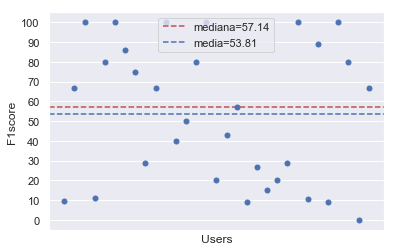

In [35]:
mod_1_ponder_2 = run_model(users,vars_for_grafo_1,data,2)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% 


Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Variables ponder


Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.87% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.74% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Canti

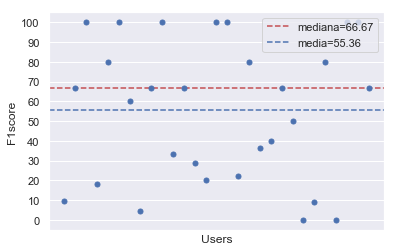

In [36]:
mod_3_ponder_2 = run_model(users,vars_for_grafo_3,data,2)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% 

Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 5.6% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 12.5% | F1: 22.22%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude :


Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.56% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.66% | Accuracy: 99.35% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.31% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Variables ponderadas

Mod

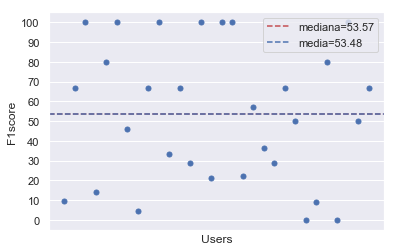

In [37]:
mod_4_ponder_2 = run_model(users,vars_for_grafo_4,data,2)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% 


Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 8
 - TFP: 5.6% | Accuracy: 94.44% | Recall: 100.0%  | Precision: 12.5% | F1: 22.22%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4
Variables ponderad


Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.56% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.66% | Accuracy: 99.35% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.31% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Variables ponderadas

Mod

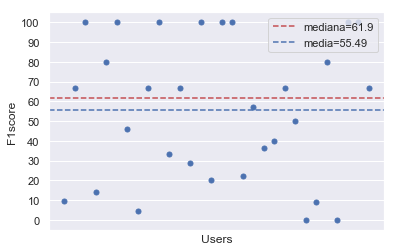

In [38]:
mod_5_ponder_2 = run_model(users,vars_for_grafo_5,data,2)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% 


Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 1.66% | Accuracy: 98.36% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 19
 - TFP: 14.4% | Accuracy: 85.71% | Recall: 100.0%  | Precision: 5.26% | F1: 9.99%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4
Variables pondera

Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.66% | Accuracy: 99.35% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.31% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 11.11% | Accuracy: 72.73% | Recall: 0.0%  | Precision: 0.0% | F1: 0.0%


----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude : 3

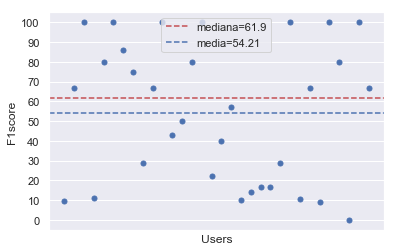

In [39]:
mod_7_ponder_2 = run_model(users,vars_for_grafo_7,data,2)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% 


Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 1.66% | Accuracy: 98.36% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 16.0% | Accuracy: 84.13% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4
Variables pondera


Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.66% | Accuracy: 99.35% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.31% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Variables ponde

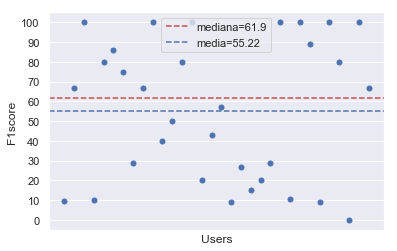

In [40]:
mod_8_ponder_2 = run_model(users,vars_for_grafo_8,data,2)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% 

Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 1.66% | Accuracy: 98.36% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 16.0% | Accuracy: 84.13% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude 


Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.56% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.66% | Accuracy: 99.35% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.31% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Variables ponderadas

Mod

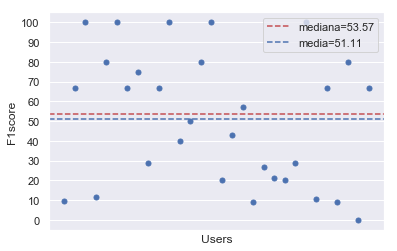

In [41]:
mod_9_ponder_2 = run_model(users,vars_for_grafo_9,data,2)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% 


Modelo
 - Cantidad de nodos outlier : 13
 - TFP: 6.08% | Accuracy: 93.99% | Recall: 100.0%  | Precision: 15.38% | F1: 26.66%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 19
 - TFP: 14.4% | Accuracy: 85.71% | Recall: 100.0%  | Precision: 5.26% | F1: 9.99%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4
Variables ponde


Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 2.33% | Accuracy: 97.78% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 0.66% | Accuracy: 99.35% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Variables ponderadas

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.31% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Variables ponde

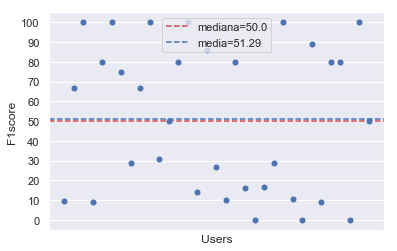

In [42]:
mod_10_ponder_2 = run_model(users,vars_for_grafo_10,data,2)

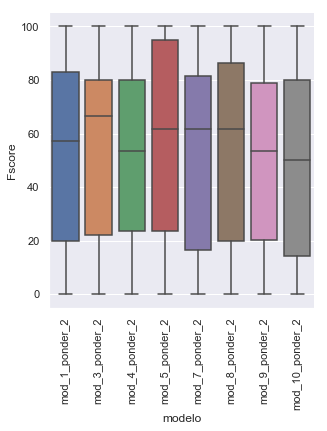

In [43]:
df_prueba = pd.DataFrame(list(mod_1_ponder_2.items()),columns = ['users','Fscore'])
df_prueba['modelo'] = "mod_1_ponder_2"

df_prueba_ponder_3_2 = pd.DataFrame(list(mod_3_ponder_2.items()),columns = ['users','Fscore'])
df_prueba_ponder_3_2['modelo'] = "mod_3_ponder_2"
df_prueba = df_prueba.append(df_prueba_ponder_3_2)

df_prueba_ponder_4_2 = pd.DataFrame(list(mod_4_ponder_2.items()),columns = ['users','Fscore'])
df_prueba_ponder_4_2['modelo'] = "mod_4_ponder_2"
df_prueba = df_prueba.append(df_prueba_ponder_4_2)


df_prueba_ponder_5_2  = pd.DataFrame(list(mod_5_ponder_2.items()),columns = ['users','Fscore'])
df_prueba_ponder_5_2['modelo'] = "mod_5_ponder_2"
df_prueba = df_prueba.append(df_prueba_ponder_5_2)

df_prueba_ponder_7_2 = pd.DataFrame(list(mod_7_ponder_2.items()),columns = ['users','Fscore'])
df_prueba_ponder_7_2['modelo'] = "mod_7_ponder_2"
df_prueba = df_prueba.append(df_prueba_ponder_7_2)

df_prueba_ponder_8_2 = pd.DataFrame(list(mod_8_ponder_2.items()),columns = ['users','Fscore'])
df_prueba_ponder_8_2 ['modelo'] = "mod_8_ponder_2"
df_prueba = df_prueba.append(df_prueba_ponder_8_2)


df_prueba_ponder_9_2 = pd.DataFrame(list(mod_9_ponder_2.items()),columns = ['users','Fscore'])
df_prueba_ponder_9_2 ['modelo'] = "mod_9_ponder_2"
df_prueba = df_prueba.append(df_prueba_ponder_9_2)


df_prueba_ponder_10_2 = pd.DataFrame(list(mod_10_ponder_2.items()),columns = ['users','Fscore'])
df_prueba_ponder_10_2 ['modelo'] = "mod_10_ponder_2"
df_prueba = df_prueba.append(df_prueba_ponder_10_2)

sns.catplot(x="modelo", y="Fscore", kind="box",data=df_prueba)
plt.xticks(rotation=90)
plt.show()

##### B) Modelos con eliminación de ejes con bajo peso
    Ejemplo menor a dos
    
    mod_i_peso_j : "i" es el vars_for_grafo_i y "j" es el umbral de peso de ejes que decido para eliminar
    
    vars_for_grafo_1, vars_for_grafo_3, vars_for_grafo_4, vars_for_grafo_5, vars_for_grafo_7, vars_for_grafo_8, vars_for_grafo_9, vars_for_grafo_10

In [44]:
def carga_ejes_con_peso(nodos_dataset,red,vars_ponderadas=1):
    print("Eliminacion de ejes")
    # Esta función toma el data set preparado (nodos_dataset), prepara la info de los ejes correspondientes y los carga a la red
    
    # El método que uso para crear los ejes con peso es el siguiente:    
    # Creo un diccionario donde las "Key" serán las tuplas de nodos que comparten valor, que será un eje
    # los "values" serán la cantidad de variables para las que ambos nodos comparten valor, que será el peso del eje
    
    dict_tuplas = dict() # este es el diccionario auxiliar para cargar los ejes con pesos
    
    variables = list(nodos_dataset.columns[3:]) 
    # recorro todas las variables
    for variable in variables:
        #if vars_ponderadas == "Y" and (variable == 'user_caract' or variable == 'ip_address'):
        if variable == 'user_caract':
            ponder = vars_ponderadas
        else:
            ponder = 1

        #    saco los valores unicos para la variable en cuestion, genero una lista
        values = list(np.unique(nodos_dataset[variable].values))
        
         
        for value in values:
            # genero la lista de nodos que comparten un mismo valor para la variable en cuestion
            list_nodos = list(nodos_dataset[nodos_dataset[variable] == value]['Label'].values)
            # genero todas las combinaciones de valores en un la lista list_nodos, para luego cargar los ejes 
            if len(list_nodos) > 1:
                combinations = set(itertools.combinations(list_nodos, 2))
                list_edges = list(combinations) # es una lista de tuplas que comparten nodo
                # ahora tengo que ver si las tuplas que guarde en list_edges ya existen en el diccionario dict_tuplas
                for tupla in list_edges:
                    if tupla in dict_tuplas:
                        dict_tuplas[tupla] = ((dict_tuplas[tupla] + 1)*ponder)
                    else:
                        dict_tuplas[tupla] = (1 * ponder)
                        
        
    edges_to_pop = [ i for i in dict_tuplas if dict_tuplas[i] < 3] 

    for edge in edges_to_pop:
        dict_tuplas.pop(edge)


    #########################################################################################
    

    # Cargo los ejes
    red.add_edges_from(list(dict_tuplas.keys()))

    # Cargo los respectivos pesos
    for tupla in red.edges():
        red.edges[(tupla)]["weight"]=dict_tuplas[tupla]            
    



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | 

Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4



Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 9.3% | Accuracy: 91.11% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Elimina

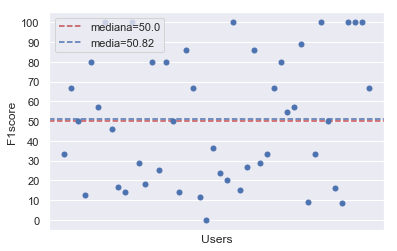

In [45]:
mod_1_peso_2 = run_model(users,vars_for_grafo_1,data)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 10.31% | Accuracy: 89.74% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 13.79% | Accuracy: 86.67% | Recall: 100.0%  | Precision: 20.0%


Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 97.85% | Recall: 33.33%  | Precision: 100.0% | F1: 50.0%


----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes



Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 95.74% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 -

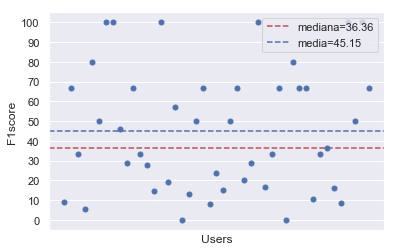

In [46]:
mod_2_peso_2 = run_model(users,vars_for_grafo_2,data)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 17.24% | Accuracy: 83.33% | Recall: 100.0%  | Precision: 16.67% 

Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 7.2% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4



Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.28% | Accuracy: 84.44% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.99% | Accuracy: 86.11% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Eli

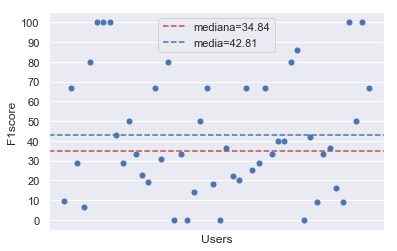

In [47]:
mod_3_peso_2 = run_model(users,vars_for_grafo_3,data)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 12.05% | Accuracy: 88.24% | Recall: 100.0%  | Precision: 16.67% | F1: 28.58%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 17.24% | Accuracy: 83.33% | Recall: 100.0%  | Precision: 16.6


Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 7.2% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4
Eliminacion de ejes


Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.99% | Accuracy: 86.11% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude 

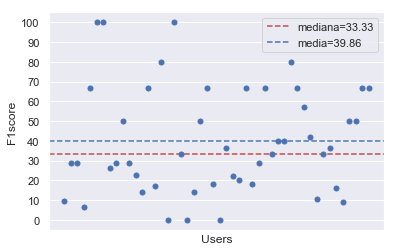

In [48]:
mod_4_peso_2 = run_model(users,vars_for_grafo_4,data)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 20
 - TFP: 9.79% | Accuracy: 90.26% | Recall: 100.0%  | Precision: 5.0% | F1: 9.52%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 12
 - TFP: 17.24% | Accuracy: 83.33% | Recall: 100.0%  | Precision: 16.67% 


Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 10
 - TFP: 7.2% | Accuracy: 92.86% | Recall: 100.0%  | Precision: 10.0% | F1: 18.18%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4
Eliminacion de ejes



Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 16.28% | Accuracy: 84.44% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 13.99% | Accuracy: 86.11% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Eli

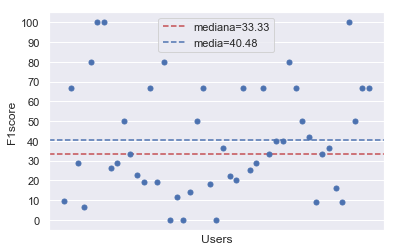

In [49]:
mod_5_peso_2 = run_model(users,vars_for_grafo_5,data)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | 


Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 1.66% | Accuracy: 98.36% | Recall: 100.0%  | Precision: 40.0% | F1: 57.14%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 1
 - TFP: 0.0% | Accuracy: 98.75% | Recall: 50.0%  | Precision: 100.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4
Eliminaci

Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude :

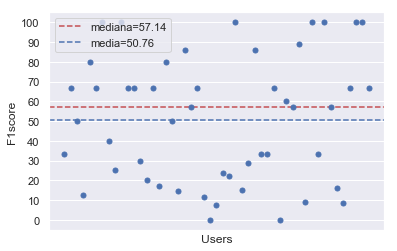

In [50]:
mod_7_peso_2 = run_model(users,vars_for_grafo_7,data)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | 


Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 16
 - TFP: 12.0% | Accuracy: 88.1% | Recall: 100.0%  | Precision: 6.25% | F1: 11.76%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4
Eliminacion de ejes


Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 81.82% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '7244212' :
----------------------------------

Data
 - Cantidad de observaciones        : 18
 - Cantidad de observaciones fraude :

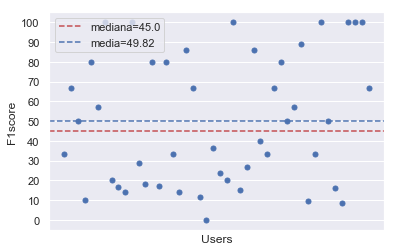

In [51]:
mod_8_peso_2 = run_model(users,vars_for_grafo_8,data)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 2.06% | Accuracy: 97.95% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 2.41% | Accuracy: 97.65% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | 

Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 4
 - TFP: 1.1% | Accuracy: 98.91% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 17.6% | Accuracy: 82.54% | Recall: 100.0%  | Precision: 4.35% | F1: 8.34%


----------------------------------
ANALISIS PARA USUARIO '4289041' :
----------------------------------

Data
 - Cantidad de observaciones        : 26
 - Cantidad de observaciones fraude : 4



Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 9.3% | Accuracy: 91.11% | Recall: 100.0%  | Precision: 33.33% | F1: 50.0%


----------------------------------
ANALISIS PARA USUARIO '6760509' :
----------------------------------

Data
 - Cantidad de observaciones        : 153
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 23
 - TFP: 13.91% | Accuracy: 86.27% | Recall: 100.0%  | Precision: 8.7% | F1: 16.01%


----------------------------------
ANALISIS PARA USUARIO '6915402' :
----------------------------------

Data
 - Cantidad de observaciones        : 144
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 22
 - TFP: 14.69% | Accuracy: 85.42% | Recall: 100.0%  | Precision: 4.55% | F1: 8.7%


----------------------------------
ANALISIS PARA USUARIO '6992018' :
----------------------------------

Data
 - Cantidad de observaciones        : 22
 - Cantidad de observaciones fraude : 4
Elimina

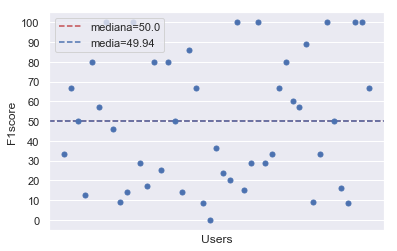

In [52]:
mod_9_peso_2 = run_model(users,vars_for_grafo_9,data)



----------------------------------
ANALISIS PARA USUARIO '150073' :
----------------------------------

Data
 - Cantidad de observaciones        : 195
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 21
 - TFP: 10.31% | Accuracy: 89.74% | Recall: 100.0%  | Precision: 4.76% | F1: 9.09%


----------------------------------
ANALISIS PARA USUARIO '2109180' :
----------------------------------

Data
 - Cantidad de observaciones        : 85
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 3
 - TFP: 1.2% | Accuracy: 98.82% | Recall: 100.0%  | Precision: 66.67% | F1: 80.0%


----------------------------------
ANALISIS PARA USUARIO '2400976' :
----------------------------------

Data
 - Cantidad de observaciones        : 60
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 6.9% | Accuracy: 93.33% | Recall: 100.0%  | Precision: 33.33% | 


Modelo
 - Cantidad de nodos outlier : 6
 - TFP: 3.33% | Accuracy: 96.77% | Recall: 100.0%  | Precision: 50.0% | F1: 66.67%


----------------------------------
ANALISIS PARA USUARIO '4170942' :
----------------------------------

Data
 - Cantidad de observaciones        : 183
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 9
 - TFP: 3.87% | Accuracy: 96.17% | Recall: 100.0%  | Precision: 22.22% | F1: 36.36%


----------------------------------
ANALISIS PARA USUARIO '4225979' :
----------------------------------

Data
 - Cantidad de observaciones        : 80
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 97.5% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '4285617' :
----------------------------------

Data
 - Cantidad de observaciones        : 126
 - Cantidad de observaciones fraude : 1
Eliminacion de ej


Modelo
 - Cantidad de nodos outlier : 0
 - TFP: 0.0% | Accuracy: 99.46% | Recall: 0.0%  | Precision: X% | F1: X%


----------------------------------
ANALISIS PARA USUARIO '6488331' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 1
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 5
 - TFP: 8.7% | Accuracy: 91.49% | Recall: 100.0%  | Precision: 20.0% | F1: 33.33%


----------------------------------
ANALISIS PARA USUARIO '6619023' :
----------------------------------

Data
 - Cantidad de observaciones        : 47
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes

Modelo
 - Cantidad de nodos outlier : 2
 - TFP: 0.0% | Accuracy: 100.0% | Recall: 100.0%  | Precision: 100.0% | F1: 100.0%


----------------------------------
ANALISIS PARA USUARIO '6726081' :
----------------------------------

Data
 - Cantidad de observaciones        : 45
 - Cantidad de observaciones fraude : 2
Eliminacion de ejes


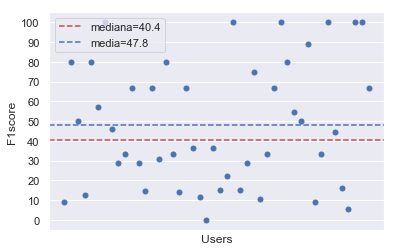

In [53]:
mod_10_peso_2 = run_model(users,vars_for_grafo_10,data)

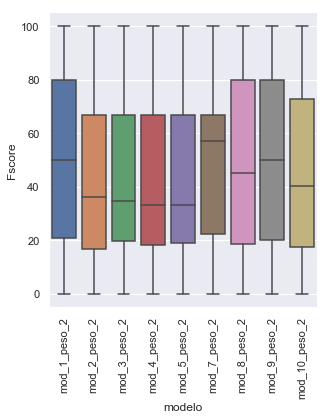

In [54]:
# grafico de comparativo de los modelos 

df_prueba = pd.DataFrame(list(mod_1_peso_2.items()),columns = ['users','Fscore'])
df_prueba['modelo'] = "mod_1_peso_2"


df_prueba_peso_2_2  = pd.DataFrame(list(mod_2_peso_2.items()),columns = ['users','Fscore'])
df_prueba_peso_2_2['modelo'] = "mod_2_peso_2"
df_prueba = df_prueba.append(df_prueba_peso_2_2)


df_prueba_peso_3_2  = pd.DataFrame(list(mod_3_peso_2.items()),columns = ['users','Fscore'])
df_prueba_peso_3_2['modelo'] = "mod_3_peso_2"
df_prueba = df_prueba.append(df_prueba_peso_3_2)


df_prueba_peso_4_2   = pd.DataFrame(list(mod_4_peso_2.items()),columns = ['users','Fscore'])
df_prueba_peso_4_2['modelo'] = "mod_4_peso_2"
df_prueba = df_prueba.append(df_prueba_peso_4_2)


df_prueba_peso_5_2  = pd.DataFrame(list(mod_5_peso_2.items()),columns = ['users','Fscore'])
df_prueba_peso_5_2['modelo'] = "mod_5_peso_2"
df_prueba = df_prueba.append(df_prueba_peso_5_2)


df_prueba_peso_7_2  = pd.DataFrame(list(mod_7_peso_2.items()),columns = ['users','Fscore'])
df_prueba_peso_7_2['modelo'] = "mod_7_peso_2"
df_prueba = df_prueba.append(df_prueba_peso_7_2)


df_prueba_peso_8_2  = pd.DataFrame(list(mod_8_peso_2.items()),columns = ['users','Fscore'])
df_prueba_peso_8_2['modelo'] = "mod_8_peso_2"
df_prueba = df_prueba.append(df_prueba_peso_8_2)


df_prueba_peso_9_2  = pd.DataFrame(list(mod_9_peso_2.items()),columns = ['users','Fscore'])
df_prueba_peso_9_2['modelo'] = "mod_9_peso_2"
df_prueba = df_prueba.append(df_prueba_peso_9_2)


df_prueba_peso_10_2  = pd.DataFrame(list(mod_10_peso_2.items()),columns = ['users','Fscore'])
df_prueba_peso_10_2['modelo'] = "mod_10_peso_2"
df_prueba = df_prueba.append(df_prueba_peso_10_2)

sns.catplot(x="modelo", y="Fscore", kind="box",data=df_prueba)
plt.xticks(rotation=90)
plt.show()

Fin de la notebook